In [1]:
#coding=utf-8
%matplotlib inline 
import matplotlib.pyplot as plt
import sys 
from imp import reload 
reload(sys)  
plt.rc('font', family='SimHei', size=13)
from __future__ import division 
import pandas as pd
from IPython.display import Image
import pandas as pd
import numpy as np

In [2]:
problemPlat=pd.read_csv('problemPlat.csv',parse_dates=True)#问题平台  时间序列

In [3]:
problemPlat.index=problemPlat['proTime']

In [4]:
problemPlat.index=problemPlat.index.to_datetime()#index 转化为 datetime类型

In [5]:
problemPlat

,id,allLetter,area,firstLetter,onlineTime,peopleNumber,platId,platName,proTime,problemTime,regCapital,status1,status2,type
2011-12-16,1,yifengjiedai,浙江,yfjd,2011-03-05 00:00:00,0,2254,亿峰借贷,2011-12,2011-12-31 00:00:00,0,0,0,停业
2011-12-16,2,dinglidai,北京,dld,2011-01-01 00:00:00,0,2255,鼎力贷,2011-12,2011-12-31 00:00:00,10,0,0,停业
2011-12-16,3,xueshengjiedaiwang,北京,xsjdw,2011-01-01 00:00:00,0,2256,学生借贷网,2011-12,2011-12-31 00:00:00,0,0,0,停业
2011-12-16,4,mayidai,重庆,myd,2011-01-01 00:00:00,0,2257,蚂蚁贷,2011-12,2011-12-31 00:00:00,0,0,0,跑路
2011-12-16,5,jishidai,河南,jsd,2011-01-01 00:00:00,0,2282,及时贷,2011-12,2011-12-31 00:00:00,1000,0,0,跑路
2011-11-16,6,kongzhongdai,江苏,kzd,2011-01-01 00:00:00,0,2286,空中贷,2011-11,2011-11-01 00:00:00,0,0,0,停业
2011-11-16,7,geilidai,广西,gld,2011-01-01 00:00:00,0,2281,给力贷,2011-11,2011-11-01 00:00:00,0,0,0,跑路
2011-10-16,8,tianshijihua,云南,tsjh,2011-01-01 00:00:00,0,2285,天使计划,2011-10,2011-10-01 00:00:00,0,0,0,跑路
2011-09-16,9,beierchuangtou,江苏,bect,2011-01-01 00:00:00,0,2284,贝尔创投,2011-09,2011-09-01 00:00:00,0,0,0,跑路
2011-07-16,10,hahadai7,上海,hhd7,2009-07-01 00:00:00,0,5179,哈哈贷（沪）,2011-07,2011-07-21 00:00:00,0,0,1,停业


D:\Anaconda\lib\site-packages\ipykernel\__main__.py:1: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).count()
  if __name__ == '__main__':


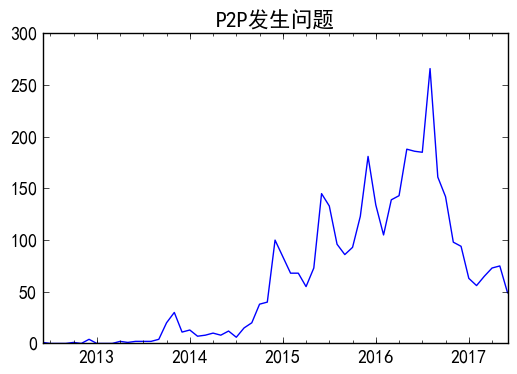

In [6]:
problemPlat['id']['2012':'2017'].resample('M',how='count').plot(title='P2P发生问题')#发生问题P2P平台数量 随时间变化趋势

In [7]:
#问题分类
data1=problemPlat[problemPlat['type']=='跑路']
data2=problemPlat[problemPlat['type']=='停业']
data3=problemPlat[problemPlat['type']=='提现困难']
data4=problemPlat[problemPlat['type']=='经侦介入']
data5=problemPlat[problemPlat['type']=='转型']

D:\Anaconda\lib\site-packages\ipykernel\__main__.py:2: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).count()
  from ipykernel import kernelapp as app
D:\Anaconda\lib\site-packages\ipykernel\__main__.py:3: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).count()
  app.launch_new_instance()
D:\Anaconda\lib\site-packages\ipykernel\__main__.py:4: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).count()
D:\Anaconda\lib\site-packages\ipykernel\__main__.py:5: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).count()
D:\Anaconda\lib\site-packages\ipykernel\__main__.py:6: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).count()


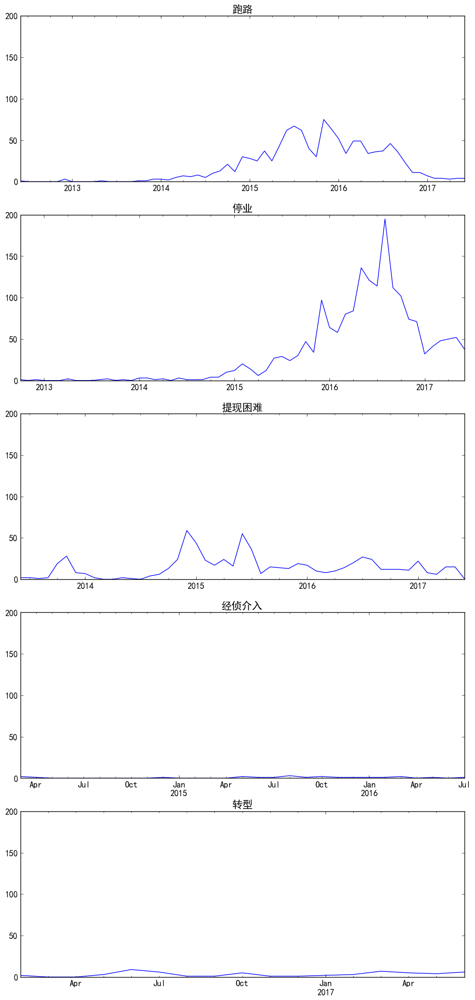

In [8]:
figure,axes=plt.subplots(nrows=5,ncols=1,sharey=True,figsize=(12,7))
data1['id']['2012':'2017'].resample('M',how='count').plot(label='跑路平台数量',ax=axes[0])
data2['id']['2012':'2017'].resample('M',how='count').plot(label='停业平台数量',ax=axes[1])
data3['id']['2012':'2017'].resample('M',how='count').plot(label='提现困难平台数量',ax=axes[2])
data4['id']['2012':'2017'].resample('M',how='count').plot(label='经侦介入平台数量',ax=axes[3])
data5['id']['2012':'2017'].resample('M',how='count').plot(label='转型平台数量',ax=axes[4])
axes[0].set_title('跑路')
axes[1].set_title('停业')
axes[2].set_title('提现困难')
axes[3].set_title('经侦介入')
axes[4].set_title('转型')
plt.subplots_adjust(top=3)

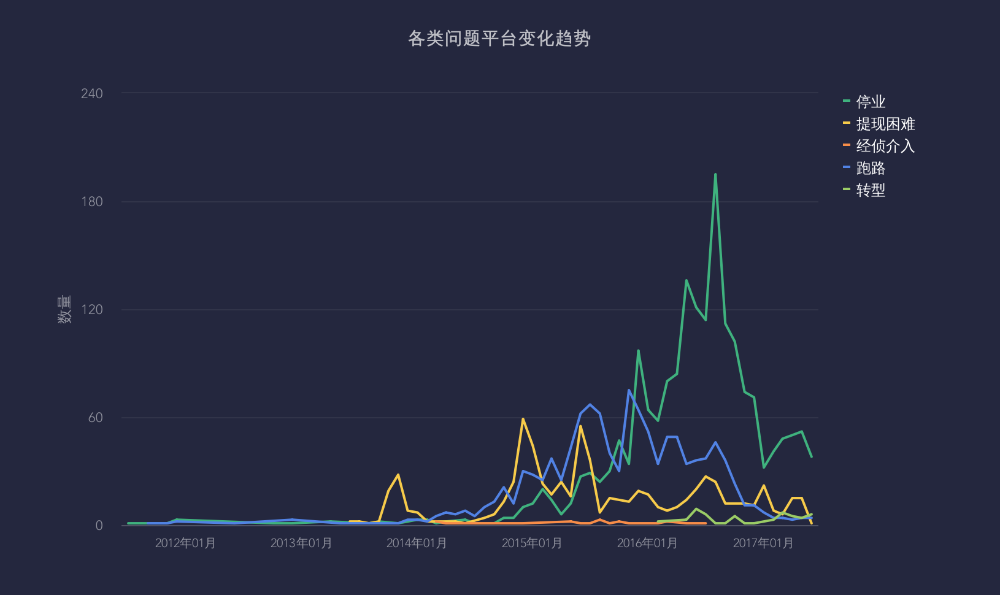

In [9]:
Image(filename='各类问题平台变化趋势.png', width=1024)

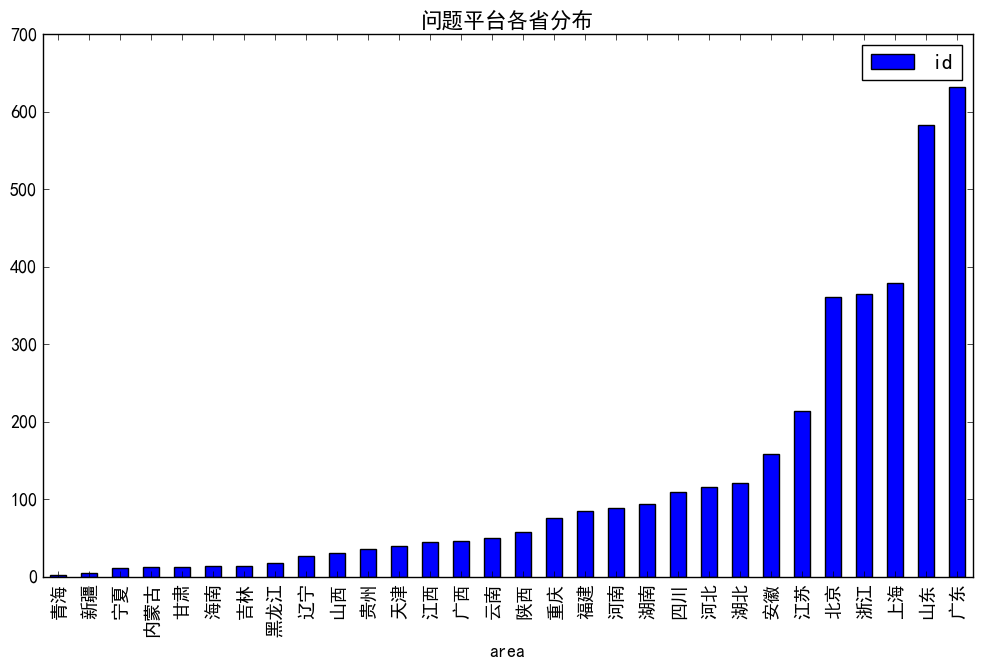

In [10]:
problemPlat.groupby('area').count().sort_values('id')['id'].plot(kind='bar',figsize=(12,7),title='问题平台各省分布')#各省问题平台数量
plt.legend(loc='best')

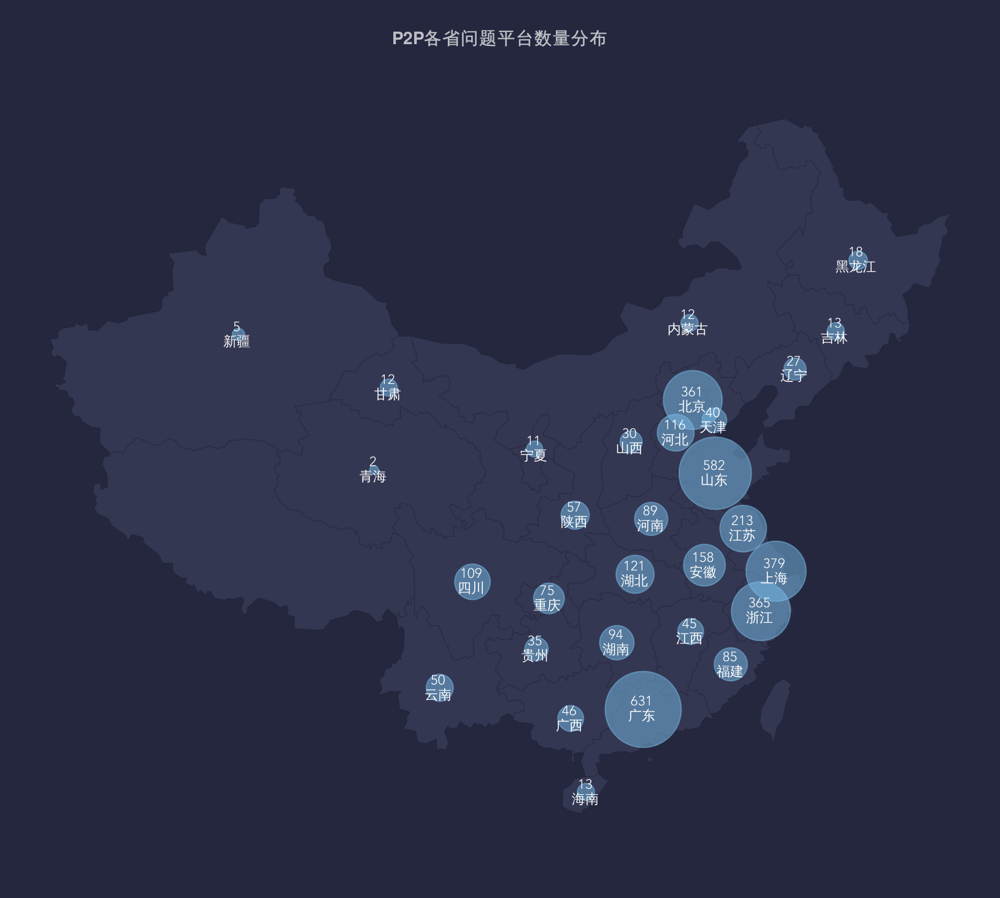

In [11]:
Image(filename='P2P各省问题平台数量分布.png', width=1024)#地图分布

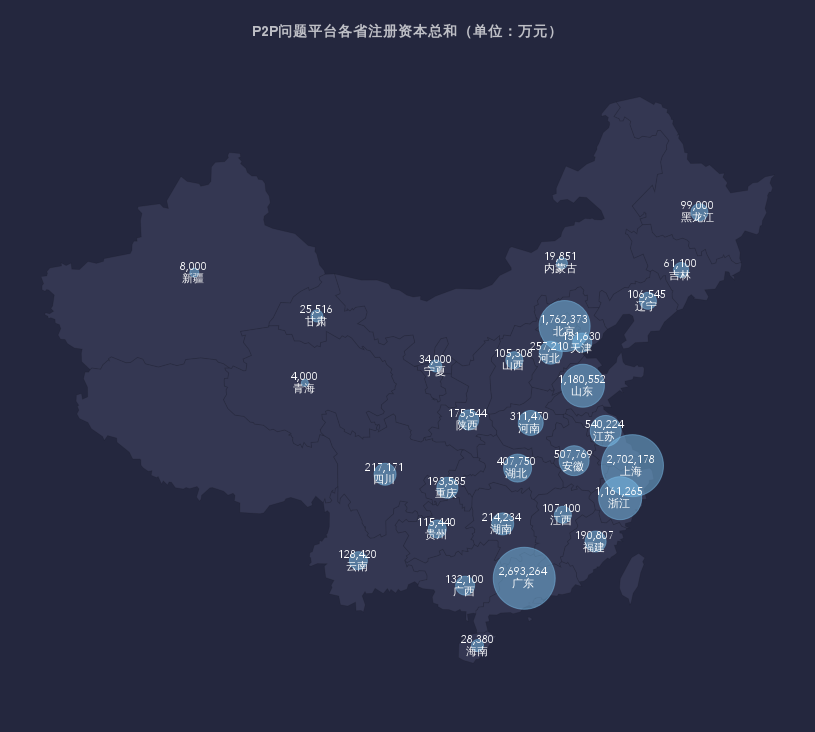

In [12]:
Image(filename='P2P问题平台各省注册资本总和（单位：万元）.png', width=1024)#以注册资本为规模大小判定

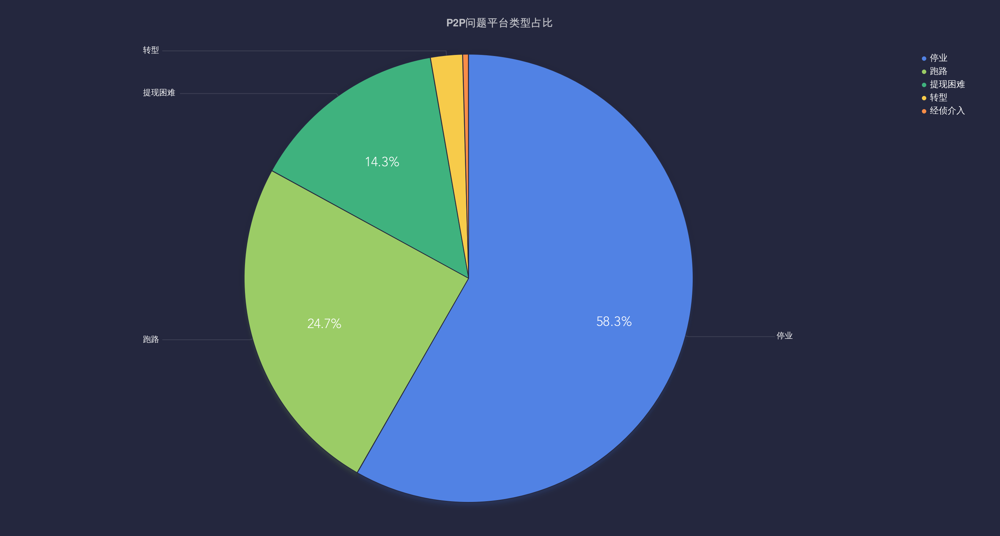

In [13]:
Image(filename='P2P问题平台类型占比.png', width=1024)

In [14]:
problemPlatDetail=pd.read_csv('problemPlatDetail.csv',parse_dates=True)#平台详细信息  大部分字段 缺失

In [15]:
problemPlatDetail

,id,actualCapital,aliasName,association,associationDetail,autoBid,autoBidCode,bankCapital,bankFunds,bidSecurity,...,transferExpenseDetail,trustCapital,trustCreditor,trustCreditorMonth,trustFunds,tzjPj,vipExpense,withTzj,withdrawExpense,platId
0,222,0.0,亿峰借贷,0,NaN,NaN,NaN,NaN,0.0,-,...,NaN,NaN,NaN,0,NaN,NaN,NaN,0,NaN,2254
1,223,0.0,鼎力贷,0,NaN,NaN,NaN,NaN,0.0,-,...,NaN,NaN,NaN,0,NaN,NaN,NaN,0,NaN,2255
2,224,0.0,学生借贷网,0,NaN,NaN,NaN,NaN,0.0,-,...,NaN,NaN,NaN,0,NaN,NaN,NaN,0,NaN,2256
3,225,0.0,蚂蚁贷,0,NaN,NaN,NaN,NaN,0.0,-,...,NaN,NaN,NaN,0,NaN,NaN,NaN,0,NaN,2257
4,226,1000.0,及时贷,0,NaN,NaN,NaN,NaN,0.0,-,...,NaN,NaN,NaN,0,NaN,NaN,NaN,0,NaN,2282
5,227,0.0,空中贷,0,NaN,NaN,NaN,NaN,0.0,-,...,NaN,NaN,NaN,0,NaN,NaN,NaN,0,NaN,2286
6,228,0.0,给力贷,0,NaN,NaN,NaN,NaN,0.0,-,...,NaN,NaN,NaN,0,NaN,NaN,NaN,0,NaN,2281
7,229,0.0,天使计划,0,NaN,NaN,NaN,NaN,0.0,-,...,NaN,NaN,NaN,0,NaN,NaN,NaN,0,NaN,2285
8,230,0.0,贝尔创投,0,NaN,NaN,NaN,NaN,0.0,-,...,NaN,NaN,NaN,0,NaN,NaN,NaN,0,NaN,2284
9,231,400.0,分分贷,0,NaN,支持,1.0,NaN,0.0,风险准备金,...,NaN,NaN,NaN,0,NaN,NaN,推广期免费(推广期免费),0,推广期免费(推广期免费),2287


In [16]:
platData=pd.read_csv('platData.csv',parse_dates=True) 

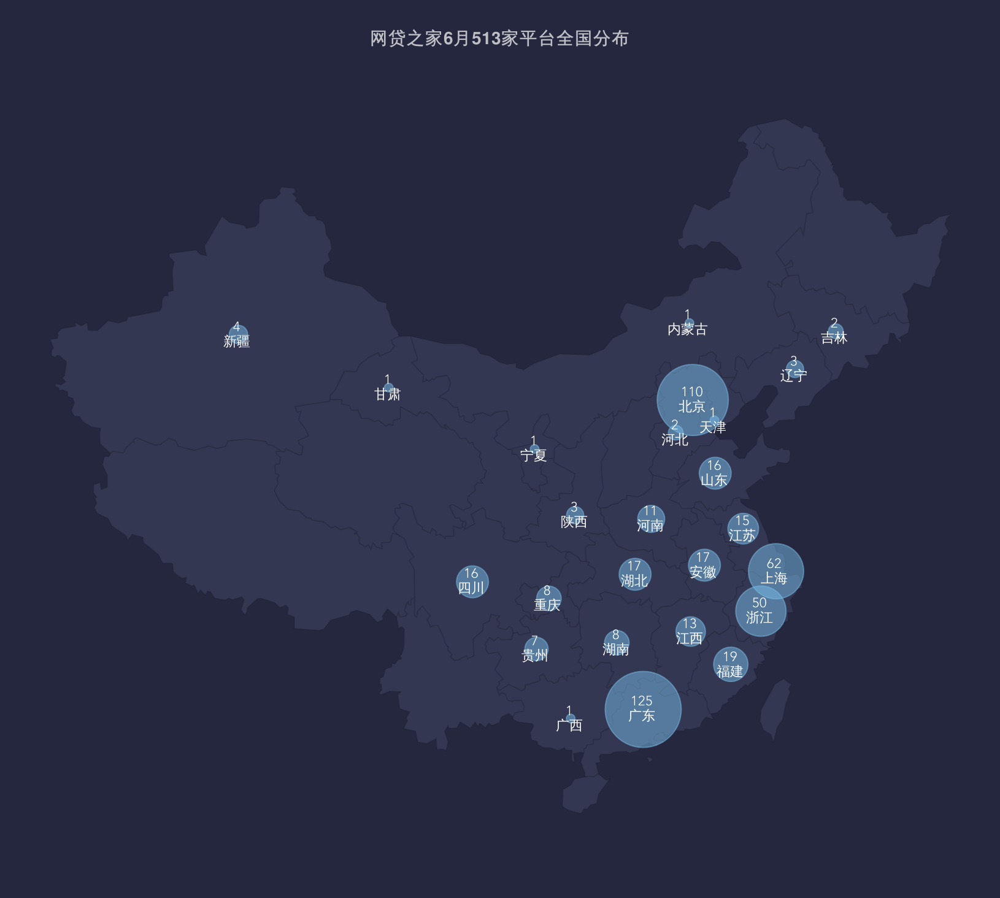

In [17]:
Image(filename='6月513家大中型平台全国分布.png', width=1024)

In [18]:
juneData=platData[platData['month']=='2017-06']#六月份的平台数据

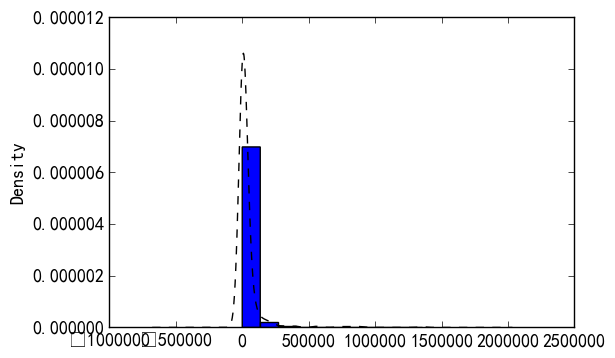

In [19]:
juneData['amount'].hist(normed=True)
juneData['amount'].plot(kind='kde',style='k--')#六月份交易量概率分布

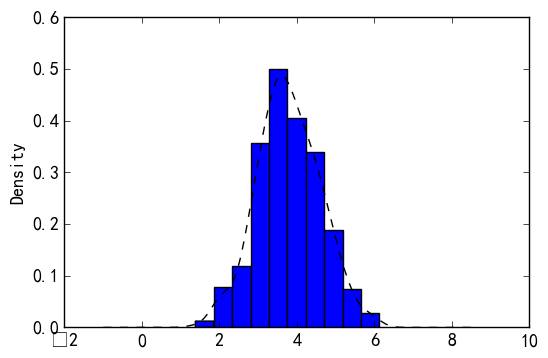

In [20]:
np.log10(juneData['amount']).hist(normed=True)
np.log10(juneData['amount']).plot(kind='kde',style='k--')#取 10 对数的 概率分布

In [21]:
juneData[juneData['avgBidMoney']>1000]['avgBidMoney']

2624    17021.76
Name: avgBidMoney, dtype: float64

In [22]:
platData.loc[platData['avgBidMoney']>1000]=0.42

In [23]:
platData['avgBidMoney'].max()

393.91000000000003

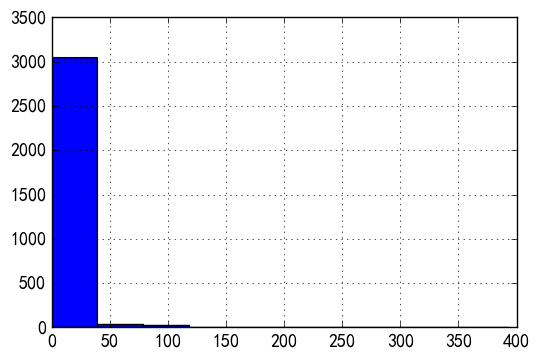

In [24]:
#平均投标金额
platData['avgBidMoney'].hist()

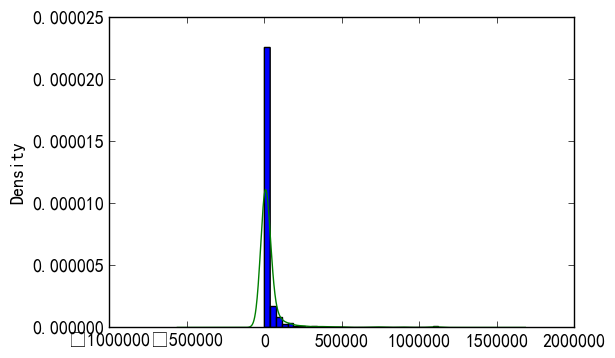

In [25]:
platData[platData['month']=='2017-05']['amount'].hist(bins=30,normed=True)
platData[platData['month']=='2017-05']['amount'].plot(kind='kde')#五月成交量分布

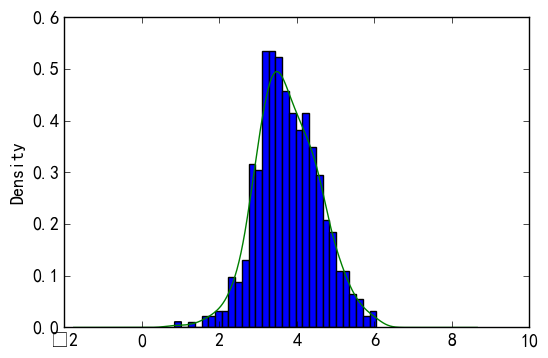

In [26]:
np.log10(platData[platData['month']=='2017-05']['amount']).hist(bins=30,normed=True)
np.log10(platData[platData['month']=='2017-05']['amount']).plot(kind='kde')  #五月成交量 取对数分布

In [27]:
platVolume=pd.read_csv('platVolume.csv',parse_dates=True)

In [28]:
platVolume['amount'].describe()

count    186873.000000
mean       1076.077639
std        6705.677496
min           0.000000
25%          20.000000
50%         113.140000
75%         525.300000
max      293479.320000
Name: amount, dtype: float64

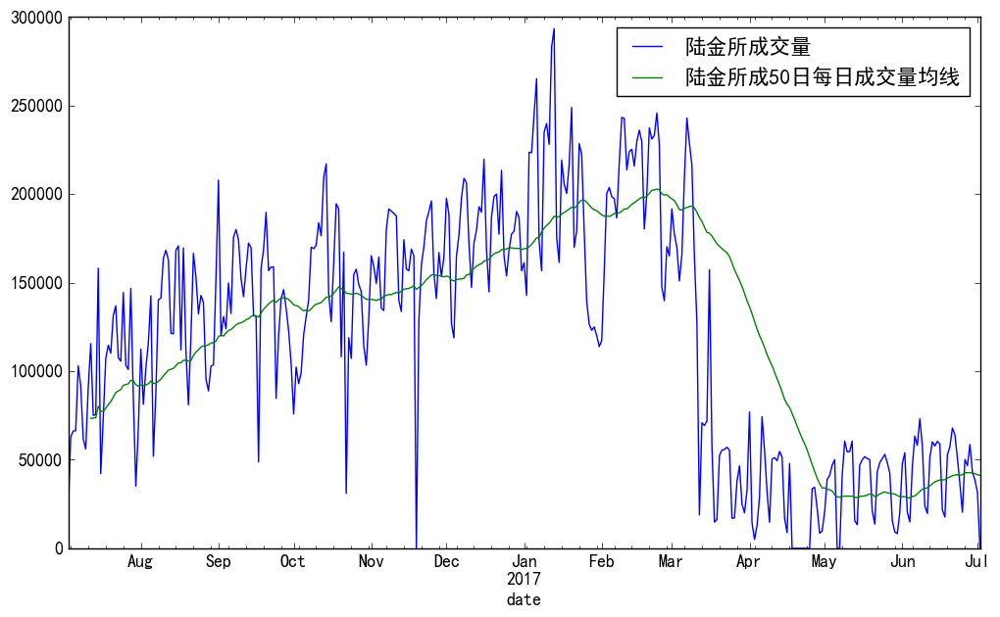

In [29]:
data59=platVolume[platVolume['wdzjPlatId']==59][['date','amount']]#获取陆金所成交量数据
data59.index=data59['date']
data59.index=pd.to_datetime(data59.index)
fig,ax=plt.subplots(ncols=1,nrows=1,figsize=(12,7))
data59['amount'].plot(label='陆金所成交量',ax=ax)
data59['amount'].rolling(window=50,min_periods=10).mean().plot(label='陆金所成50日每日成交量均线',ax=ax)
plt.legend(loc='best')

In [30]:
weixinIndex=pd.read_excel('weixinIndex.xlsx')

In [31]:
lujinWeixinIndex=weixinIndex[weixinIndex['word']=='陆金所']
lujinWeixinIndex.index=lujinWeixinIndex['date']
lujinWeixinIndex.index=pd.to_datetime(lujinWeixinIndex['date'])
lujinWeixinIndex.sort_index(inplace=True)#获取陆金所微信指数

D:\Anaconda\lib\site-packages\ipykernel\__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [32]:
lujinWeixinIndex

,date,word,index,子任务名称,indextype
date,,,,,
2017-05-12,2017-05-12 00:00:00,陆金所,86332,P2P平台微信指数,weixin
2017-05-13,2017-05-13 00:00:00,陆金所,58398,P2P平台微信指数,weixin
2017-05-14,2017-05-14 00:00:00,陆金所,61268,P2P平台微信指数,weixin
2017-05-15,2017-05-15 00:00:00,陆金所,99881,P2P平台微信指数,weixin
2017-05-16,2017-05-16 00:00:00,陆金所,114373,P2P平台微信指数,weixin
2017-05-17,2017-05-17 00:00:00,陆金所,115683,P2P平台微信指数,weixin
2017-05-18,2017-05-18 00:00:00,陆金所,150619,P2P平台微信指数,weixin
2017-05-19,2017-05-19 00:00:00,陆金所,141362,P2P平台微信指数,weixin
2017-05-20,2017-05-20 00:00:00,陆金所,126408,P2P平台微信指数,weixin


D:\Anaconda\lib\site-packages\ipykernel\__main__.py:2: FutureWarning: pd.rolling_corr is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=10,min_periods=10).corr(other=<Series>)
  from ipykernel import kernelapp as app


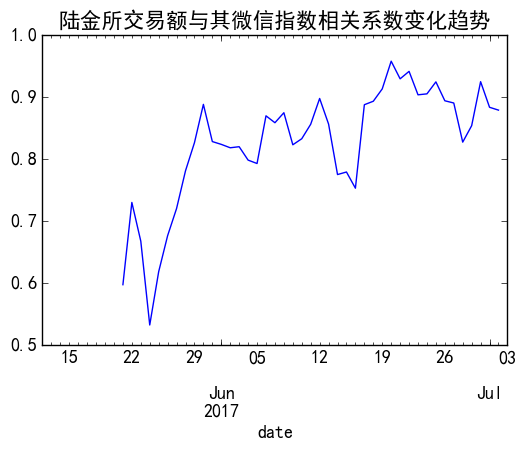

In [33]:
#陆金所成交额与微信指数相关系数变化趋势
pd.rolling_corr(data59['amount']['2017-05-12':'2017-07-03'],lujinWeixinIndex['index']['2017-05-12':'2017-07-03'],10,min_periods=10).plot(title='陆金所交易额与其微信指数相关系数变化趋势')
#可以看出成交额与微信指数明显正相关

In [34]:
#陆金所成交额变化趋势分析及预测
from fbprophet import Prophet
data59['y']=data59['amount']
data59['ds']=data59['date']
data59['ds']=pd.to_datetime(data59['ds'])
data59=data59[0:363]

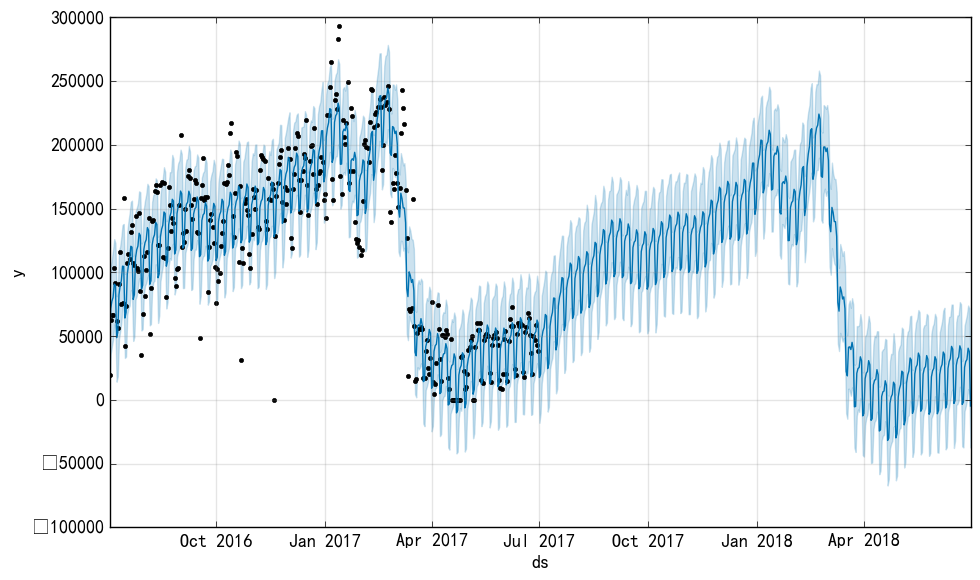

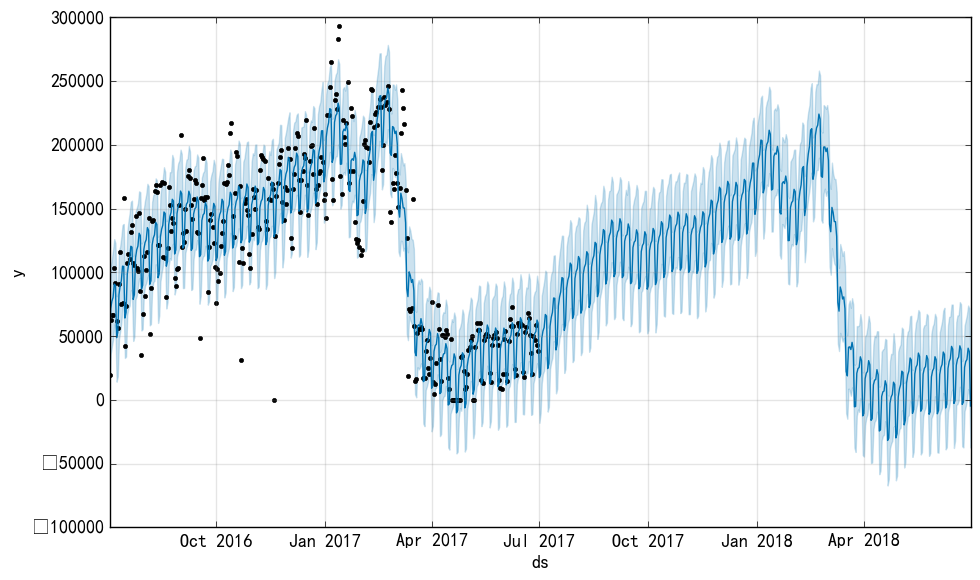

In [35]:
m=Prophet(yearly_seasonality=True)
m.fit(data59)
future=m.make_future_dataframe(periods=365)
future.tail()
forecast=m.predict(future)
m.plot(forecast)

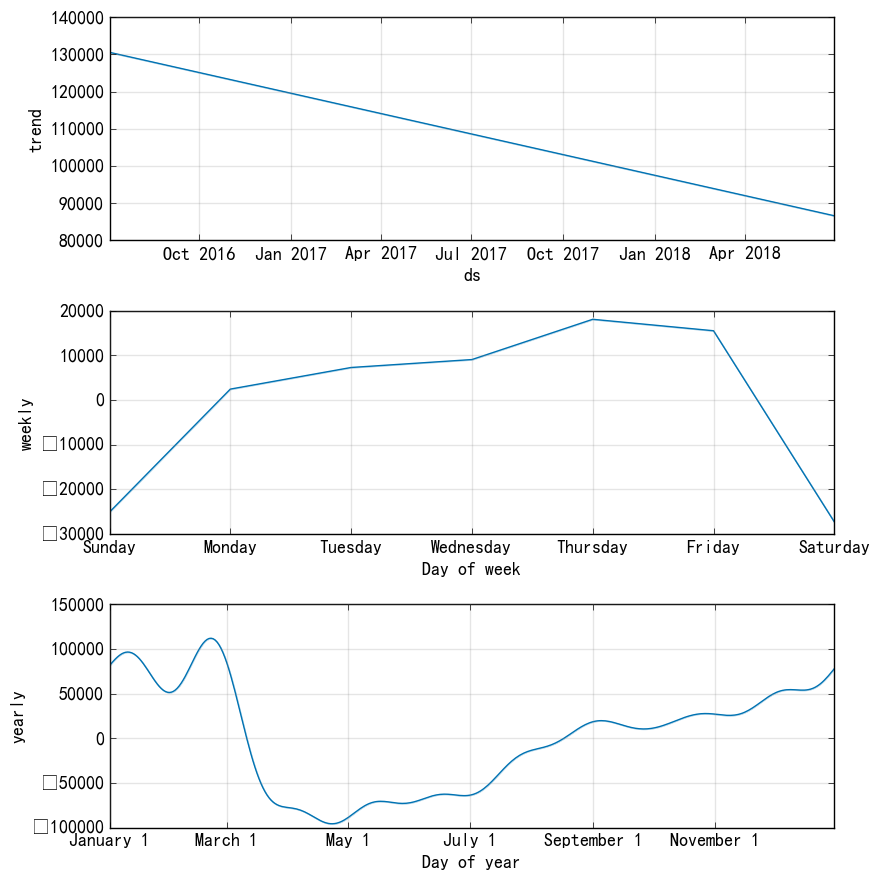

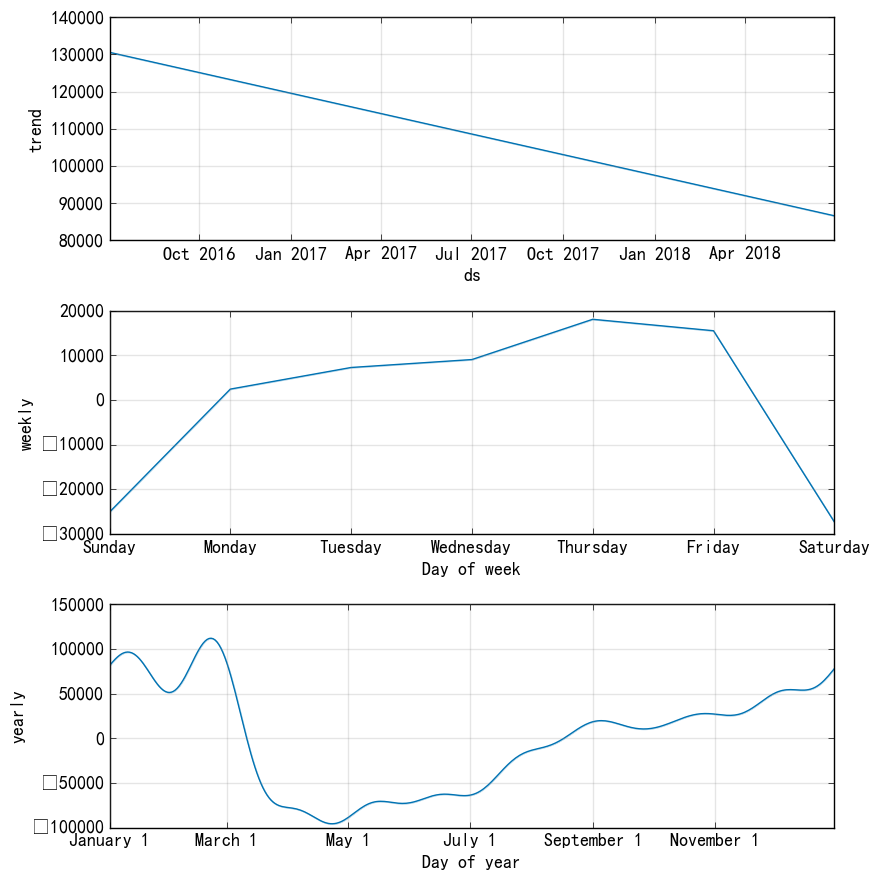

In [36]:
m.plot_components(forecast)

In [37]:
daySumData=platVolume.groupby('date').sum()#所有平台数据按日聚合

In [38]:
daySumData['y']=daySumData['amount']

In [39]:
daySumData['ds']=daySumData.index

In [40]:
daySumData

,id,amount,wdzjPlatId,y,ds
date,,,,,
2016-07-03,47746966,208207.12,993986,208207.12,2016-07-03
2016-07-04,47747478,451136.44,993986,451136.44,2016-07-04
2016-07-05,47747990,433931.13,993986,433931.13,2016-07-05
2016-07-06,47748502,438231.79,993986,438231.79,2016-07-06
2016-07-07,47749014,483804.33,993986,483804.33,2016-07-07
2016-07-08,47749526,488186.31,993986,488186.31,2016-07-08
2016-07-09,47750038,251843.82,993986,251843.82,2016-07-09
2016-07-10,47750550,224844.93,993986,224844.93,2016-07-10
2016-07-11,47751062,490655.29,993986,490655.29,2016-07-11


In [41]:
m=Prophet(weekly_seasonality=True)

In [42]:
#所有平台交易量趋势分析及预测
m.fit(daySumData)

Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


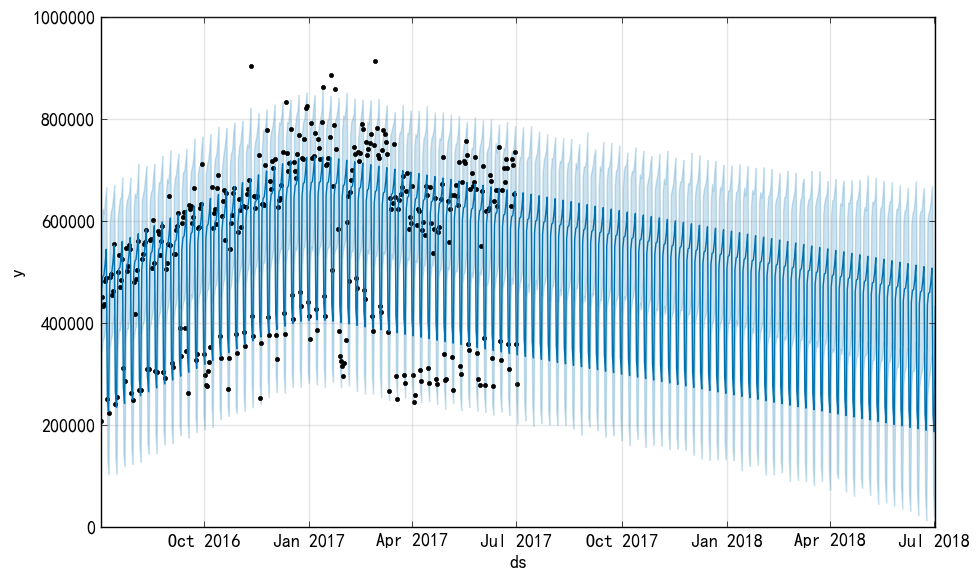

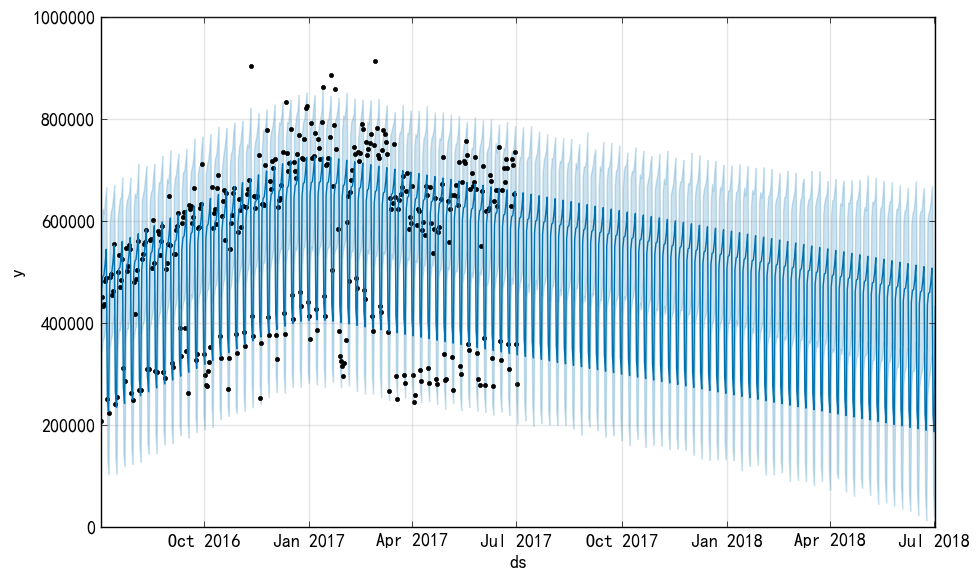

In [43]:
future=m.make_future_dataframe(periods=365)
forecast=m.predict(future)
m.plot(forecast)

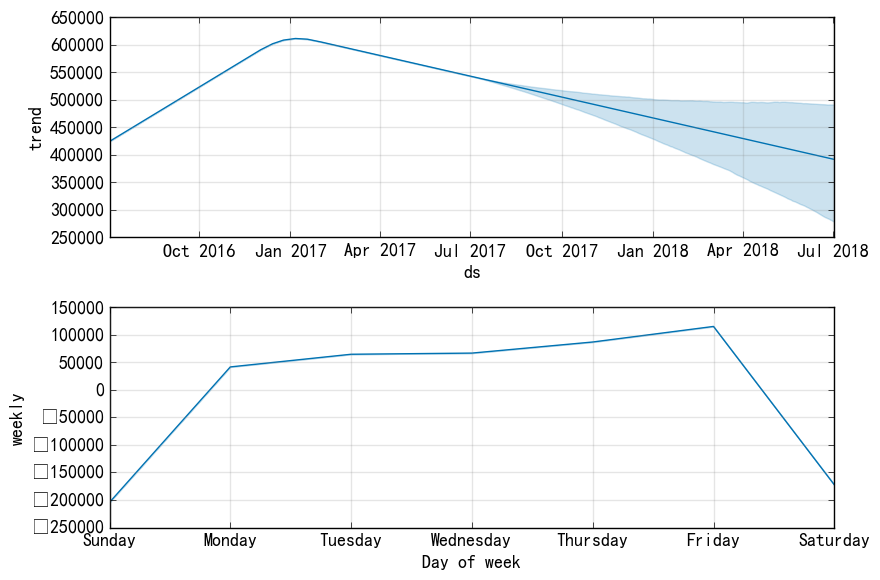

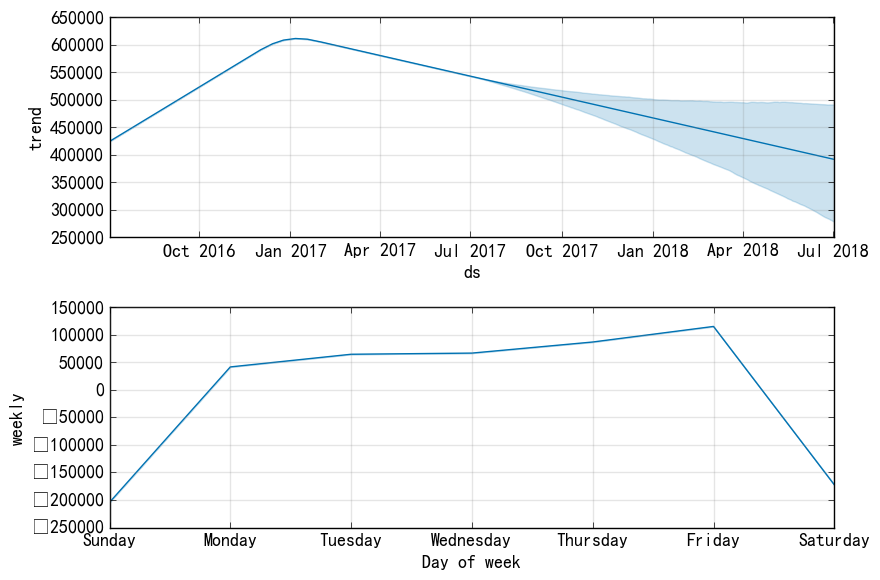

In [44]:
m.plot_components(forecast)

In [45]:
print('所有518家平台一年内的成交总和',platVolume['amount'].sum(),'万元')

所有518家平台一年内的成交总和 201089856.63999856 万元


In [46]:
platVolume.index

RangeIndex(start=0, stop=186873, step=1)

In [47]:
platVolume.index=platVolume['date']

In [48]:
platVolume.index=pd.to_datetime(platVolume.index)

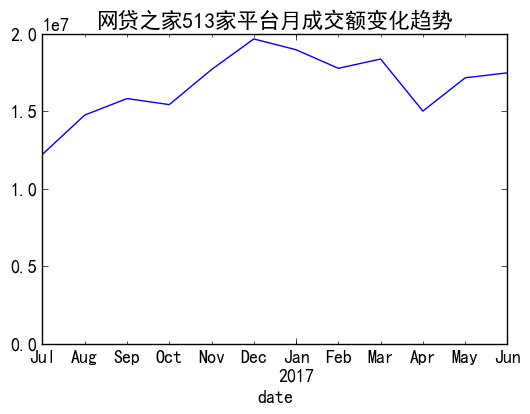

In [49]:
platVolume.resample('M').sum()['amount'].plot(title='网贷之家513家平台月成交额变化趋势',xlim=('2016-07','2017-06'))

In [50]:
platAmount=platVolume.groupby('wdzjPlatId').sum()#按平台划分这一年内的成交额
platAmount

,id,amount
wdzjPlatId,,
34,10724430,538247.56
37,36303265,51681.80
38,466470,7463926.83
40,1665495,2623615.83
49,29642015,88256.03
50,19783730,249894.32
53,11523780,508302.29
57,4196770,993143.23
59,66795,43616671.41


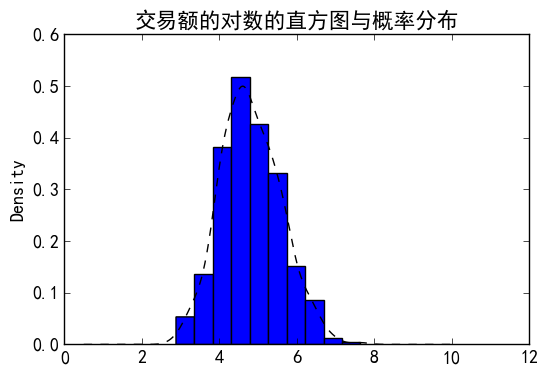

In [51]:
np.log10(platAmount['amount']).hist(bins=10,normed=True)
np.log10(platAmount['amount']).plot(kind='kde',style='k--',title='交易额的对数的直方图与概率分布')

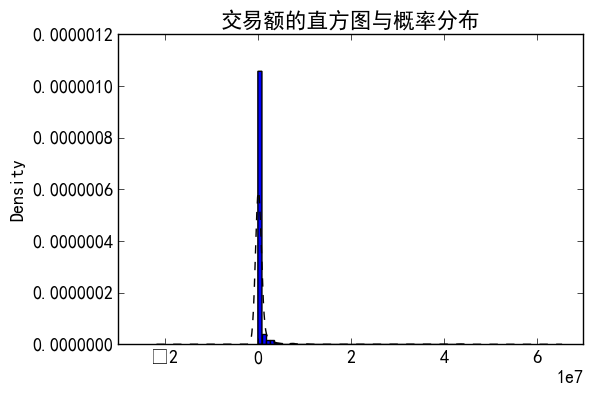

In [52]:
platAmount['amount'].hist(bins=50,normed=True)
platAmount['amount'].plot(kind='kde',style='k--',title='交易额的直方图与概率分布')

In [53]:
platAmount['wdzjPlatId']=platAmount.index.to_series()

In [54]:
allPlatDayData=platVolume.resample('D',how='sum')

D:\Anaconda\lib\site-packages\ipykernel\__main__.py:1: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).sum()
  if __name__ == '__main__':


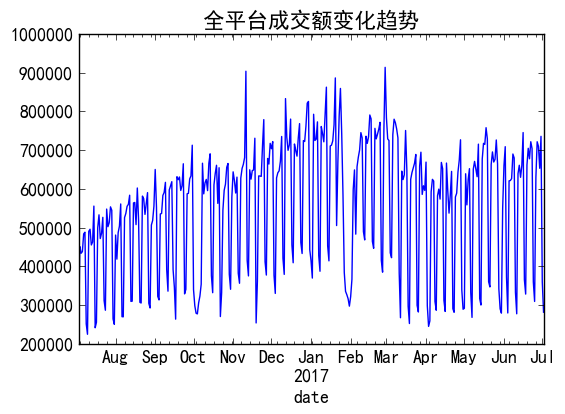

In [55]:
allPlatDayData['amount'].plot(title='全平台成交额变化趋势')

D:\Anaconda\lib\site-packages\ipykernel\__main__.py:1: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(center=False,window=50,min_periods=10).mean()
  if __name__ == '__main__':


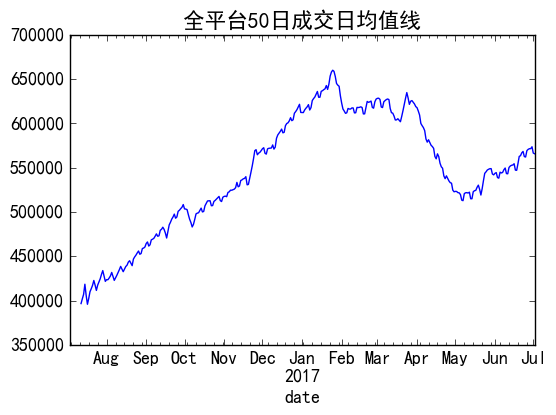

In [56]:
pd.rolling_mean(allPlatDayData['amount'],50,min_periods=10).plot(title='全平台50日成交日均值线')

D:\Anaconda\lib\site-packages\ipykernel\__main__.py:1: FutureWarning: pd.rolling_std is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(center=False,window=50,min_periods=10).std()
  if __name__ == '__main__':


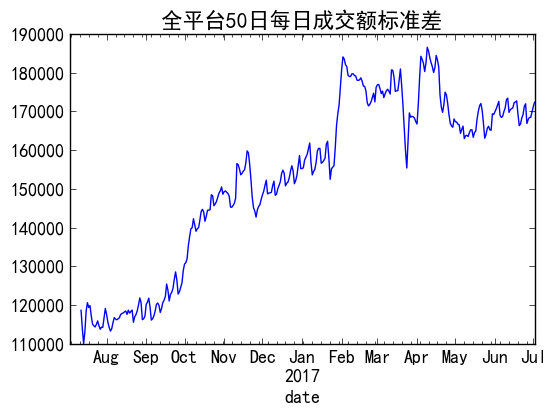

In [57]:
pd.rolling_std(allPlatDayData['amount'],50,min_periods=10).plot(title='全平台50日每日成交额标准差')

D:\Anaconda\lib\site-packages\ipykernel\__main__.py:2: FutureWarning: pd.rolling_corr is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=50,min_periods=50).corr(other=<Series>)
  from ipykernel import kernelapp as app


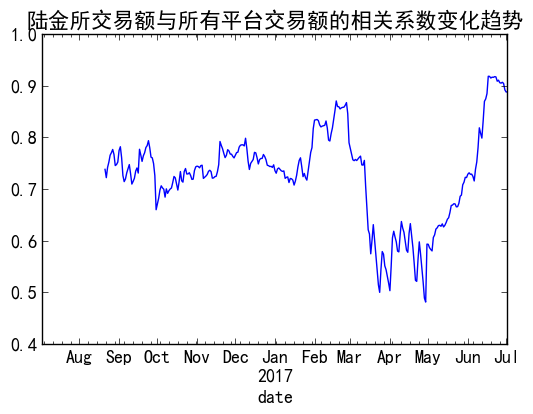

In [58]:
lujinData=platVolume[platVolume['wdzjPlatId']==59]
corr=pd.rolling_corr(lujinData['amount'],allPlatDayData['amount'],50,min_periods=50).plot(title='陆金所交易额与所有平台交易额的相关系数变化趋势')

In [59]:
topTenData=platVolume[platVolume['wdzjPlatId'].isin([59,60,38,505,91,144,223,52,85,942])]#六月份前十家平台交易数据
topTenData=topTenData.resample('D').sum()

D:\Anaconda\lib\site-packages\ipykernel\__main__.py:2: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(center=False,window=50,min_periods=10).mean()
  from ipykernel import kernelapp as app


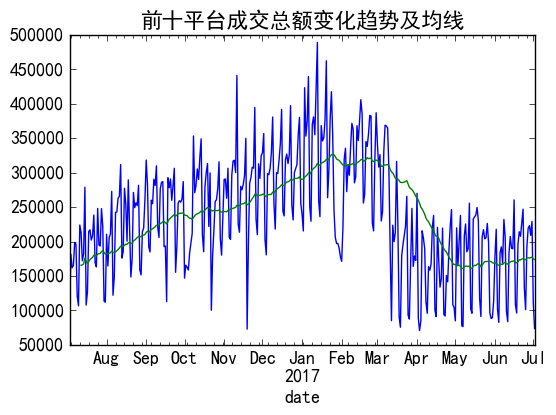

In [60]:
topTenData['amount'].plot(title='前十平台成交总额变化趋势及均线')
pd.rolling_mean(topTenData['amount'],50,min_periods=10).plot()

D:\Anaconda\lib\site-packages\ipykernel\__main__.py:1: FutureWarning: pd.rolling_corr is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=50,min_periods=50).corr(other=<Series>)
  if __name__ == '__main__':


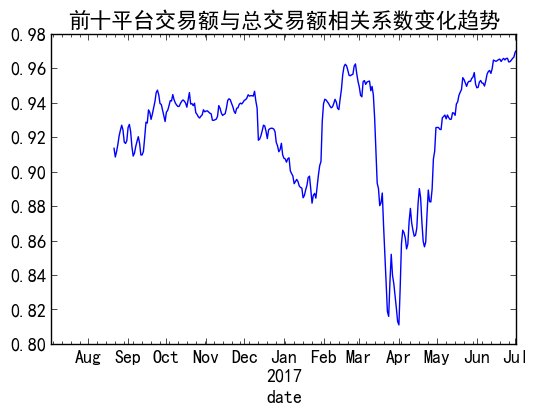

In [61]:
corr=pd.rolling_corr(topTenData['amount'],allPlatDayData['amount'],50,min_periods=50).plot(title='前十平台交易额与总交易额相关系数变化趋势')

In [62]:
platDataDetail=pd.read_csv('platDataDetail.csv')
carFinancePlat=platDataDetail[platDataDetail['businessType'].str.contains('车贷')==True]#经营包含车贷业务的平台
carFinanceData=platVolume[platVolume['wdzjPlatId'].isin(carFinancePlat['platId'].tolist())]#车贷平台成交额数据

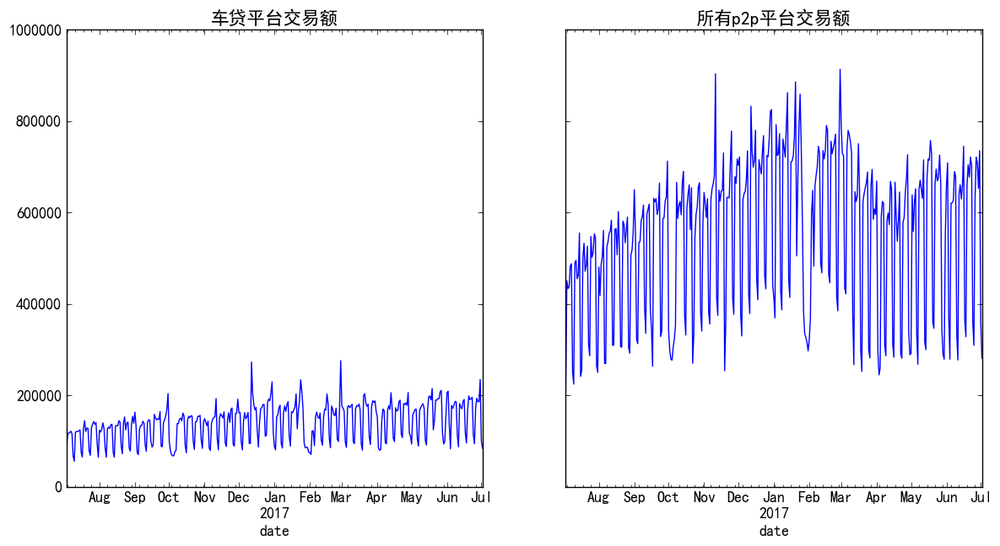

In [63]:
carFinanceDayData=carFinanceData.resample('D').sum()['amount']
fig,axes=plt.subplots(nrows=1,ncols=2,sharey=True,figsize=(14,7))
carFinanceDayData.plot(ax=axes[0],title='车贷平台交易额')
allPlatDayData['amount'].plot(ax=axes[1],title='所有p2p平台交易额')

D:\Anaconda\lib\site-packages\ipykernel\__main__.py:1: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(center=False,window=50,min_periods=10).mean()
  if __name__ == '__main__':


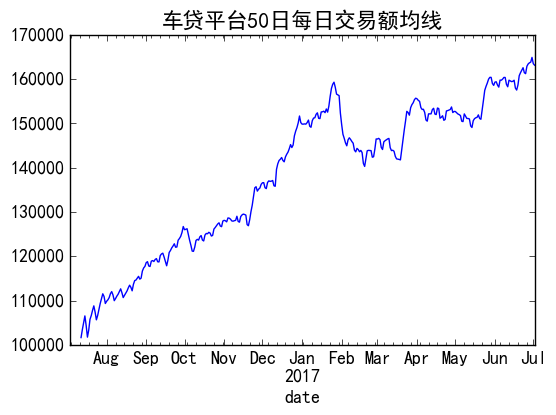

In [64]:
pd.rolling_mean(carFinanceDayData,50,min_periods=10).plot(title='车贷平台50日每日交易额均线')

D:\Anaconda\lib\site-packages\ipykernel\__main__.py:1: FutureWarning: pd.rolling_std is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(center=False,window=50,min_periods=10).std()
  if __name__ == '__main__':


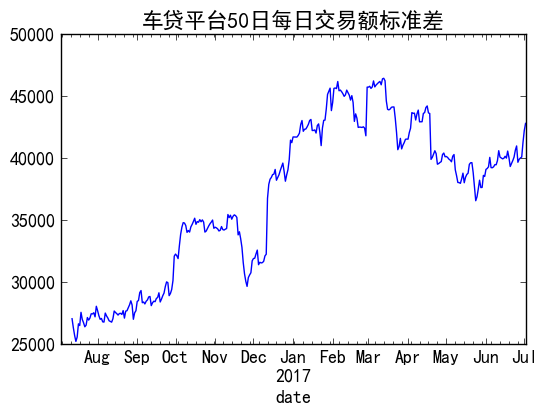

In [65]:
pd.rolling_std(carFinanceDayData,50,min_periods=10).plot(title='车贷平台50日每日交易额标准差')

D:\Anaconda\lib\site-packages\ipykernel\__main__.py:1: FutureWarning: pd.rolling_corr is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=50,min_periods=10).corr(other=<Series>)
  if __name__ == '__main__':


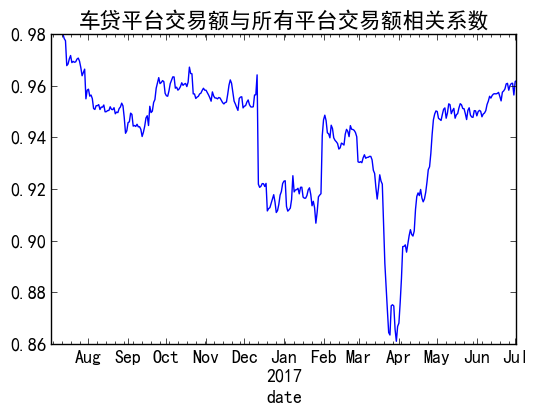

In [66]:
pd.rolling_corr(carFinanceDayData,allPlatDayData['amount'],50,min_periods=10).plot(title='车贷平台交易额与所有平台交易额相关系数')

In [67]:
carFinanceData['wdzjPlatId'].unique().size  #做车贷业务的平台数量

259

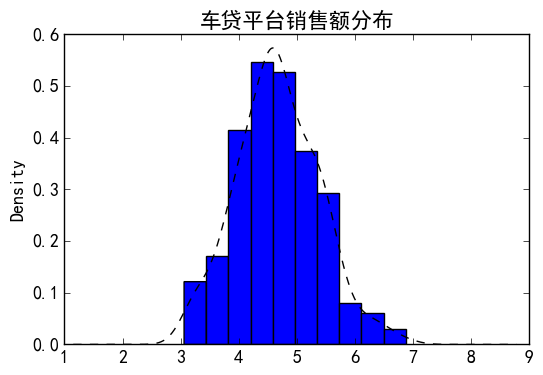

In [68]:
carPlat=carFinanceData.groupby('wdzjPlatId').sum()['amount']
np.log10(carPlat).hist(normed=True)
np.log10(carPlat).plot(kind='kde',style='k--',title='车贷平台销售额分布')

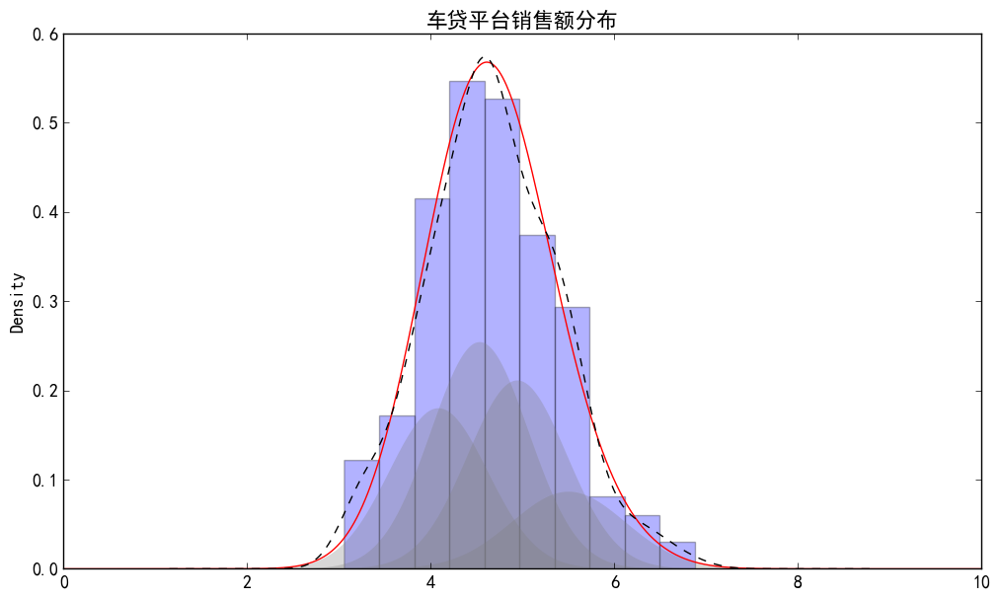

In [69]:
from sklearn.mixture import GMM  #高斯混合模型拟合
from scipy import stats
carPlatValue=np.log10(carPlat.values)[:,np.newaxis]
clf=GMM(4,n_iter=500).fit(carPlatValue)
xpdf = np.linspace(0, 10, 1000)
density = np.exp(clf.score(xpdf[:, np.newaxis]))
plt.plot(xpdf, density, '-r')
np.log10(carPlat).hist(normed=True,alpha=0.3)
np.log10(carPlat).plot(kind='kde',style='k--',title='车贷平台销售额分布',figsize=(12,7))
for i in range(clf.n_components):
    pdf = clf.weights_[i] * stats.norm(clf.means_[i, 0],
                                       np.sqrt(clf.covars_[i, 0])).pdf(xpdf)
    plt.fill(xpdf, pdf, facecolor='gray',
             edgecolor='none', alpha=0.3)

In [70]:
clf.means_#高斯混合模型，每个模型的均值

array([[ 5.50063409],
       [ 4.53321229],
       [ 4.08395454],
       [ 4.9430136 ]])

In [71]:
clf.covars_#高斯混合模型  每个模型的方差

array([[ 0.38265033],
       [ 0.28300728],
       [ 0.28763817],
       [ 0.28986289]])

In [72]:
clf.weights_ #高斯混合模型 每个模型的权重

array([ 0.13410572,  0.33893408,  0.24201825,  0.28494195])

In [73]:
personalCreditPlat=platDataDetail[platDataDetail['businessType'].str.contains('个人信贷')==True]#经营 含有个人信贷业务平台的成交额
personalCreditData=platVolume[platVolume['wdzjPlatId'].isin(personalCreditPlat['platId'].tolist())]#个人信贷平台成交额数据

D:\Anaconda\lib\site-packages\ipykernel\__main__.py:2: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(center=False,window=50,min_periods=10).mean()
  from ipykernel import kernelapp as app
D:\Anaconda\lib\site-packages\ipykernel\__main__.py:3: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(center=False,window=50,min_periods=10).mean()
  app.launch_new_instance()


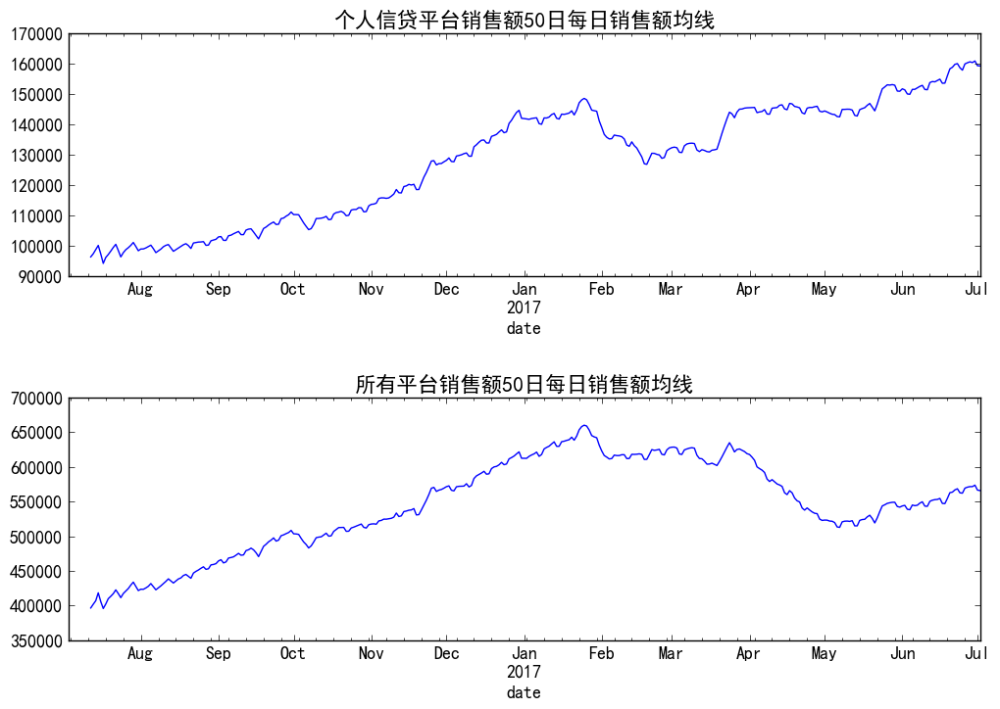

In [74]:
fig,axes=plt.subplots(nrows=2,ncols=1,figsize=(12,8))
pd.rolling_mean(personalCreditData.resample('D').sum()['amount'],50,min_periods=10).plot(ax=axes[0],title='个人信贷平台销售额50日每日销售额均线')
pd.rolling_mean(allPlatDayData['amount'],50,min_periods=10).plot(ax=axes[1],title='所有平台销售额50日每日销售额均线')
plt.subplots_adjust(hspace=0.5)

In [75]:
houseCreditPlat=platDataDetail[platDataDetail['businessType'].str.contains('房贷')==True]#经营 含有房贷业务平台的成交额
houseCreditData=platVolume[platVolume['wdzjPlatId'].isin(houseCreditPlat['platId'].tolist())]#房贷信贷平台成交额数据

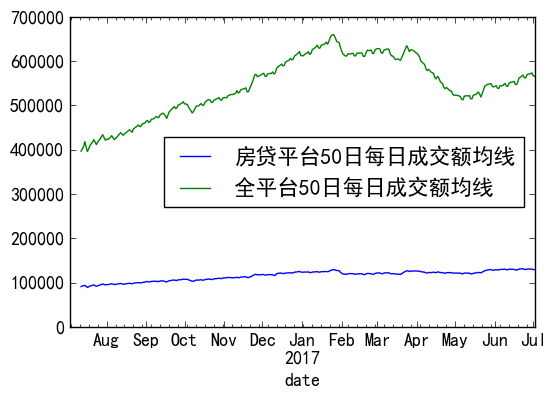

In [76]:
houseCreditData.resample('D').sum()['amount'].rolling(window=50,min_periods=10,center=False).mean().plot(label='房贷平台50日每日成交额均线')
allPlatDayData['amount'].rolling(window=50,min_periods=10,center=False).mean().plot(label='全平台50日每日成交额均线')
plt.legend(loc='best')

In [77]:
platDataDetail=pd.merge(platDataDetail,platAmount,left_on='platId',right_on='wdzjPlatId')

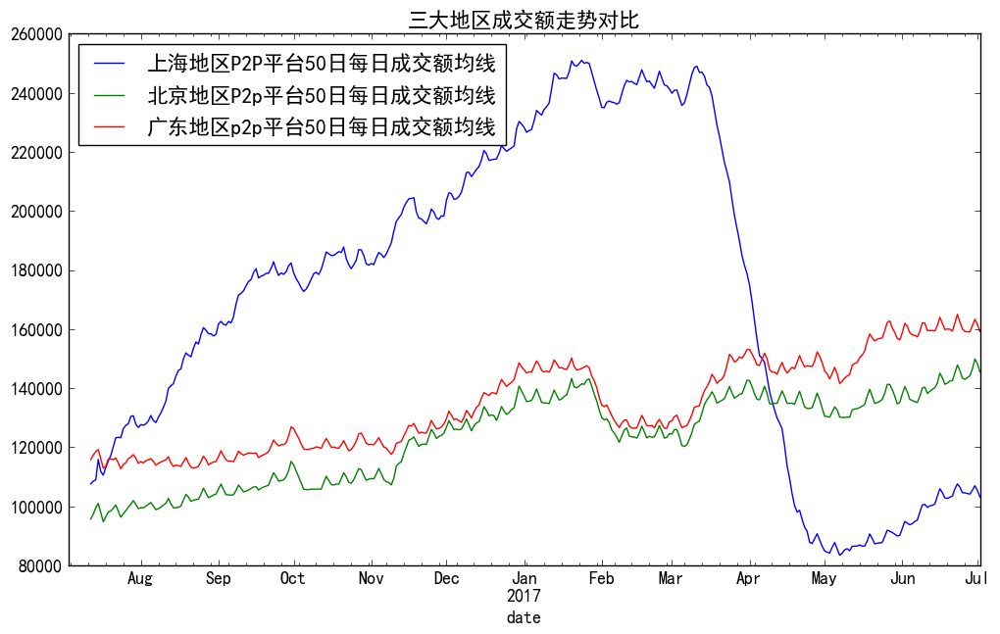

In [78]:
areaData=pd.merge(platVolume,platDataDetail[['locationAreaName','platId']],left_on='wdzjPlatId',right_on='platId')
areaData.index=areaData['date']
areaData.index=pd.to_datetime(areaData.index)
areaData[areaData['locationAreaName']=='上海'].resample('D').sum()['amount'].rolling(window=40,min_periods=10).mean().plot(label='上海地区P2P平台50日每日成交额均线',figsize=(12,7))
areaData[areaData['locationAreaName']=='北京'].resample('D').sum()['amount'].rolling(window=40,min_periods=10).mean().plot(label='北京地区P2p平台50日每日成交额均线')
areaData[areaData['locationAreaName']=='广东'].resample('D').sum()['amount'].rolling(window=40,min_periods=10).mean().plot(label='广东地区p2p平台50日每日成交额均线')
plt.legend(loc='best')
plt.title('三大地区成交额走势对比')

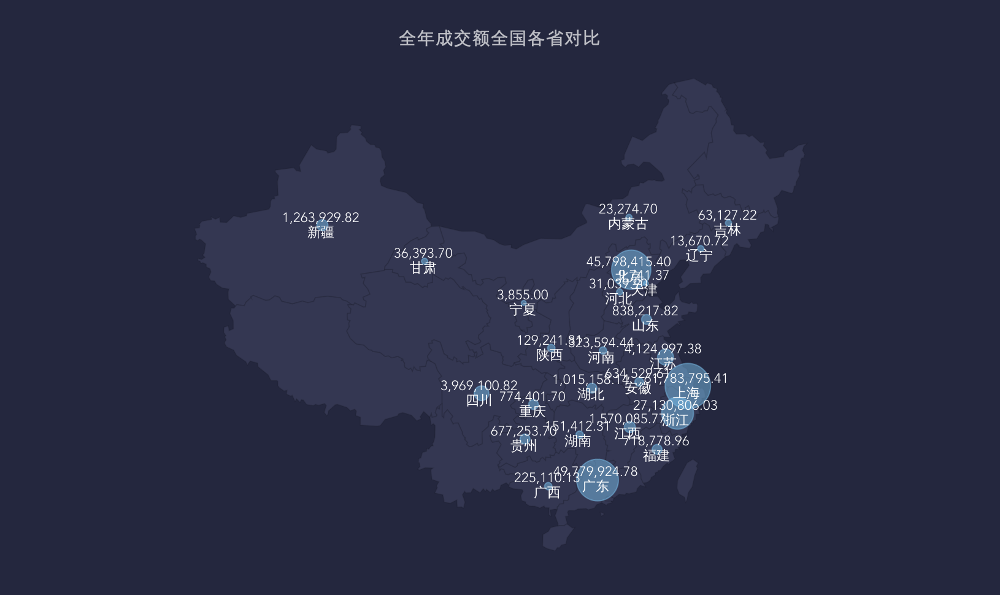

In [79]:
Image(filename='全年成交额全国各省对比.png', width=1024)

In [80]:
incomeRateData=pd.read_csv('platIncomeRate.csv',parse_dates=True)#收益率数据

In [81]:
incomeRateData.index=incomeRateData['date']
incomeRateData.index=pd.to_datetime(incomeRateData.index)

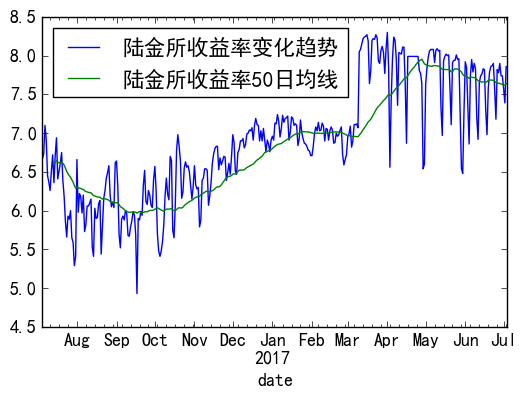

In [82]:
incomeRateData[incomeRateData['wdzjPlatId']==59]['incomeRate'].plot(label='陆金所收益率变化趋势')
incomeRateData[incomeRateData['wdzjPlatId']==59]['incomeRate'].rolling(window=50,min_periods=10,center=False).mean().plot(label='陆金所收益率50日均线')
plt.legend(loc='best')

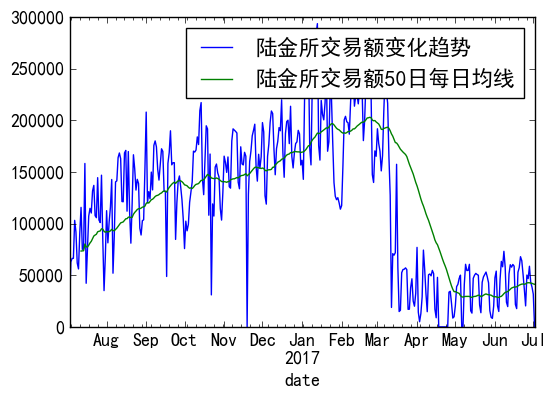

In [83]:
platVolume[platVolume['wdzjPlatId']==59]['amount'].plot(label='陆金所交易额变化趋势')
platVolume[platVolume['wdzjPlatId']==59]['amount'].rolling(window=50,min_periods=10,center=False).mean().plot(label='陆金所交易额50日每日均线')
plt.legend(loc='best')

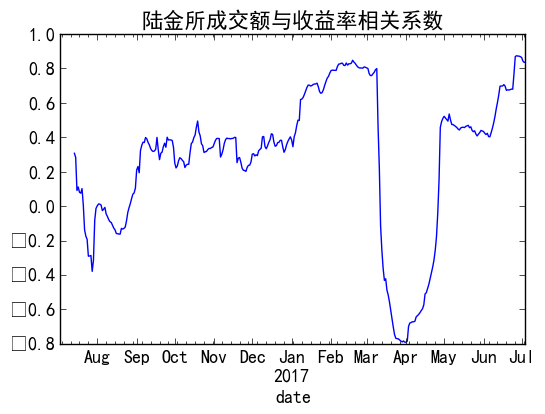

In [84]:
lujinData['amount'].rolling(window=50,min_periods=10).corr(incomeRateData[incomeRateData['wdzjPlatId']==59]['incomeRate']).plot(title='陆金所成交额与收益率相关系数')

D:\Anaconda\lib\site-packages\ipykernel\__main__.py:1: FutureWarning: pd.rolling_corr is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=10,min_periods=10).corr(other=<Series>)
  if __name__ == '__main__':


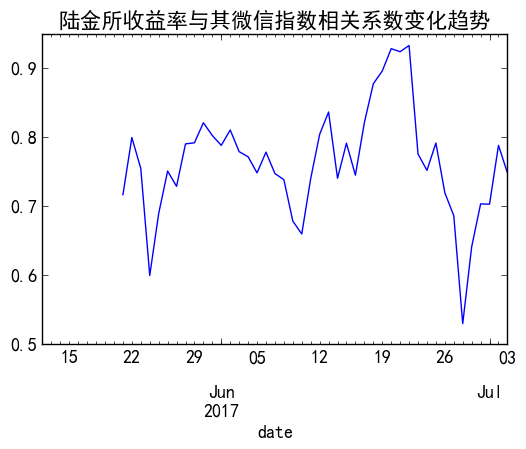

In [85]:
pd.rolling_corr(incomeRateData[incomeRateData['wdzjPlatId']==59]['incomeRate']['2017-05-12':'2017-07-03'],lujinWeixinIndex['index']['2017-05-12':'2017-07-03'],10,min_periods=10).plot(title='陆金所收益率与其微信指数相关系数变化趋势')

In [86]:
amount_incomeRate=pd.merge(incomeRateData,platVolume,on=['wdzjPlatId','date']) #连表

In [87]:
amount_incomeRate.index=amount_incomeRate.date
amount_incomeRate.index=pd.to_datetime(amount_incomeRate.index)#设置索引
amount_incomeRate=amount_incomeRate[amount_incomeRate['amount']!=0]#删除交易额为0的数据项，避免加权平均时总和为0

In [88]:
grouped=amount_incomeRate.groupby('date')
grouped['amount']

In [89]:
get_wavg=lambda g:np.average(g['incomeRate'],weights=g['amount'])#每日数据按照成交量分组加权平均
dayData=grouped.apply(get_wavg)

In [90]:
dayData#每日根据交易额加权平均后的收益率

date
2016-07-05    9.294084
2016-07-06    9.321652
2016-07-07    9.269632
2016-07-08    9.326579
2016-07-09    9.151844
2016-07-10    9.027933
2016-07-11    9.351229
2016-07-12    9.156928
2016-07-13    9.393365
2016-07-14    9.351196
2016-07-15    9.030356
2016-07-16    9.431098
2016-07-17    8.992912
2016-07-18    9.138699
2016-07-19    9.104451
2016-07-20    9.048082
2016-07-21    8.944450
2016-07-22    8.937017
2016-07-23    8.531971
2016-07-24    8.370815
2016-07-25    8.863439
2016-07-26    9.072112
2016-07-27    9.116078
2016-07-28    8.783758
2016-07-29    9.078969
2016-07-30    9.319532
2016-07-31    8.753127
2016-08-01    9.138946
2016-08-02    9.060972
2016-08-03    9.087467
                ...   
2017-06-03    9.158343
2017-06-04    9.045943
2017-06-05    8.930613
2017-06-06    8.975047
2017-06-07    9.073464
2017-06-08    8.851465
2017-06-09    8.903640
2017-06-10    8.971772
2017-06-11    9.097633
2017-06-12    9.110495
2017-06-13    8.991551
2017-06-14    8.975566
2017-0

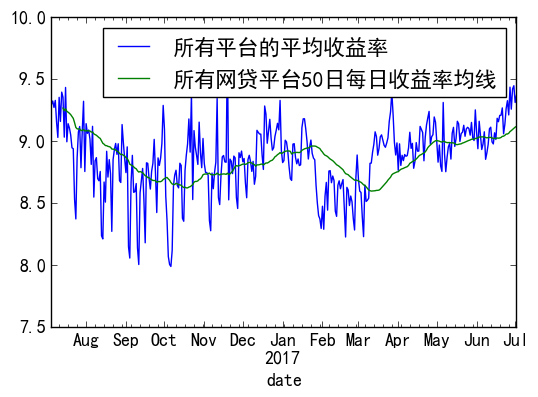

In [91]:
dayData.index=pd.to_datetime(dayData.index)
dayData.plot(label='所有平台的平均收益率')
dayData.rolling(window=50,min_periods=10).mean().plot(label='所有网贷平台50日每日收益率均线')
plt.legend(loc='best')

In [92]:
import tushare as ts
ts.get_loan_rate() #存款利率

,date,loan_type,rate
0,2015-10-24,短期贷款(六个月以内),4.35
1,2015-10-24,短期贷款(六个月至一年),4.35
2,2015-10-24,中长期贷款(三至五年),4.75
3,2015-10-24,中长期贷款(五年以上),4.90
4,2015-10-24,中长期贷款(一至三年),4.75
5,2015-10-24,贴现(贴现),--
6,2015-10-24,优惠贷款(扶贫贴息贷款),--
7,2015-10-24,优惠贷款(老少边穷发展经济贷款),--
8,2015-10-24,优惠贷款(民政部门福利工厂贷款),--
9,2015-10-24,优惠贷款(民族贸易及民族用品生产贷款),--


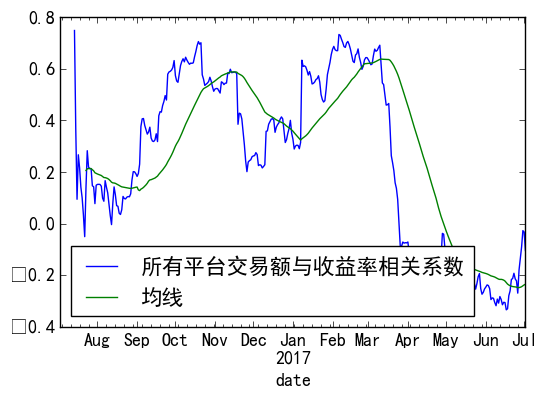

In [93]:
allPlatDayData['amount'].rolling(window=50,min_periods=10).corr(dayData).plot(label='所有平台交易额与收益率相关系数')
allPlatDayData['amount'].rolling(window=50,min_periods=10).corr(dayData).rolling(window=50,min_periods=10).mean().plot(label='均线')
plt.legend(loc='best')

In [94]:
grouped=amount_incomeRate.groupby('wdzjPlatId')
get_wavg=lambda g:np.average(g['incomeRate'],weights=g['amount'])#每个平台按每日成交量加权平均后的收益率
platData=grouped.apply(get_wavg)

In [95]:
platData.rename(columns={0:'incomeRate'},inplace=True)

wdzjPlatId
34      11.746048
37      14.426024
38       8.624941
40      11.304565
49       8.761589
50       9.248365
53       9.722291
57      10.106989
59       6.740895
60       8.279230
85      11.679829
91      10.346231
92       9.819790
93      11.138360
95       8.577706
96       9.844049
97      12.939797
102     11.194149
108      8.412069
116      6.672825
117     10.543483
118     11.581196
120     12.919467
125     10.853179
127     12.869430
128     12.735646
129      9.106918
142     10.234728
144      9.518903
154     12.330133
          ...    
4582     7.565468
4588     7.379979
4630    11.053115
4631     8.483854
4650    14.677976
4651    10.752918
4843    10.089415
4891     6.715554
4898     7.092263
5007     6.831721
5086     9.136049
5110     8.693516
5133     7.475010
5258    11.746941
5310    10.197079
5392    14.138838
5396    10.653897
5514    11.091293
5546    12.355727
5588     8.481844
5687     9.563799
5728    12.706669
6297     9.916097
6302     7.867405

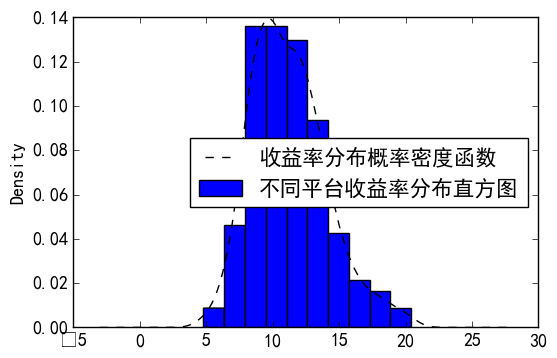

In [96]:
platData.hist(normed=True,label='不同平台收益率分布直方图')
platData.plot(kind='kde',style='k--',label='收益率分布概率密度函数')
plt.legend(loc='best')

D:\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:531: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


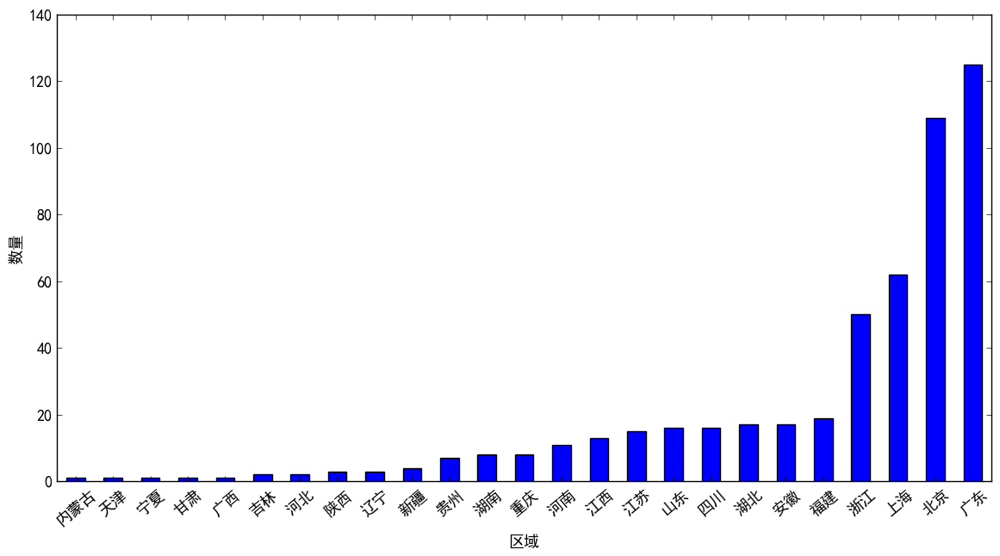

In [97]:
fig,axes=plt.subplots(nrows=1,ncols=1,figsize=(14,7))
platDataDetail.groupby('locationAreaName').count()['platId'].sort_values().plot(kind='bar',sort_columns=True,label='_nolegend_')
plt.legend(loc='best')
plt.xticks(rotation=40)
plt.xlabel('区域')
plt.ylabel('数量')

In [98]:
from pandas import DataFrame

In [99]:
platData=DataFrame(platData)

In [100]:
platData['wdzjPlatId']=platData.index.to_series()

In [101]:
platDataDetail=pd.merge(platDataDetail,platData,left_on='platId',right_on='wdzjPlatId')

In [102]:
platDataDetail.rename(columns={0:'incomeRate'},inplace=True)

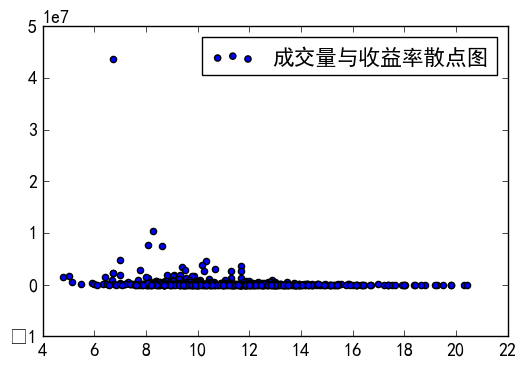

In [103]:
plt.scatter(x=platDataDetail['incomeRate'],y=platDataDetail['amount'],label='成交量与收益率散点图')
plt.legend(loc='best')

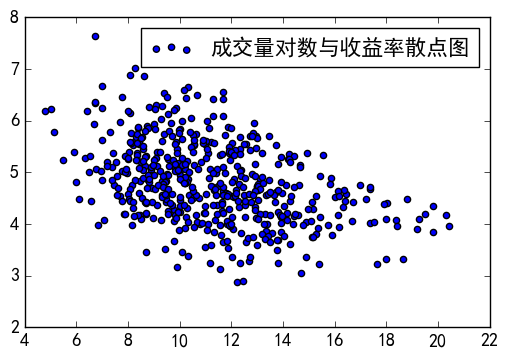

In [104]:
plt.scatter(x=platDataDetail['incomeRate'],y=np.log10(platDataDetail['amount']),label='成交量对数与收益率散点图')
plt.legend(loc='best')
#取对数后  关系 虽然仍旧分散 但是有一定的负相关关系   
#大平台收益率都偏低

D:\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:531: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


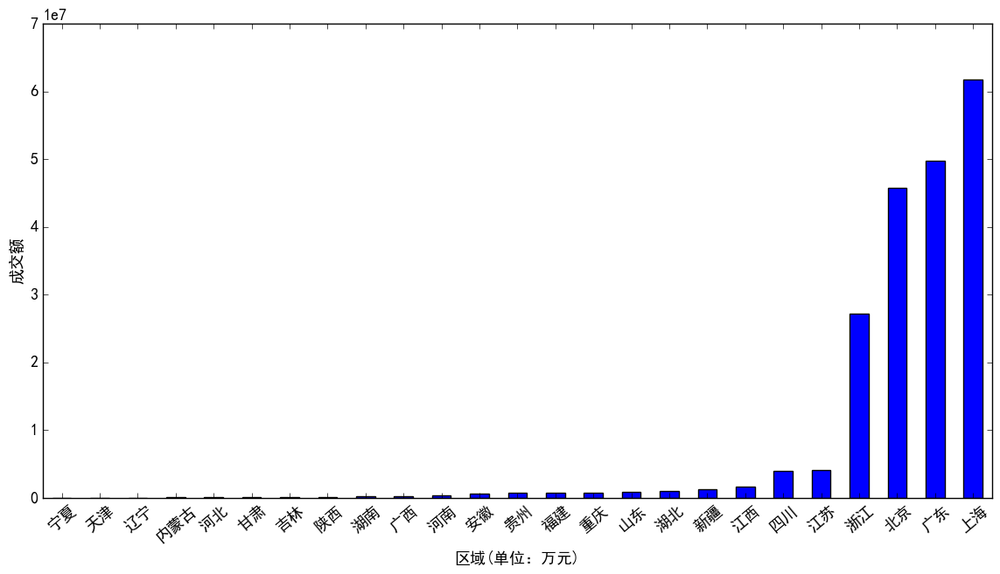

In [105]:
fig,axes=plt.subplots(nrows=1,ncols=1,figsize=(14,7))
platDataDetail.groupby('locationAreaName').sum()['amount'].sort_values().plot(kind='bar',sort_columns=True,label='_nolegend_')
plt.legend(loc='best')
plt.xticks(rotation=40)
plt.xlabel('区域(单位：万元)')
plt.ylabel('成交额')

In [106]:
platDataDetail

,id_x,actualCapital,aliasName,association,associationDetail,autoBid,autoBidCode,bankCapital,bankFunds,bidSecurity,...,tzjPj,vipExpense,withTzj,withdrawExpense,platId,id_y,amount,wdzjPlatId_x,incomeRate,wdzjPlatId_y
0,2144,8000.0,陆金所,1,2014年03月01日加入广西互联网金融协会任职务<br/>2016年03月25日加入中国互...,不支持,0.0,平安银行,1.0,-,...,AAA,NaN,0,0,59,66795,43616671.41,59,6.740895,59
1,2145,5000.0,红岭创投,1,2014年03月01日加入互联网金融专业委员会任会员职务<br/>2016年03月25日加入...,支持,1.0,NaN,0.0,VIP100%本金保障，非VIP享受50%本金垫付,...,A,网站注册会员可申请成为VIP会员，享受本金保障，费用每年180元。VIP会员可以享受网站专属...,0,每次提现金额允许范围为100元-100万元；小于等于5万的提现按每笔5元收费，大于5万的提现...,60,200020,10501997.25,60,8.279230,60
2,2146,3938.0,小赢理财,0,NaN,支持,1.0,上海华瑞银行,1.0,众安保险承保,...,NaN,0,0,0,1309,333245,4811056.00,1309,6.988227,1309
3,2147,12195.0,微贷网,1,2015年09月13日加入杭州市互联网金融协会任执行会长职务,支持,1.0,厦门银行,1.0,当天偿付,...,NaN,免费,0,每月前3笔提现免费，超过3笔手续费2元一笔，未投资资金转可提收取0.5％的手续费。单笔50元起提。,38,466470,7463926.83,38,8.624941,38
4,2148,3730.0,鑫合汇,1,2015年05月17日加入杭州市互联网金融协会任执行会长职务<br/>2016年08月19日...,支持,1.0,浙商银行,1.0,由第三方机构为鑫合汇融资项目提供担保服务,...,NaN,0,0,1.提现时每笔收取2元的手续费（由第三方支付平台收取），可通过免收手续费次数抵扣。2.充值后...,505,599695,7629356.14,505,8.068199,505
5,2149,20000.0,爱钱进,0,NaN,支持,1.0,华夏银行,1.0,风险准备金,...,NaN,无费用,0,无费用,689,732920,3661363.28,689,11.699605,689
6,2150,3793.0,团贷网,1,2014年03月07日加入东莞市互联网金融协会任会长单位职务<br/>2013年12月01日...,支持,1.0,厦门银行,1.0,VIP享有担保公司垫付本息，普通会员享有担保公司垫付本金,...,NaN,特权会员30/月150/半年288/年(1、团贷网普通会员永远免费，借入人和投资人可以任意发...,0,0.1％-0.3％(1、会员充值不收取任何费用。 2、会员取现时按照额度，仅代收第三方平台的...,91,866145,4532417.91,91,10.346231,91
7,2151,5000.0,51人品,1,2016年09月13日加入杭州市互联网金融协会任副会长职务,支持,1.0,NaN,NaN,风险准备金,...,NaN,无,0,免费,4891,999370,2203552.09,4891,6.715554,4891
8,2152,6000.0,宜贷网,0,NaN,支持,1.0,恒丰银行,1.0,100％抵押标,...,A,无,1,每月首次申请提现免手续费，其余申请按照提现金额X0.1％，单笔最低2元，最高收费100元。,942,1132595,3123932.26,942,10.663729,942
9,2153,3000.0,宜人贷,0,NaN,不支持,0.0,广发银行,1.0,-,...,AA,0(无vip费用),0,0(无提现费),85,1265820,2635072.78,85,11.679829,85


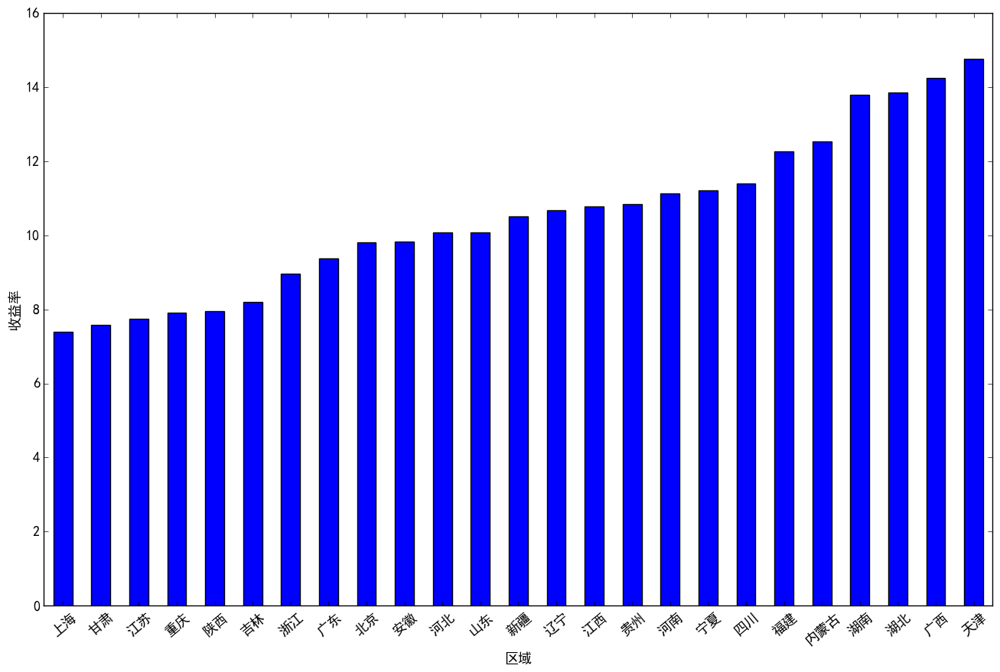

In [107]:
grouped=platDataDetail.groupby('locationAreaName')
get_wavg=lambda g:np.average(g['incomeRate'],weights=g['amount'])#按成交额加权计算趋于内平台的收益率
areaIncomeRate=grouped.apply(get_wavg)
areaIncomeRate.sort_values().plot(kind='bar',figsize=(16,10),label='_nolegend_')
plt.xticks(rotation=40)
plt.xlabel('区域')
plt.ylabel('收益率')

In [108]:
dayIncomeRateData=DataFrame(dayData)

In [109]:
dayIncomeRateData.rename(columns={0:'incomeRateData'},inplace=True)

In [110]:
dayIncomeRateData['y']=dayIncomeRateData['incomeRateData']
dayIncomeRateData['ds']=pd.to_datetime(dayIncomeRateData.index)

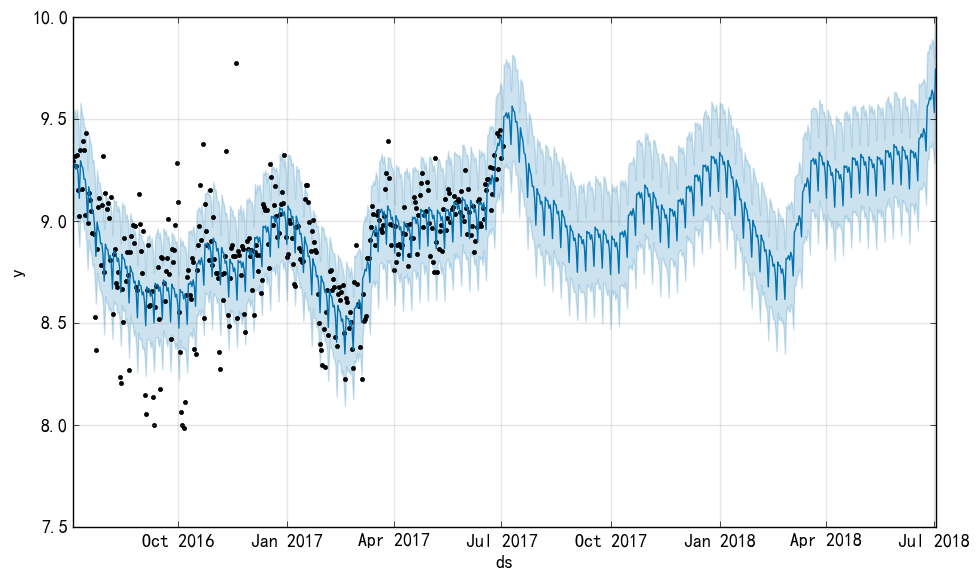

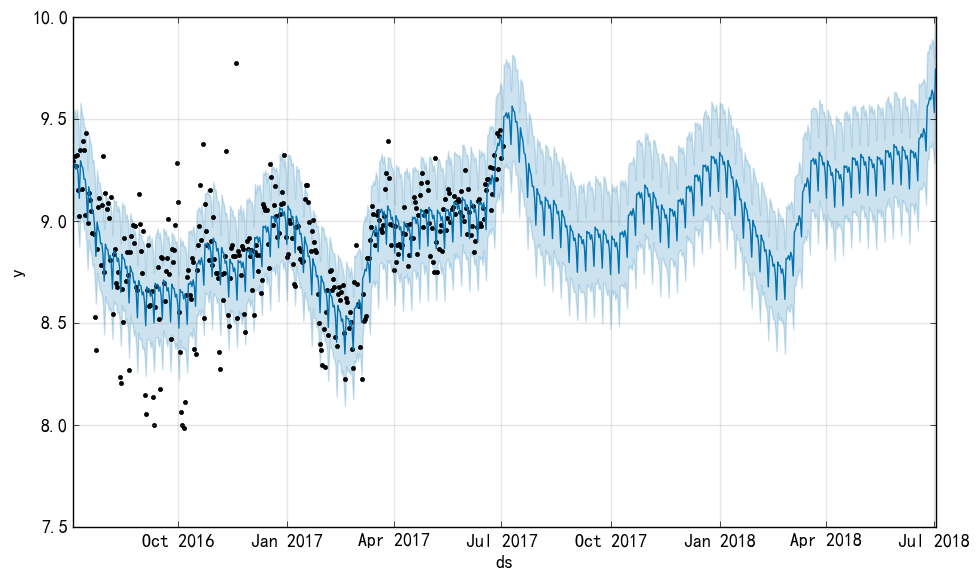

In [111]:
from fbprophet import Prophet#收益率趋势预测
m=Prophet(yearly_seasonality=True)
m.fit(dayIncomeRateData)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)
m.plot(forecast)

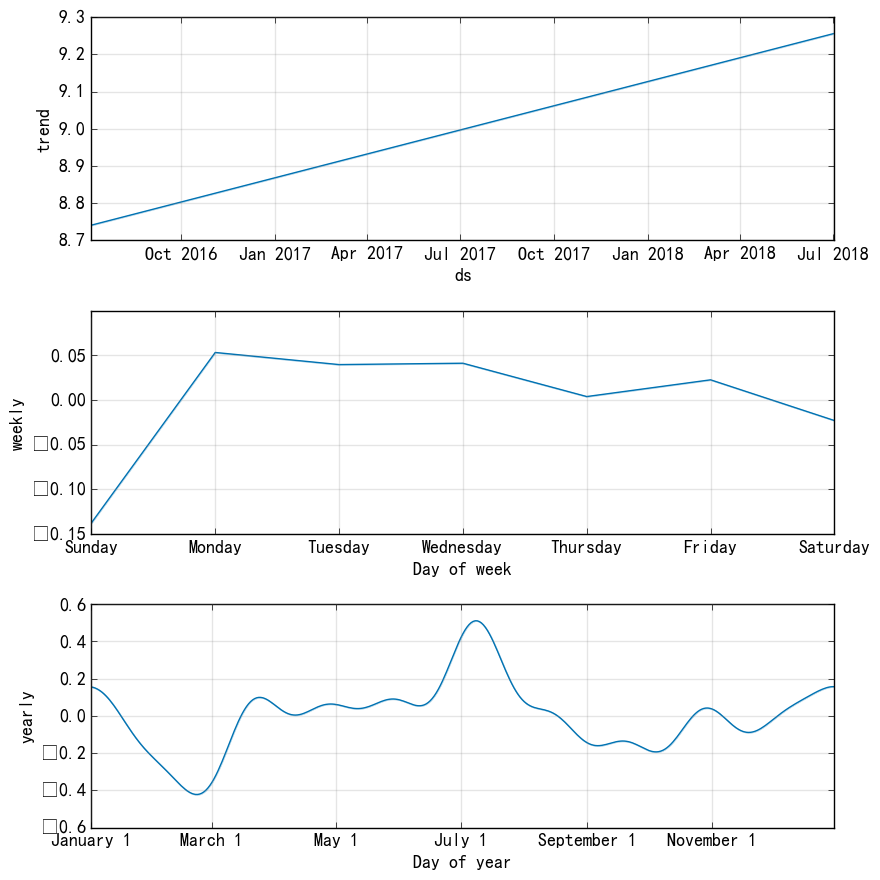

In [112]:
m.plot_components(forecast);

In [113]:
investorGradeData=pd.read_csv('platInvestorGrade.csv')#投资人数分级数据

In [114]:
investorGradeData.index=investorGradeData['date']
investorGradeData.index=pd.to_datetime(investorGradeData.index)
investorGradeData['total']=investorGradeData['qianPerson']+investorGradeData['wanPerson']+investorGradeData['shiWanPerson']+investorGradeData['baiWanPerson']

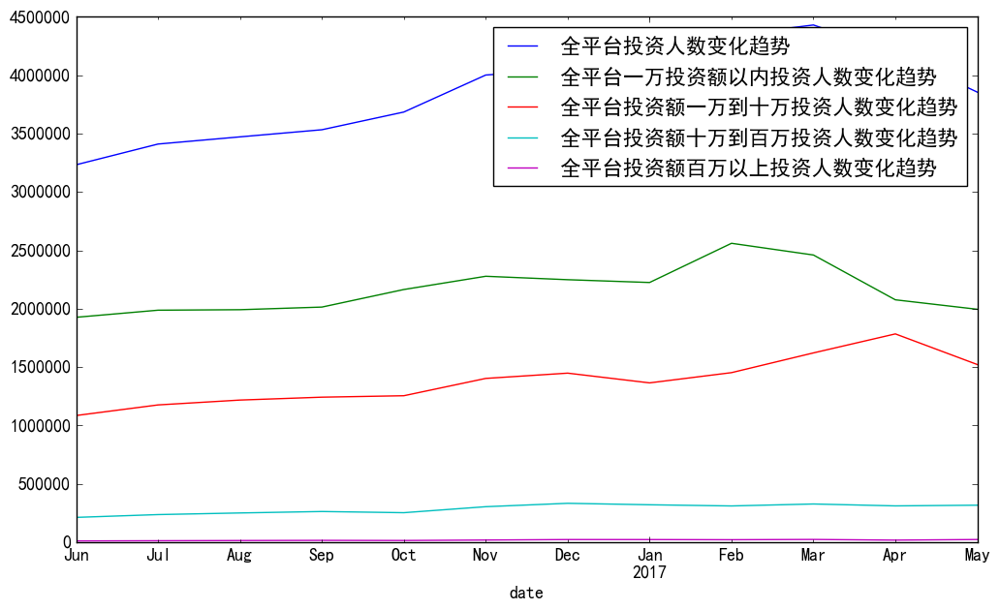

In [115]:
investorGradeData.resample('M').sum()['2016-06':'2017-05']['total'].plot(label='全平台投资人数变化趋势',figsize=(12,7))
investorGradeData.resample('M').sum()['2016-06':'2017-05']['qianPerson'].plot(label='全平台一万投资额以内投资人数变化趋势')
investorGradeData.resample('M').sum()['2016-06':'2017-05']['wanPerson'].plot(label='全平台投资额一万到十万投资人数变化趋势')
investorGradeData.resample('M').sum()['2016-06':'2017-05']['shiWanPerson'].plot(label='全平台投资额十万到百万投资人数变化趋势')
investorGradeData.resample('M').sum()['2016-06':'2017-05']['baiWanPerson'].plot(label='全平台投资额百万以上投资人数变化趋势')
plt.legend(loc='best')

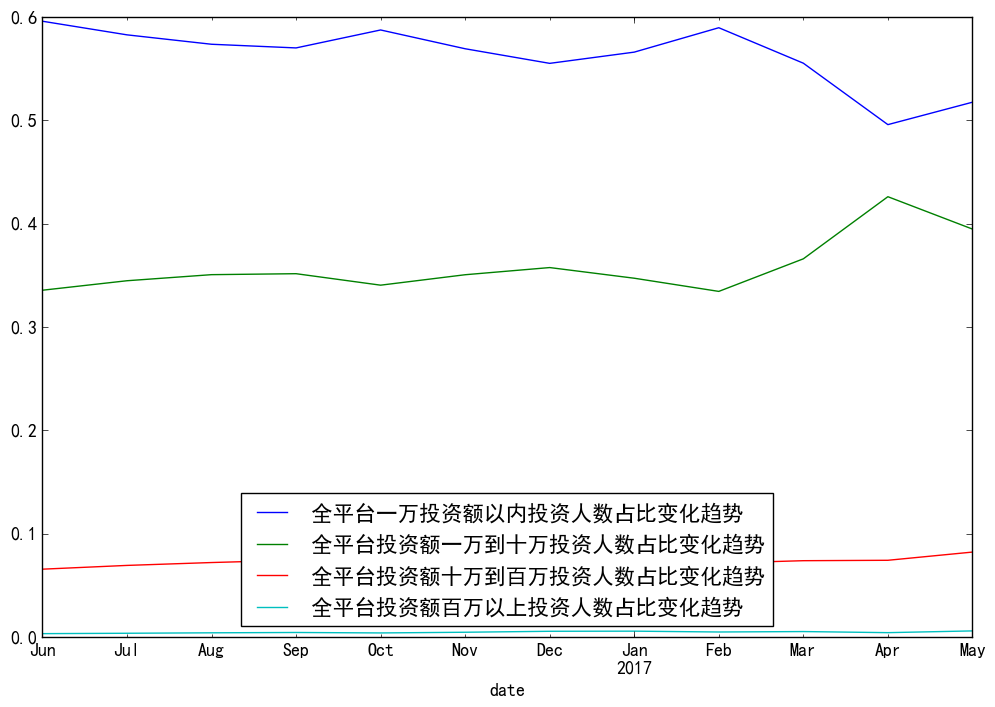

In [116]:
(investorGradeData.resample('M').sum()['2016-06':'2017-05']['qianPerson']/investorGradeData.resample('M').sum()['2016-06':'2017-05']['total']).plot(label='全平台一万投资额以内投资人数占比变化趋势',figsize=(12,8))
(investorGradeData.resample('M').sum()['2016-06':'2017-05']['wanPerson']/investorGradeData.resample('M').sum()['2016-06':'2017-05']['total']).plot(label='全平台投资额一万到十万投资人数占比变化趋势')
(investorGradeData.resample('M').sum()['2016-06':'2017-05']['shiWanPerson']/investorGradeData.resample('M').sum()['2016-06':'2017-05']['total']).plot(label='全平台投资额十万到百万投资人数占比变化趋势')
(investorGradeData.resample('M').sum()['2016-06':'2017-05']['baiWanPerson']/investorGradeData.resample('M').sum()['2016-06':'2017-05']['total']).plot(label='全平台投资额百万以上投资人数占比变化趋势')
plt.legend(loc='lower center')

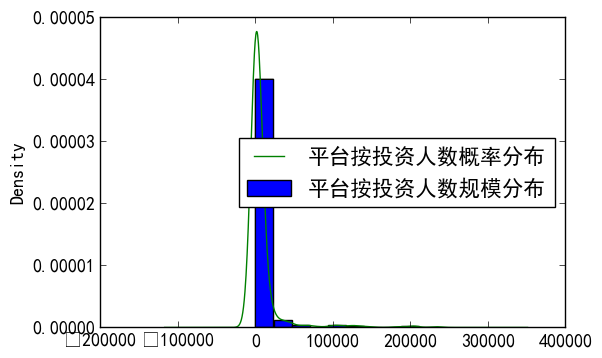

In [117]:
investorGradeData['2016-06':'2017-05'].groupby('wdzjPlatId')['total'].mean().hist(label='平台按投资人数规模分布',normed=True)
investorGradeData['2016-06':'2017-05'].groupby('wdzjPlatId')['total'].mean().plot(label='平台按投资人数概率分布',kind='kde')
plt.legend(loc='best')

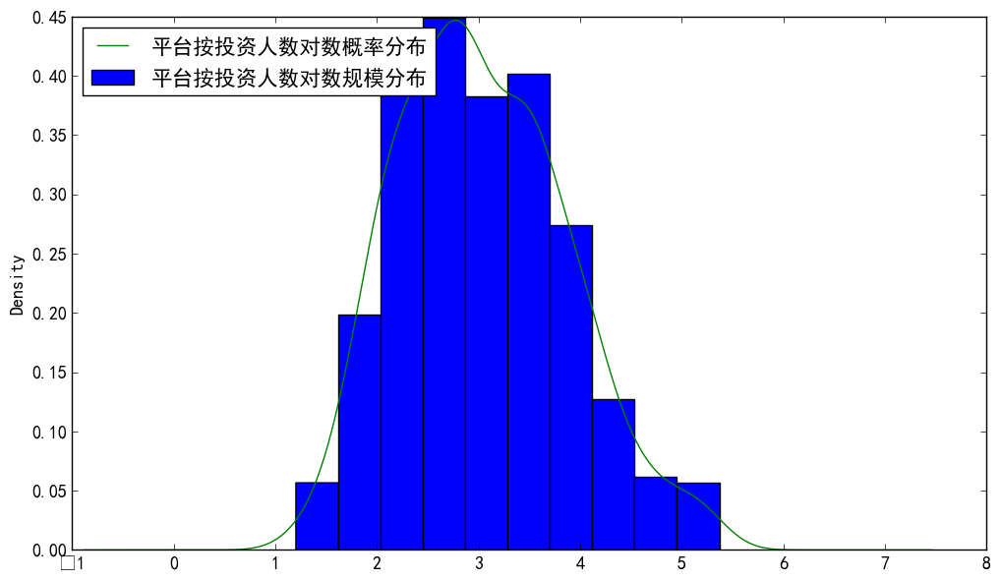

In [118]:
np.log10(investorGradeData['2016-06':'2017-05'].groupby('wdzjPlatId')['total'].mean()).hist(label='平台按投资人数对数规模分布',normed=True,figsize=(12,7))
np.log10(investorGradeData['2016-06':'2017-05'].groupby('wdzjPlatId')['total'].mean()).plot(label='平台按投资人数对数概率分布',kind='kde')
plt.legend(loc='upper left')

In [119]:
platInvestorGradeData=investorGradeData['2016-06':'2017-05'].groupby('wdzjPlatId').mean()

In [120]:
platInvestorGradeData=DataFrame(platInvestorGradeData)
platInvestorGradeData['wdzjPlatId']=platInvestorGradeData.index.to_series()

In [121]:
platInvestorGradeData.columns=['id','investQianPerson','investWanPerson','investShiWanPerson','investBaiWanPerson','investTotal','wdzjPlatId']

In [122]:
platDataDetail=pd.merge(platDataDetail,platInvestorGradeData[['investQianPerson','investWanPerson','investShiWanPerson',
                                                             
                                                            'investBaiWanPerson','investTotal','wdzjPlatId']],left_on='platId',right_on='wdzjPlatId')

In [123]:
platDataDetail

,id_x,actualCapital,aliasName,association,associationDetail,autoBid,autoBidCode,bankCapital,bankFunds,bidSecurity,...,amount,wdzjPlatId_x,incomeRate,wdzjPlatId_y,investQianPerson,investWanPerson,investShiWanPerson,investBaiWanPerson,investTotal,wdzjPlatId
0,2144,8000.0,陆金所,1,2014年03月01日加入广西互联网金融协会任职务<br/>2016年03月25日加入中国互...,不支持,0.0,平安银行,1.0,-,...,43616671.41,59,6.740895,59,16857.083333,112489.583333,49065.916667,6123.083333,184535.666667,59
1,2145,5000.0,红岭创投,1,2014年03月01日加入互联网金融专业委员会任会员职务<br/>2016年03月25日加入...,支持,1.0,NaN,0.0,VIP100%本金保障，非VIP享受50%本金垫付,...,10501997.25,60,8.279230,60,35323.333333,43317.083333,18159.583333,1028.750000,97828.750000,60
2,2146,3938.0,小赢理财,0,NaN,支持,1.0,上海华瑞银行,1.0,众安保险承保,...,4811056.00,1309,6.988227,1309,12888.333333,20201.583333,4284.750000,171.666667,37546.333333,1309
3,2147,12195.0,微贷网,1,2015年09月13日加入杭州市互联网金融协会任执行会长职务,支持,1.0,厦门银行,1.0,当天偿付,...,7463926.83,38,8.624941,38,40164.750000,61226.916667,11365.500000,406.833333,113164.000000,38
4,2148,3730.0,鑫合汇,1,2015年05月17日加入杭州市互联网金融协会任执行会长职务<br/>2016年08月19日...,支持,1.0,浙商银行,1.0,由第三方机构为鑫合汇融资项目提供担保服务,...,7629356.14,505,8.068199,505,13528.166667,18795.333333,9087.750000,1017.666667,42428.916667,505
5,2149,20000.0,爱钱进,0,NaN,支持,1.0,华夏银行,1.0,风险准备金,...,3661363.28,689,11.699605,689,193281.888889,36810.444444,4027.777778,30.000000,234150.111111,689
6,2150,3793.0,团贷网,1,2014年03月07日加入东莞市互联网金融协会任会长单位职务<br/>2013年12月01日...,支持,1.0,厦门银行,1.0,VIP享有担保公司垫付本息，普通会员享有担保公司垫付本金,...,4532417.91,91,10.346231,91,56725.750000,39625.833333,6994.166667,252.000000,103597.750000,91
7,2151,5000.0,51人品,1,2016年09月13日加入杭州市互联网金融协会任副会长职务,支持,1.0,NaN,NaN,风险准备金,...,2203552.09,4891,6.715554,4891,157584.916667,44525.000000,713.500000,3.416667,202826.833333,4891
8,2152,6000.0,宜贷网,0,NaN,支持,1.0,恒丰银行,1.0,100％抵押标,...,3123932.26,942,10.663729,942,6304.333333,5239.250000,2223.750000,363.250000,14130.583333,942
9,2153,3000.0,宜人贷,0,NaN,不支持,0.0,广发银行,1.0,-,...,2635072.78,85,11.679829,85,155708.916667,46286.583333,2771.750000,41.000000,204808.250000,85


In [124]:
platDataDetail[platDataDetail['businessType'].str.contains('车贷\(100\%\)')==True]['investTotal'].sum()/platInvestorGradeData['investTotal'].sum()
#t投资纯车贷平台的投资人数与所有投资人数的占比

0.06809755604073138

In [125]:
platDataDetail[platDataDetail['businessType'].str.contains('个人信贷')==True]['investTotal'].sum()/platInvestorGradeData['investTotal'].sum()
#设计个人信贷的平台的投资人数与全平台投资人数占比

0.43263731474563843

In [126]:
platDataDetail[platDataDetail['businessType'].str.contains('消费')==True]['investTotal'].sum()/platInvestorGradeData['investTotal'].sum()
#设计消费贷的平台的投资人数与全平台投资人数占比

0.1683503400332106

In [127]:
platDataDetail[platDataDetail['bankCapital'].str.contains('银行')==True]['investTotal'].sum()/platInvestorGradeData['investTotal'].sum()
#开通银行存管的平台的投资人数比例占全平台的投资人数

0.5597257751473869

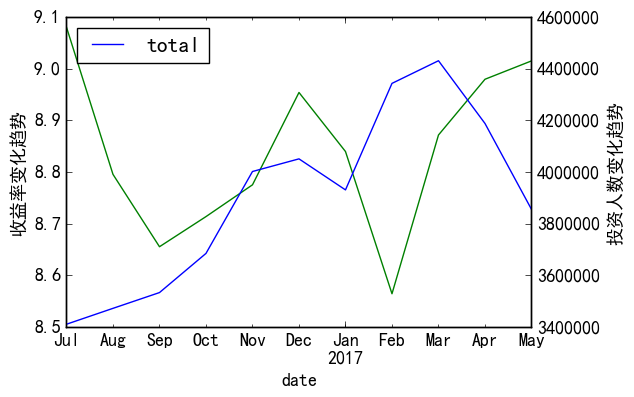

In [128]:
fig = plt.figure()
ax1 = fig.add_subplot(111)
ax2=ax1.twinx()
dayData.resample('M').mean()['2016-07':'2017-05'].plot(ax=ax1,color='green')
ax1.set_ylabel('收益率变化趋势',rotation=90)
investorGradeData.resample('M').sum()['2016-07':'2017-05']['total'].plot(ax=ax2)
ax2.set_ylabel('投资人数变化趋势')
plt.legend(loc='upper left')

In [129]:
borrowerGradeData=pd.read_csv('platBorrowerGrade.csv')#借款人数分级数据

In [130]:
borrowerGradeData.index=borrowerGradeData['date']
borrowerGradeData.index=pd.to_datetime(borrowerGradeData.index)
borrowerGradeData['total']=borrowerGradeData['wanPerson']+borrowerGradeData['shiWanPerson']+borrowerGradeData['baiWanPerson']+borrowerGradeData['qianWanPerson']

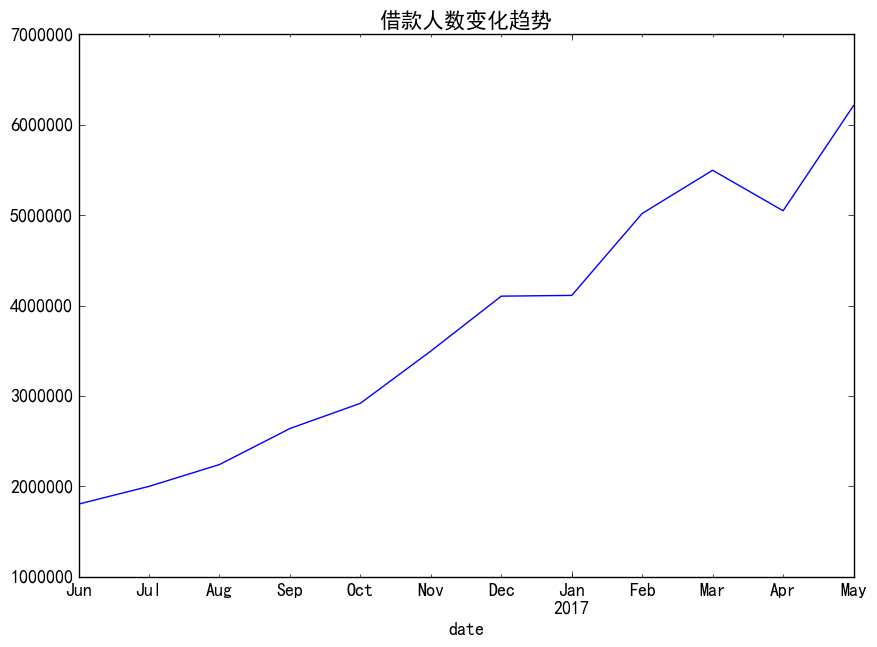

In [131]:
borrowerGradeData.resample('M').sum()['total']['2016-06':'2017-05'].plot(title='借款人数变化趋势',figsize=(10,7))

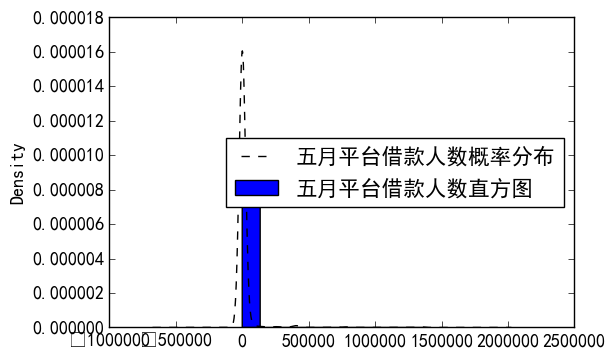

In [132]:
borrowerGradeData[borrowerGradeData['date']=='2017-05-31']['total'].hist(normed=True,label='五月平台借款人数直方图')
borrowerGradeData[borrowerGradeData['date']=='2017-05-31']['total'].plot(kind='kde',style='k--',label='五月平台借款人数概率分布')
plt.legend(loc='best')

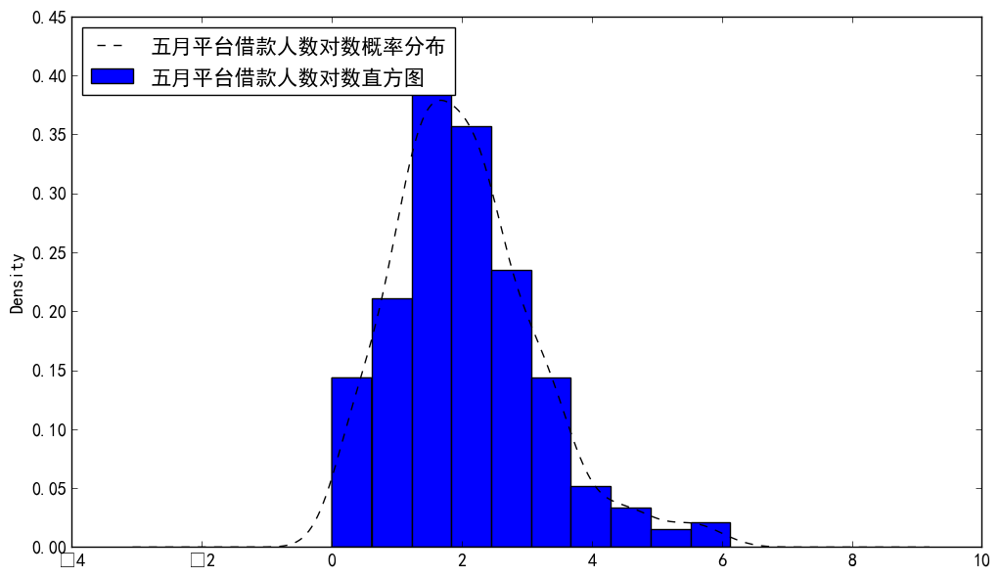

In [133]:
np.log10(borrowerGradeData[borrowerGradeData['date']=='2017-05-31']['total']+1).hist(normed=True,label='五月平台借款人数对数直方图',figsize=(12,7))
np.log10(borrowerGradeData[borrowerGradeData['date']=='2017-05-31']['total']+1).plot(kind='kde',style='k--',label='五月平台借款人数对数概率分布')
plt.legend(loc='upper left')

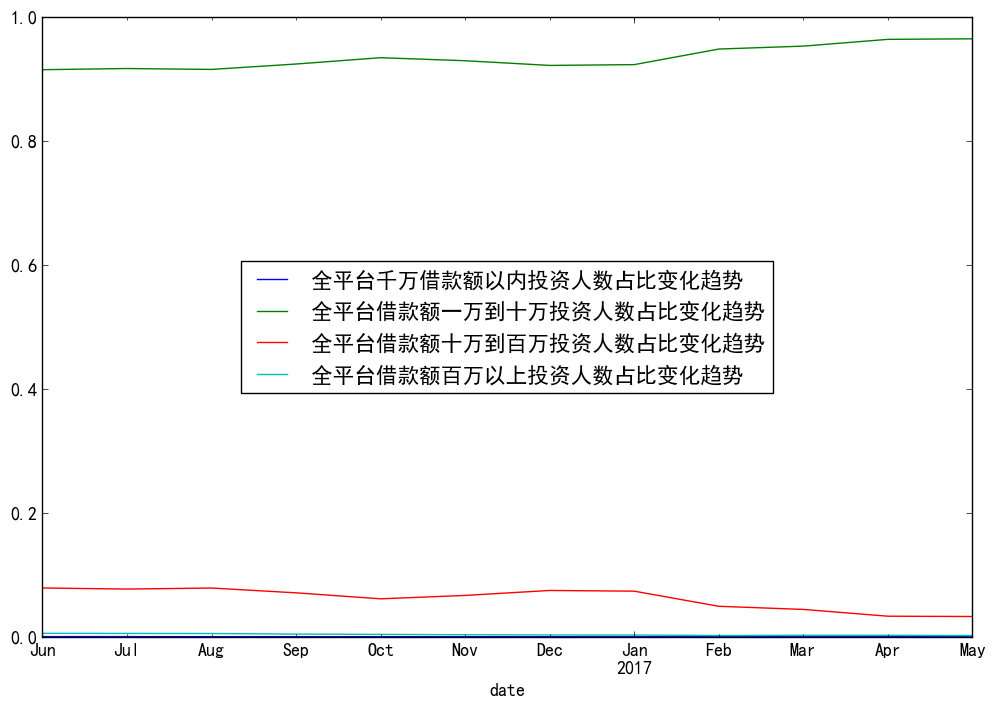

In [134]:
(borrowerGradeData.resample('M').sum()['2016-06':'2017-05']['qianWanPerson']/borrowerGradeData.resample('M').sum()['2016-06':'2017-05']['total']).plot(label='全平台千万借款额以内投资人数占比变化趋势',figsize=(12,8))
(borrowerGradeData.resample('M').sum()['2016-06':'2017-05']['wanPerson']/borrowerGradeData.resample('M').sum()['2016-06':'2017-05']['total']).plot(label='全平台借款额一万到十万投资人数占比变化趋势')
(borrowerGradeData.resample('M').sum()['2016-06':'2017-05']['shiWanPerson']/borrowerGradeData.resample('M').sum()['2016-06':'2017-05']['total']).plot(label='全平台借款额十万到百万投资人数占比变化趋势')
(borrowerGradeData.resample('M').sum()['2016-06':'2017-05']['baiWanPerson']/borrowerGradeData.resample('M').sum()['2016-06':'2017-05']['total']).plot(label='全平台借款额百万以上投资人数占比变化趋势')
plt.legend(loc='center')

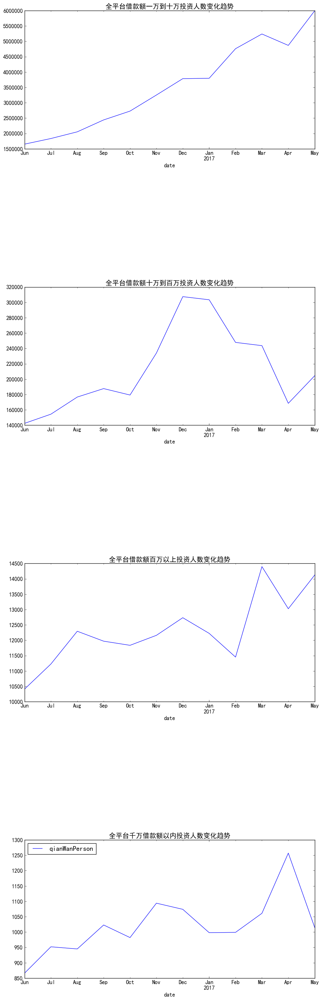

In [135]:
fig,axes=plt.subplots(nrows=4,ncols=1,figsize=(12,40))
borrowerGradeData.resample('M').sum()['2016-06':'2017-05']['wanPerson'].plot(title='全平台借款额一万到十万投资人数变化趋势',ax=axes[0])
borrowerGradeData.resample('M').sum()['2016-06':'2017-05']['shiWanPerson'].plot(title='全平台借款额十万到百万投资人数变化趋势',ax=axes[1])
borrowerGradeData.resample('M').sum()['2016-06':'2017-05']['baiWanPerson'].plot(title='全平台借款额百万以上投资人数变化趋势',ax=axes[2])
borrowerGradeData.resample('M').sum()['2016-06':'2017-05']['qianWanPerson'].plot(title='全平台千万借款额以内投资人数变化趋势',ax=axes[3])
plt.legend(loc='best')
plt.subplots_adjust(hspace=1)

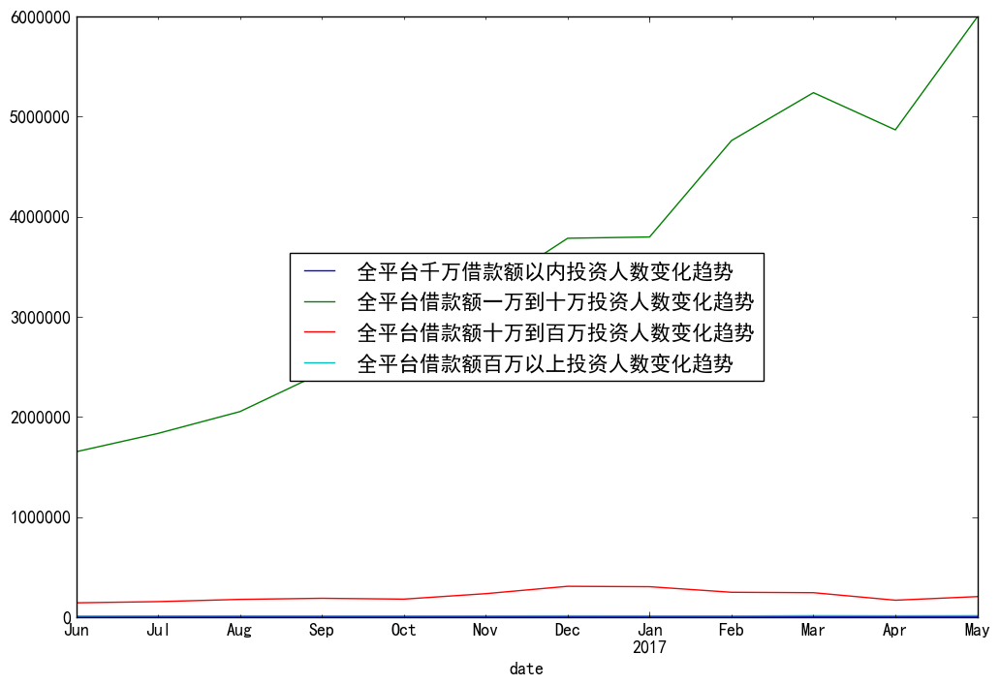

In [136]:
(borrowerGradeData.resample('M').sum()['2016-06':'2017-05']['qianWanPerson']).plot(label='全平台千万借款额以内投资人数变化趋势',figsize=(12,8))
(borrowerGradeData.resample('M').sum()['2016-06':'2017-05']['wanPerson']).plot(label='全平台借款额一万到十万投资人数变化趋势')
(borrowerGradeData.resample('M').sum()['2016-06':'2017-05']['shiWanPerson']).plot(label='全平台借款额十万到百万投资人数变化趋势')
(borrowerGradeData.resample('M').sum()['2016-06':'2017-05']['baiWanPerson']).plot(label='全平台借款额百万以上投资人数变化趋势')
plt.legend(loc='center')

In [137]:
platBorrowerData=borrowerGradeData.groupby('wdzjPlatId').mean()

In [138]:
platBorrowerData['wdzjPlatId']=platBorrowerData.index.to_series()

In [139]:
platBorrowerData.columns=['id','borrowWanPerson','borrowShiWanPerson','borrowBaiWanPerson','borrowQianWanPerson','borrowTotal','wdzjPlatId']

In [140]:
platDataDetail=pd.merge(platDataDetail,platBorrowerData[['borrowWanPerson','borrowShiWanPerson','borrowBaiWanPerson','borrowQianWanPerson','borrowTotal','wdzjPlatId']],
                       left_on='platId',right_on='wdzjPlatId')

In [141]:
platDataDetail['invest/borrow']=platDataDetail['investTotal']/platDataDetail['borrowTotal']#投资人与借款人比例

In [142]:
platDataDetail['invest/borrow'].sort_values()

14         0.000739
270        0.018623
18         0.051710
282        0.053628
83         0.057969
195        0.114712
502        0.118560
360        0.165259
23         0.198863
13         0.204359
174        0.211562
78         0.233201
179        0.254224
0          0.255211
2          0.269465
410        0.279101
495        0.295585
449        0.327736
54         0.384646
67         0.433997
161        0.499308
141        0.556887
329        0.564427
11         0.595866
377        0.614554
10         0.625450
7          0.666727
160        0.671500
114        0.701037
332        0.711018
           ...     
15       182.215511
464      202.666667
123      270.750000
16       271.198473
337      318.250000
196      331.317073
203      348.935484
177      353.676471
215      358.454545
420      407.400000
41       418.648699
254      433.257576
134      501.010204
153      533.934211
61       601.200669
44       601.250000
85       712.625899
167      744.093333
109      841.222222


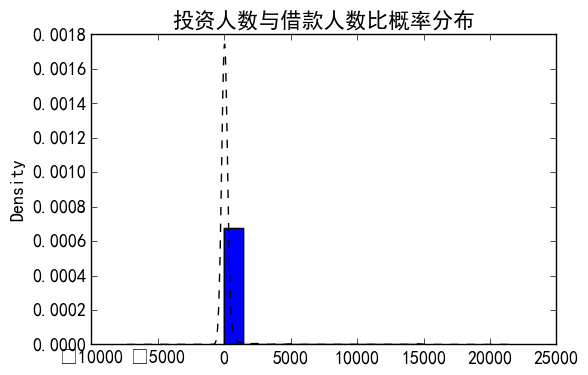

In [143]:
platDataDetail['invest/borrow'].hist(normed=True)
platDataDetail['invest/borrow'].plot(kind='kde',style='k--',title='投资人数与借款人数比概率分布')

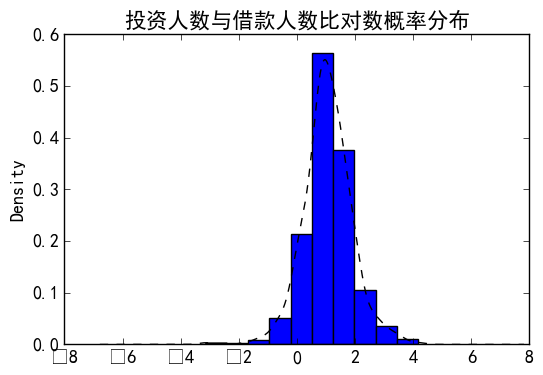

In [144]:
np.log10(platDataDetail['invest/borrow']).hist(normed=True)
np.log10(platDataDetail['invest/borrow']).plot(kind='kde',style='k--',title='投资人数与借款人数比对数概率分布')

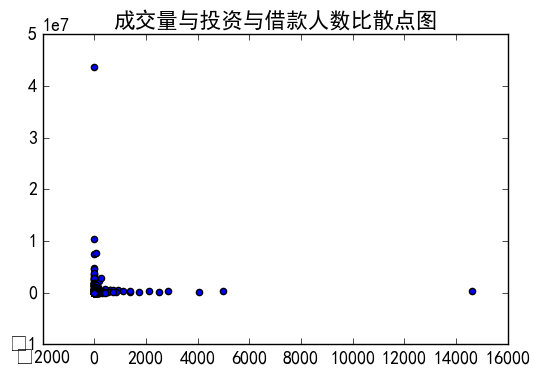

In [145]:
plt.scatter(y=platDataDetail['amount'],x=platDataDetail['invest/borrow'])#成交量与投资与借款人数比散点图
plt.title('成交量与投资与借款人数比散点图')

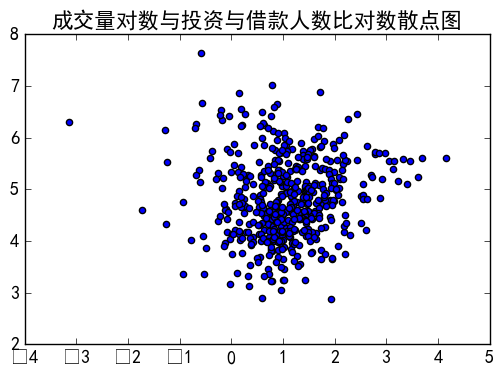

In [146]:
plt.scatter(y=np.log10(platDataDetail['amount']),x=np.log10(platDataDetail['invest/borrow']))#成交量与投资与借款人数比散点图
plt.title('成交量对数与投资与借款人数比对数散点图')

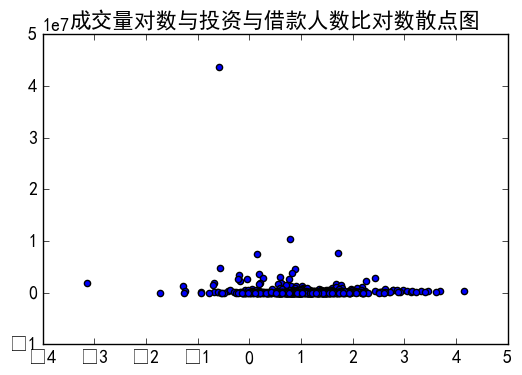

In [147]:
plt.scatter(y=platDataDetail['amount'],x=np.log10(platDataDetail['invest/borrow']))#成交量与投资与借款人数比散点图
plt.title('成交量对数与投资与借款人数比对数散点图')

In [148]:
incomeRateOnPeriod=pd.read_csv('platIncomeRateByPeriod.csv',parse_dates=True)#不同期限标的收益率

In [149]:
get_std=lambda g:np.std([g['day'],g['oneMonth'],g['twoMonth'],g['threeMonth'],g['sixMonth']])#五种期限的投资收益率的标准差
incomeRateOnPeriod['std']=incomeRateOnPeriod.apply(get_std,axis=1)

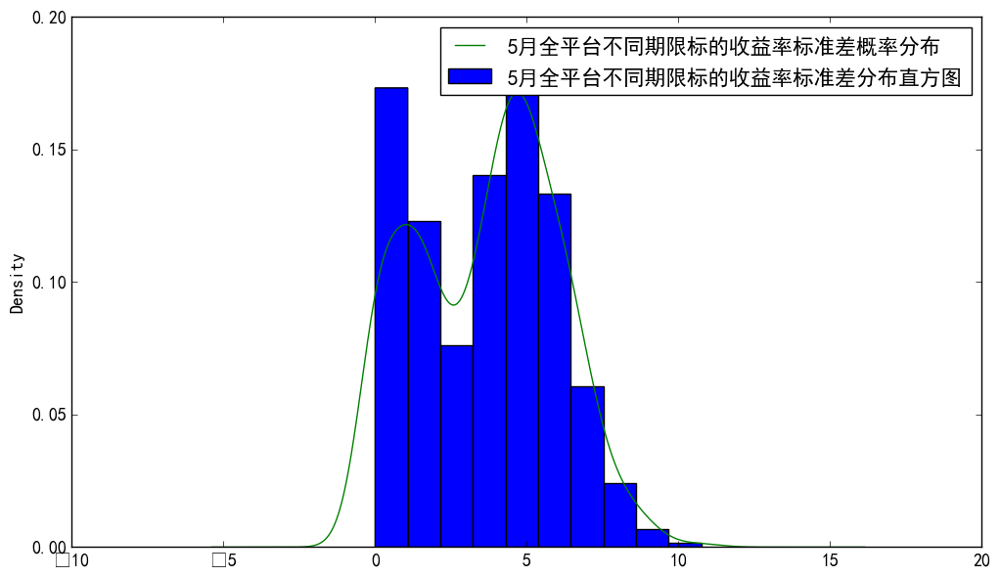

In [150]:
incomeRateOnPeriod[incomeRateOnPeriod['date']=='2017-05-31']['std'].hist(normed=True,label='5月全平台不同期限标的收益率标准差分布直方图',figsize=(12,7))
incomeRateOnPeriod[incomeRateOnPeriod['date']=='2017-05-31']['std'].plot(kind='kde',label='5月全平台不同期限标的收益率标准差概率分布')
plt.legend(loc='best')

In [151]:
incomeRateOnPeriod.index=incomeRateOnPeriod['date']

In [152]:
incomeRateOnPeriod.index=pd.to_datetime(incomeRateOnPeriod.index)

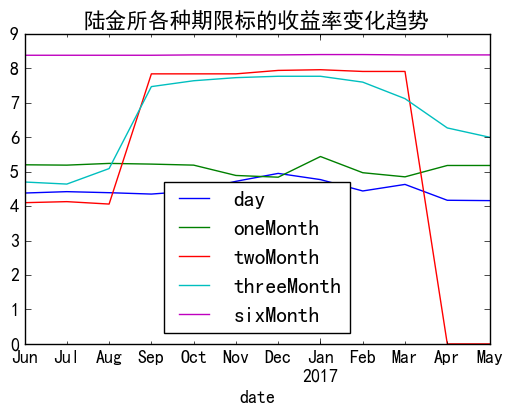

In [153]:
incomeRateOnPeriod[incomeRateOnPeriod['wdzjPlatId']==59][['day','oneMonth','twoMonth','threeMonth','sixMonth']]['2016-06':'2017-05'].plot(title='陆金所各种期限标的收益率变化趋势')

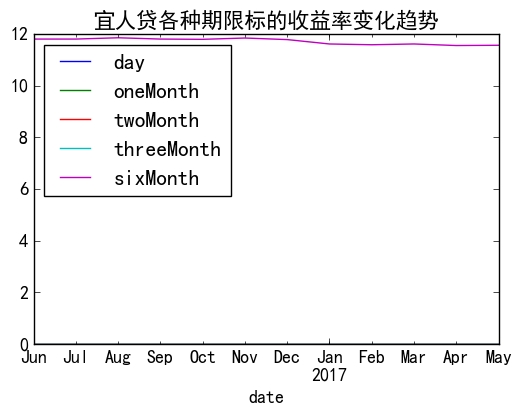

In [154]:
incomeRateOnPeriod[incomeRateOnPeriod['wdzjPlatId']==85][['day','oneMonth','twoMonth','threeMonth','sixMonth']]['2016-06':'2017-05'].plot(title='宜人贷各种期限标的收益率变化趋势')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 <a list of 12 Text xticklabel objects>)

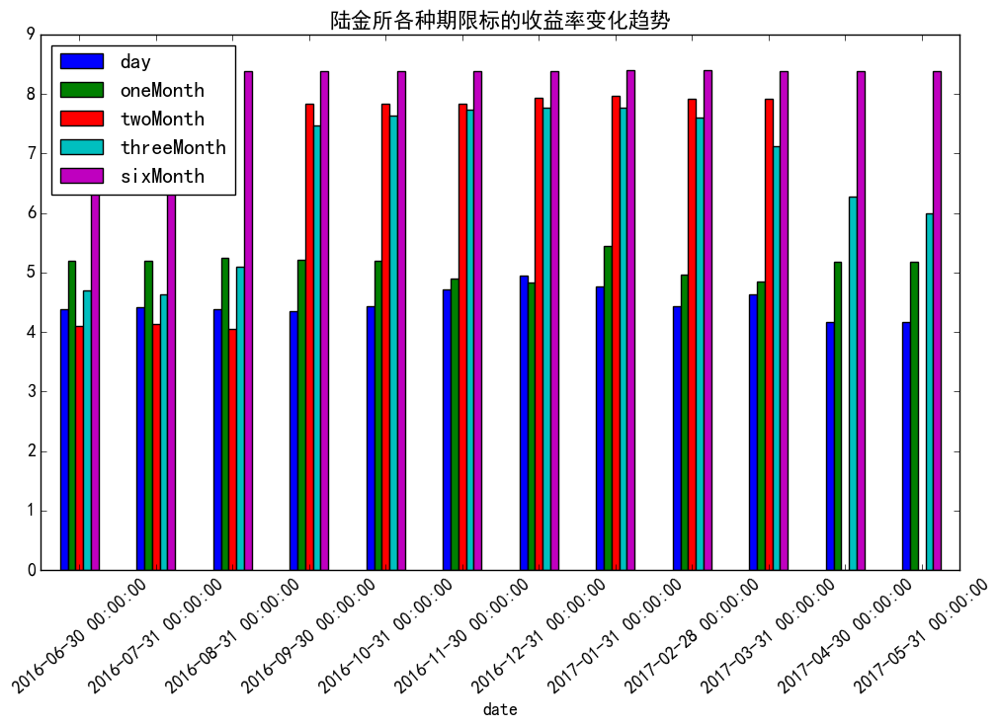

In [155]:
incomeRateOnPeriod[incomeRateOnPeriod['wdzjPlatId']==59][['day','oneMonth','twoMonth','threeMonth','sixMonth']]['2016-06':'2017-05'].plot(kind='bar',title='陆金所各种期限标的收益率变化趋势',
                                                                                                                                         figsize=(12,7))
plt.xticks(rotation=40)

In [156]:
platIncomeRateOnPeriod=incomeRateOnPeriod.groupby('wdzjPlatId').mean()

In [157]:
platIncomeRateOnPeriod['wdzjPlatId']=platIncomeRateOnPeriod.index.to_series()

In [158]:
platIncomeRateOnPeriod.columns=['id','dayIncomeRate','oneMonthIncomeRate','twoMonthIncomeRate','threeMonthIncomeRate',
                               'sixMonthIncomeRate','incomeRateStd','wdzjPlatId']

In [159]:
platDataDetail=pd.merge(platDataDetail,platIncomeRateOnPeriod[['dayIncomeRate','oneMonthIncomeRate','twoMonthIncomeRate','threeMonthIncomeRate',
                               'sixMonthIncomeRate','incomeRateStd','wdzjPlatId']],left_on='platId',right_on='wdzjPlatId')

In [160]:
platDataDetail

,id_x,actualCapital,aliasName,association,associationDetail,autoBid,autoBidCode,bankCapital,bankFunds,bidSecurity,...,borrowTotal,wdzjPlatId_y,invest/borrow,dayIncomeRate,oneMonthIncomeRate,twoMonthIncomeRate,threeMonthIncomeRate,sixMonthIncomeRate,incomeRateStd,wdzjPlatId
0,2144,8000.0,陆金所,1,2014年03月01日加入广西互联网金融协会任职务<br/>2016年03月25日加入中国互...,不支持,0.0,平安银行,1.0,-,...,723072.000000,59,0.255211,4.485000,5.115833,5.627500,6.650000,8.388333,1.759611,59
1,2145,5000.0,红岭创投,1,2014年03月01日加入互联网金融专业委员会任会员职务<br/>2016年03月25日加入...,支持,1.0,NaN,0.0,VIP100%本金保障，非VIP享受50%本金垫付,...,15732.333333,60,6.218324,5.644167,8.773333,8.943333,9.344167,10.859167,1.752757,60
2,2146,3938.0,小赢理财,0,NaN,支持,1.0,上海华瑞银行,1.0,众安保险承保,...,139336.333333,1309,0.269465,5.171667,5.590833,6.256667,7.135000,7.948333,1.023643,1309
3,2147,12195.0,微贷网,1,2015年09月13日加入杭州市互联网金融协会任执行会长职务,支持,1.0,厦门银行,1.0,当天偿付,...,78632.416667,38,1.439152,7.296667,8.809167,8.625000,9.132500,11.352500,1.347329,38
4,2148,3730.0,鑫合汇,1,2015年05月17日加入杭州市互联网金融协会任执行会长职务<br/>2016年08月19日...,支持,1.0,浙商银行,1.0,由第三方机构为鑫合汇融资项目提供担保服务,...,813.000000,505,52.188089,8.232500,8.337500,8.161667,9.102500,10.198333,0.889101,505
5,2149,20000.0,爱钱进,0,NaN,支持,1.0,华夏银行,1.0,风险准备金,...,152640.916667,689,1.533993,0.000000,10.787500,12.017500,11.401250,12.273750,4.692234,689
6,2150,3793.0,团贷网,1,2014年03月07日加入东莞市互联网金融协会任会长单位职务<br/>2013年12月01日...,支持,1.0,厦门银行,1.0,VIP享有担保公司垫付本息，普通会员享有担保公司垫付本金,...,13565.083333,91,7.637089,10.020000,9.892500,10.319167,10.770833,12.785000,1.109198,91
7,2151,5000.0,51人品,1,2016年09月13日加入杭州市互联网金融协会任副会长职务,支持,1.0,NaN,NaN,风险准备金,...,304212.750000,4891,0.666727,6.619167,6.616667,6.605000,6.676667,6.918333,0.136131,4891
8,2152,6000.0,宜贷网,0,NaN,支持,1.0,恒丰银行,1.0,100％抵押标,...,3596.500000,942,3.928982,10.138333,10.468333,10.431667,10.680000,14.370000,1.619496,942
9,2153,3000.0,宜人贷,0,NaN,不支持,0.0,广发银行,1.0,-,...,34483.250000,85,5.939355,0.000000,0.000000,0.000000,0.000000,11.714167,4.685667,85


In [161]:
platDataDetail['incomeRateStd'].sort_values()

139     0.000000
113     0.000000
338     0.000000
456     0.000000
249     0.000000
276     0.000000
487     0.000000
197     0.000000
146     0.000000
118     0.000000
488     0.000000
418     0.000000
292     0.000000
395     0.000000
7       0.136131
120     0.246402
72      0.263248
35      0.310816
220     0.396859
151     0.423529
97      0.423726
290     0.446051
142     0.550555
214     0.559316
172     0.624793
385     0.627811
25      0.636538
20      0.648482
265     0.657503
112     0.674296
         ...    
428     7.541311
486     7.601038
251     7.713142
330     7.729863
484     7.733927
496     7.742530
489     7.781034
359     7.783117
129     7.786890
450     7.825782
360     7.834707
322     7.842496
439     7.886667
301     8.175665
411     8.200375
371     8.346704
434     8.348446
504     8.402634
436     8.420190
367     8.544868
296     8.551979
480     8.694879
455     8.744974
396     8.878905
405     8.935588
410     9.093382
404     9.136927
271     9.2178

In [162]:
fullTimeOnPeriod=pd.read_csv('platFullTimeByPeriod.csv',parse_dates=True)#不同期限标的满标时间

In [163]:
platFullTime=fullTimeOnPeriod.groupby('wdzjPlatId').max()#由于缺失数据较多，也就是有较多的0项，则取最大值最为平台的参考值

In [164]:
platFullTime

,id,date,day,oneMonth,twoMonth,threeMonth,sixMonth
wdzjPlatId,,,,,,,
34,966,2017-05-31,0.00,2730.66,2076.66,8871.87,2754.89
37,3470,2017-05-31,72748.14,54696.25,62621.38,100854.70,152966.14
38,48,2017-05-31,2400.56,345.88,4055.56,1240.99,4945.32
40,152,2017-05-31,227.90,904.78,2083.19,3665.43,605.63
49,2811,2017-05-31,1489.20,50999.74,43937.00,35332.69,35724.46
50,1912,2017-05-31,33206.14,484485.60,965686.65,203211.52,453059.85
53,1038,2017-05-31,1467.55,2556.91,13110.76,12379.80,16336.86
57,380,2017-05-31,0.00,0.00,0.00,570.40,2920.62
59,12,2017-05-31,0.00,24.67,3676.60,994.14,86.18


In [165]:
invNumVSBorNum=pd.read_csv('platInvNumVsBorNum.csv',parse_dates=True)#投资人数借款人数对比

In [166]:
invNumVSBorNum.index=invNumVSBorNum['date']
invNumVSBorNum.index=pd.to_datetime(invNumVSBorNum.index)

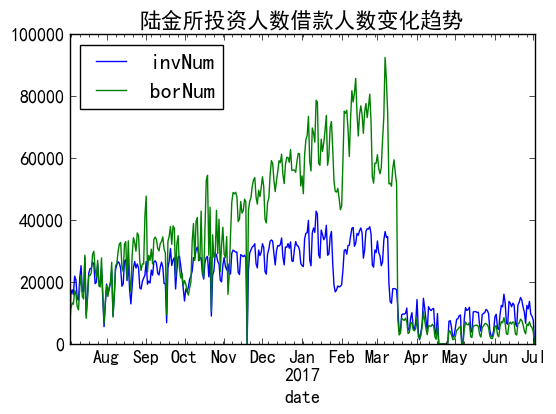

In [167]:
invNumVSBorNum[invNumVSBorNum['wdzjPlatId']==59][['invNum','borNum']].plot(title='陆金所投资人数借款人数变化趋势')

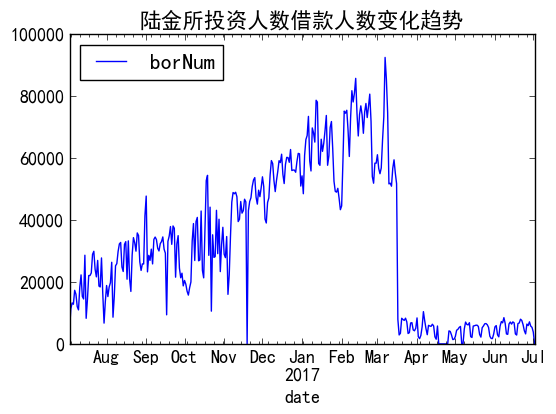

In [168]:
invNumVSBorNum[invNumVSBorNum['wdzjPlatId']==59][['borNum']].plot(title='陆金所投资人数借款人数变化趋势')

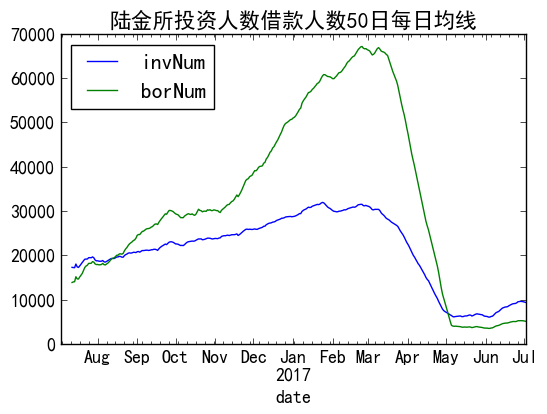

In [169]:
invNumVSBorNum[invNumVSBorNum['wdzjPlatId']==59][['invNum','borNum']].rolling(window=50,min_periods=10).mean().plot(title='陆金所投资人数借款人数50日每日均线')

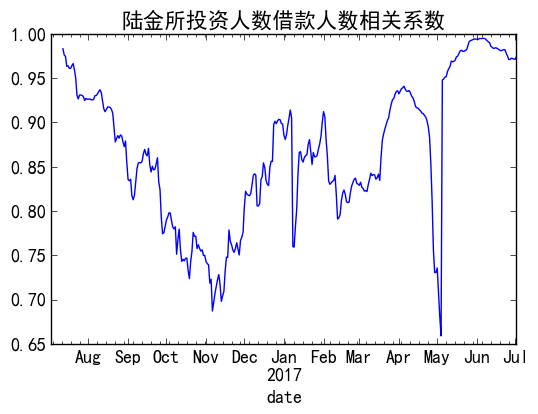

In [170]:
invNumVSBorNum[invNumVSBorNum['wdzjPlatId']==59]['invNum'].rolling(window=50,min_periods=10).corr(invNumVSBorNum[invNumVSBorNum['wdzjPlatId']==59]['borNum']).plot(title='陆金所投资人数借款人数相关系数')

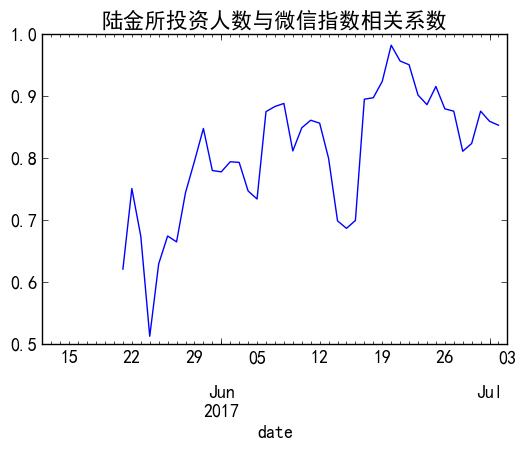

In [171]:
invNumVSBorNum[invNumVSBorNum['wdzjPlatId']==59]['invNum']['2017-05-12':'2017-07-03'].rolling(window=10,min_periods=10).corr(lujinWeixinIndex['index']['2017-05-12':'2017-07-03']).plot(title='陆金所投资人数与微信指数相关系数')

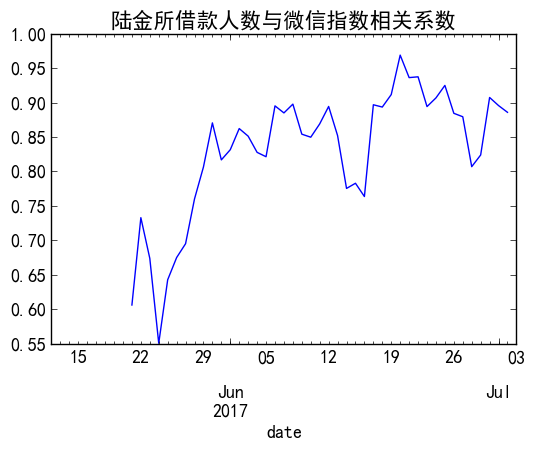

In [172]:
invNumVSBorNum[invNumVSBorNum['wdzjPlatId']==59]['borNum']['2017-05-12':'2017-07-03'].rolling(window=10,min_periods=10).corr(lujinWeixinIndex['index']['2017-05-12':'2017-07-03']).plot(title='陆金所借款人数与微信指数相关系数')

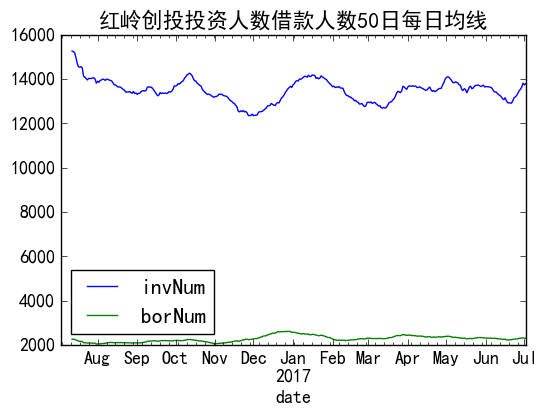

In [173]:
invNumVSBorNum[invNumVSBorNum['wdzjPlatId']==60][['invNum','borNum']].rolling(window=50,min_periods=10).mean().plot(title='红岭创投投资人数借款人数50日每日均线')

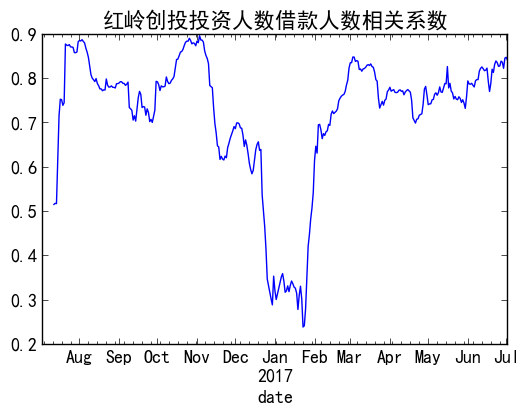

In [174]:
invNumVSBorNum[invNumVSBorNum['wdzjPlatId']==60]['invNum'].rolling(window=50,min_periods=10).corr(invNumVSBorNum[invNumVSBorNum['wdzjPlatId']==60]['borNum']).plot(title='红岭创投投资人数借款人数相关系数')

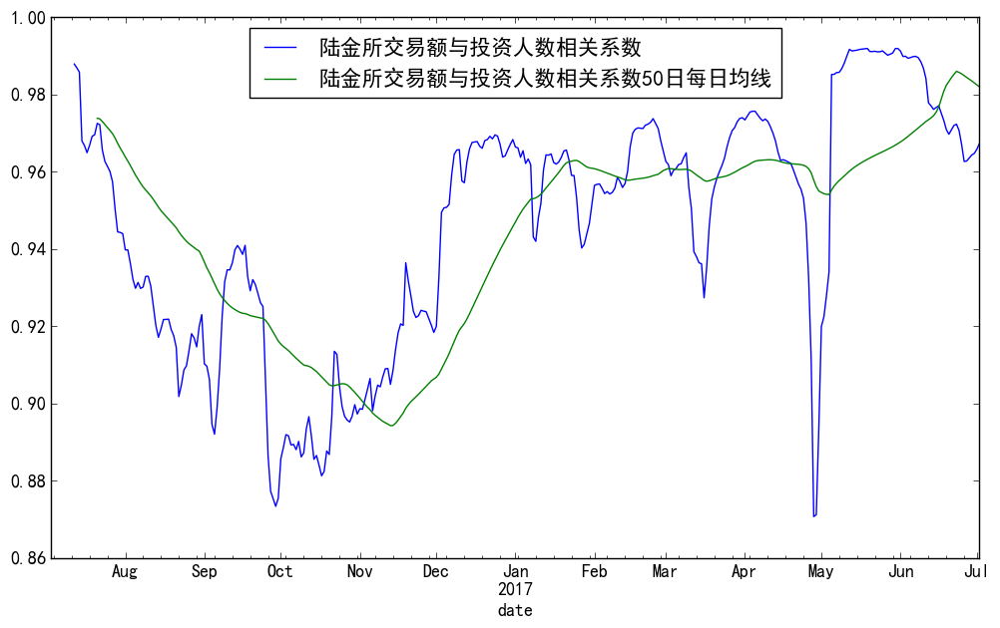

In [175]:
platVolume[platVolume['wdzjPlatId']==59]['amount'].rolling(window=50,min_periods=10).corr(invNumVSBorNum[invNumVSBorNum['wdzjPlatId']==59]['invNum']).plot(label='陆金所交易额与投资人数相关系数',figsize=(12,7))
platVolume[platVolume['wdzjPlatId']==59]['amount'].rolling(window=50,min_periods=10).corr(invNumVSBorNum[invNumVSBorNum['wdzjPlatId']==59]['invNum']).rolling(window=50,min_periods=10).mean().plot(label='陆金所交易额与投资人数相关系数50日每日均线',figsize=(12,7))
plt.legend(loc='best')

In [176]:
incomeRateData=incomeRateData['2016-07-05':'2017-07-02']#数据对齐

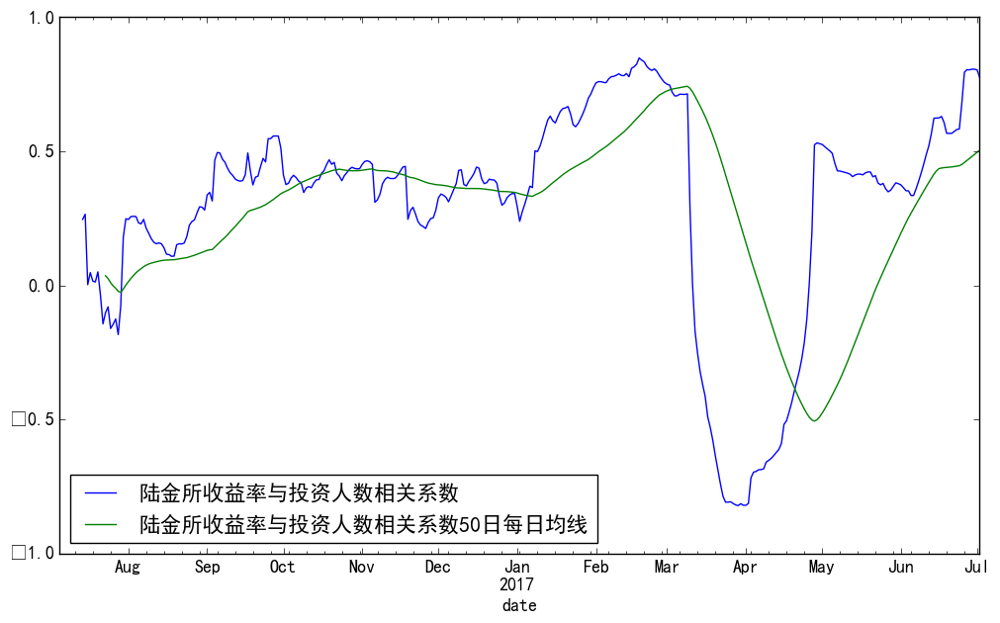

In [177]:
incomeRateData[incomeRateData['wdzjPlatId']==59]['incomeRate'].rolling(window=50,min_periods=10).corr(invNumVSBorNum[invNumVSBorNum['wdzjPlatId']==59]['invNum']['2016-07-05':'2017-07-02']).plot(label='陆金所收益率与投资人数相关系数',figsize=(12,7))
incomeRateData[incomeRateData['wdzjPlatId']==59]['incomeRate'].rolling(window=50,min_periods=10).corr(invNumVSBorNum[invNumVSBorNum['wdzjPlatId']==59]['invNum']['2016-07-05':'2017-07-02']).rolling(window=50,min_periods=10).mean().plot(label='陆金所收益率与投资人数相关系数50日每日均线',figsize=(12,7))
plt.legend(loc='best')

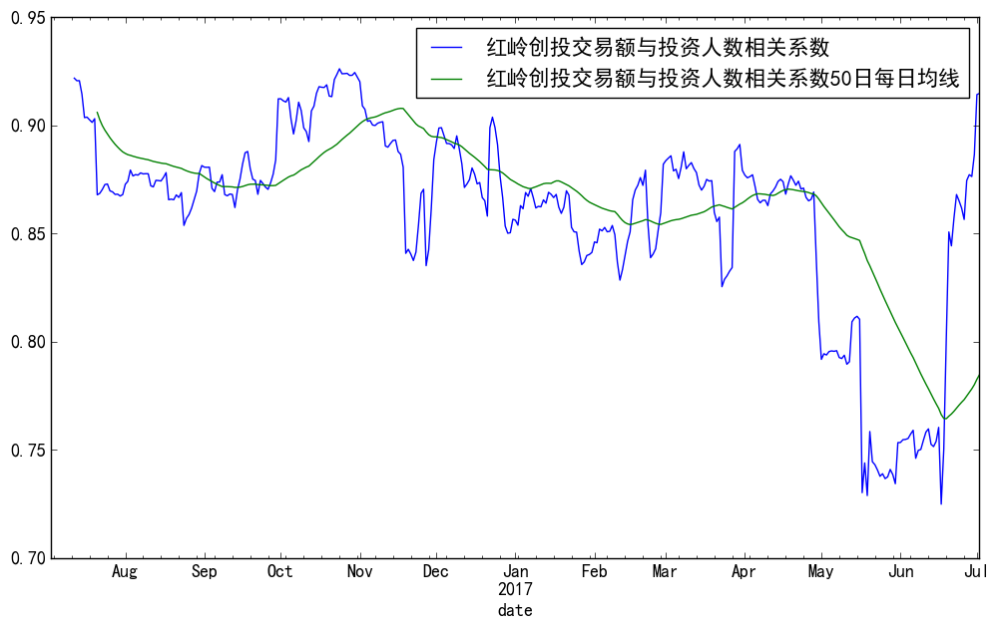

In [178]:
platVolume[platVolume['wdzjPlatId']==60]['amount'].rolling(window=50,min_periods=10).corr(invNumVSBorNum[invNumVSBorNum['wdzjPlatId']==60]['invNum']).plot(label='红岭创投交易额与投资人数相关系数',figsize=(12,7))
platVolume[platVolume['wdzjPlatId']==60]['amount'].rolling(window=50,min_periods=10).corr(invNumVSBorNum[invNumVSBorNum['wdzjPlatId']==60]['invNum']).rolling(window=50,min_periods=10).mean().plot(label='红岭创投交易额与投资人数相关系数50日每日均线',figsize=(12,7))
plt.legend(loc='best')

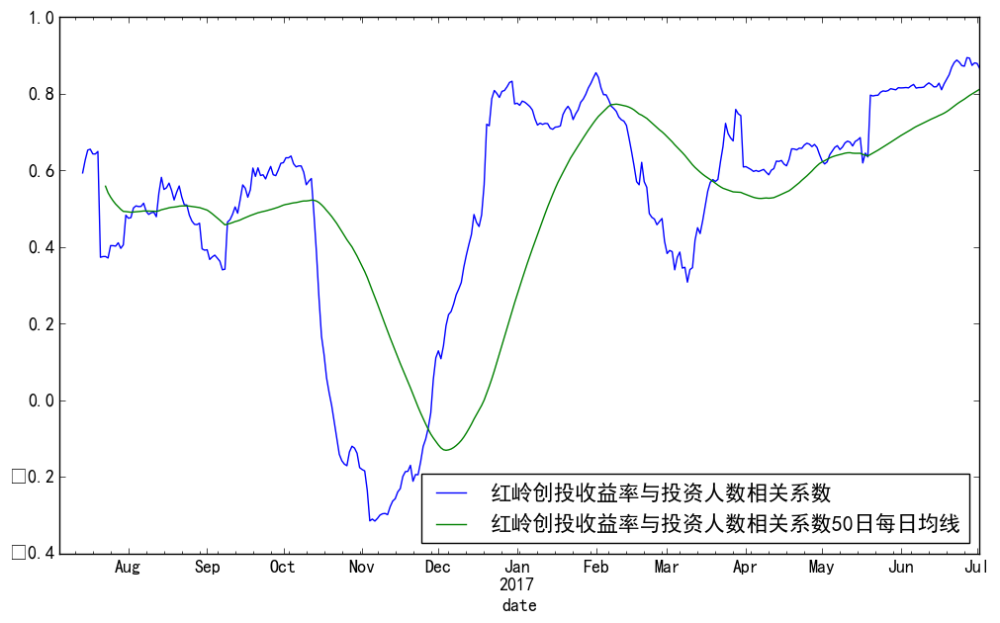

In [179]:
incomeRateData[incomeRateData['wdzjPlatId']==60]['incomeRate'].rolling(window=50,min_periods=10).corr(invNumVSBorNum[invNumVSBorNum['wdzjPlatId']==60]['invNum']['2016-07-05':'2017-07-02']).plot(label='红岭创投收益率与投资人数相关系数',figsize=(12,7))
incomeRateData[incomeRateData['wdzjPlatId']==60]['incomeRate'].rolling(window=50,min_periods=10).corr(invNumVSBorNum[invNumVSBorNum['wdzjPlatId']==60]['invNum']['2016-07-05':'2017-07-02']).rolling(window=50,min_periods=10).mean().plot(label='红岭创投收益率与投资人数相关系数50日每日均线',figsize=(12,7))
plt.legend(loc='best')

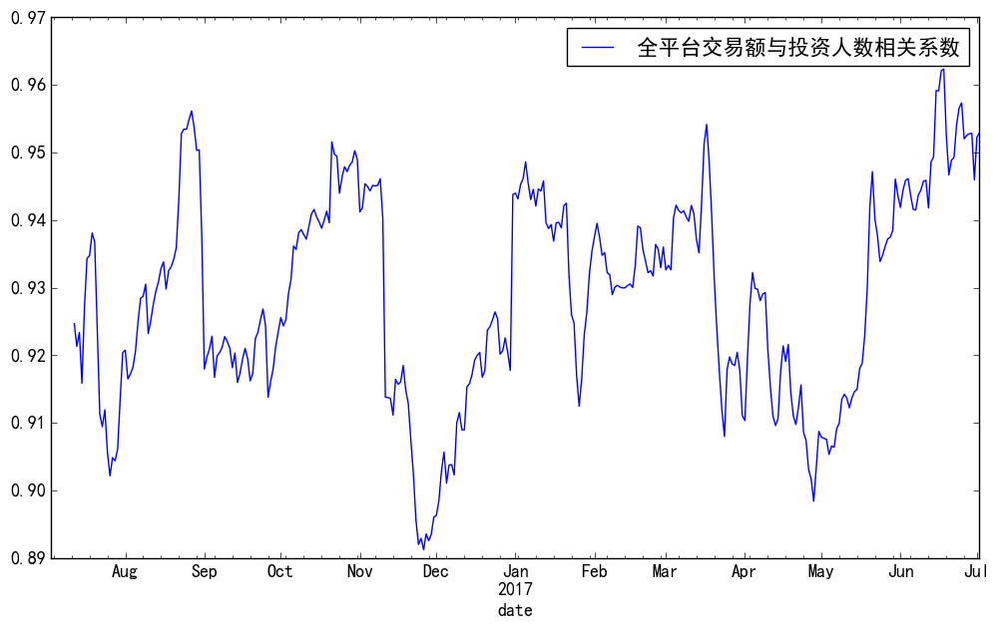

In [180]:
platVolume.resample('D').sum()['amount'].rolling(window=50,min_periods=10).corr(invNumVSBorNum.resample('D').sum()['invNum']).plot(label='全平台交易额与投资人数相关系数',figsize=(12,7))
plt.legend(loc='best')

In [181]:
dayData=DataFrame(dayData)

In [182]:
dayData.rename(columns={0:'incomeRate'},inplace=True)

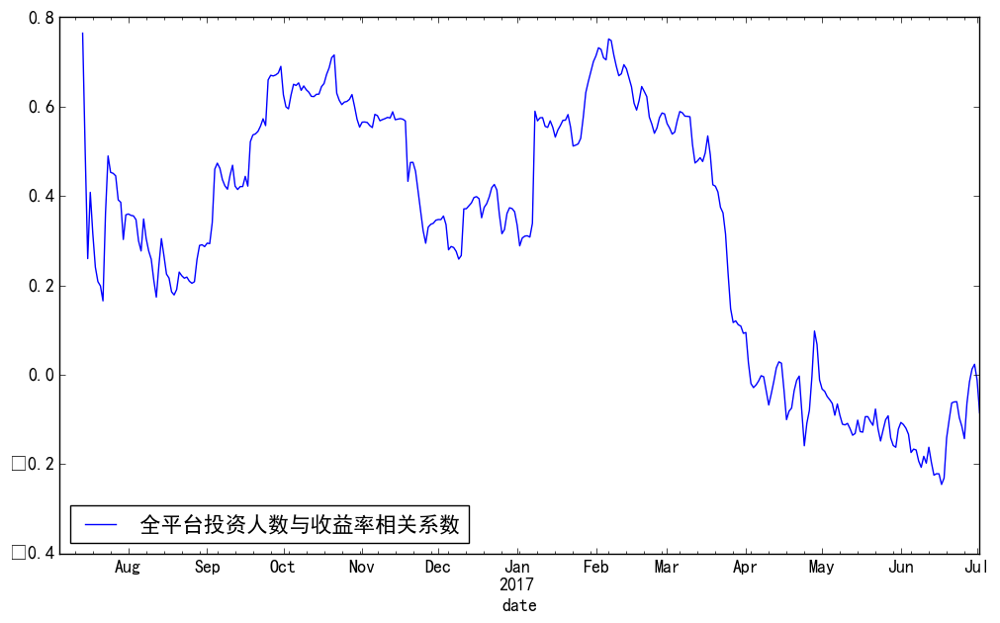

In [183]:
invNumVSBorNum.resample('D').sum()['invNum']['2016-07-05':'2017-07-03'].rolling(window=50,min_periods=10).corr(dayData['2016-07-05':'2017-07-03']['incomeRate']).plot(label='全平台投资人数与收益率相关系数',figsize=(12,7))
plt.legend(loc='best')

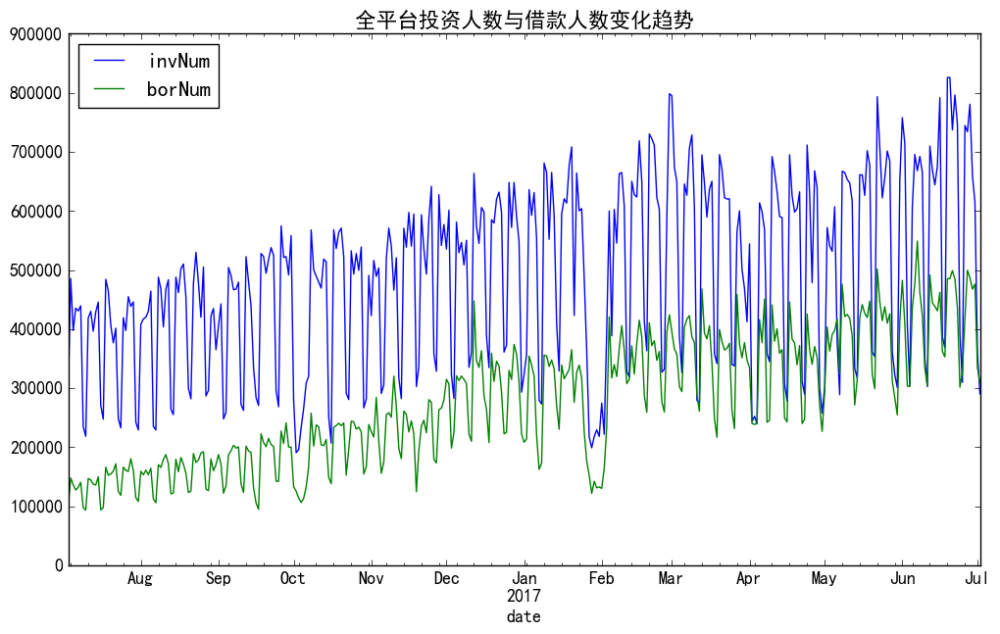

In [184]:
invNumVSBorNum.resample('D').sum()[['invNum','borNum']].plot(title='全平台投资人数与借款人数变化趋势',figsize=(12,7))

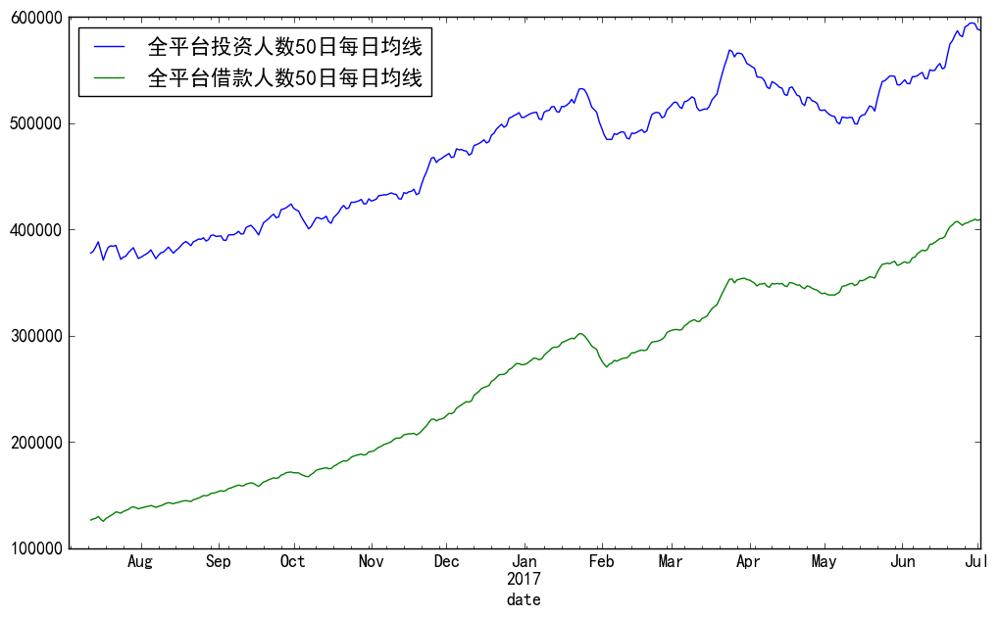

In [185]:
invNumVSBorNum.resample('D').sum()['invNum'].rolling(window=50,min_periods=10).mean().plot(label='全平台投资人数50日每日均线',figsize=(12,7))
invNumVSBorNum.resample('D').sum()['borNum'].rolling(window=50,min_periods=10).mean().plot(label='全平台借款人数50日每日均线')
plt.legend(loc='best')

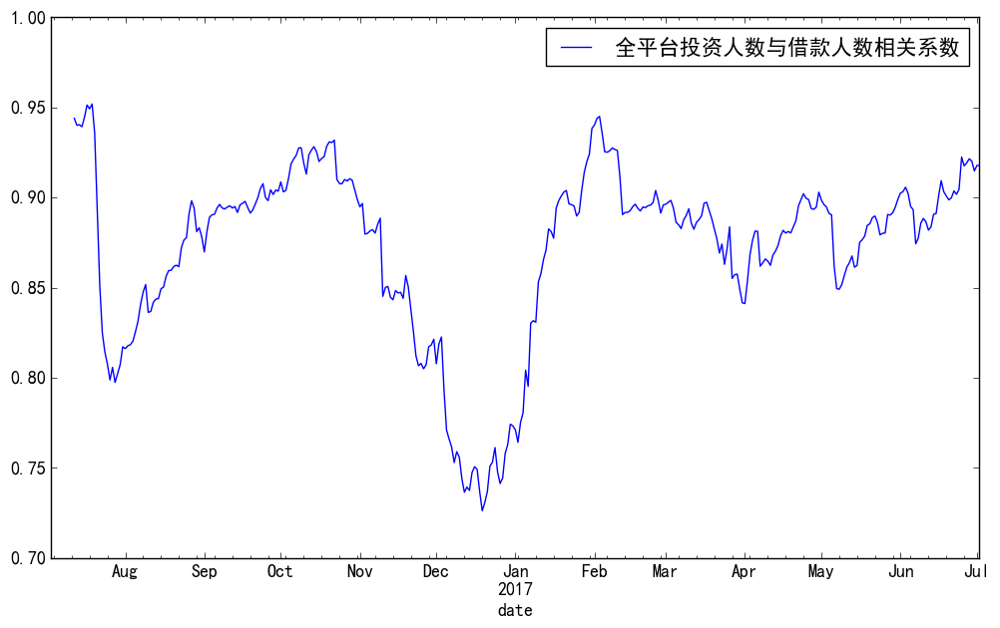

In [186]:
invNumVSBorNum.resample('D').sum()['invNum'].rolling(window=50,min_periods=10).corr(invNumVSBorNum.resample('D').sum()['borNum']).plot(label='全平台投资人数与借款人数相关系数',figsize=(12,7))
plt.legend(loc='best')

In [187]:
platInvNumVSBorNum=invNumVSBorNum.groupby('wdzjPlatId').mean()

In [188]:
platInvNumVSBorNum['wdzjPlatId']=platInvNumVSBorNum.index.to_series()

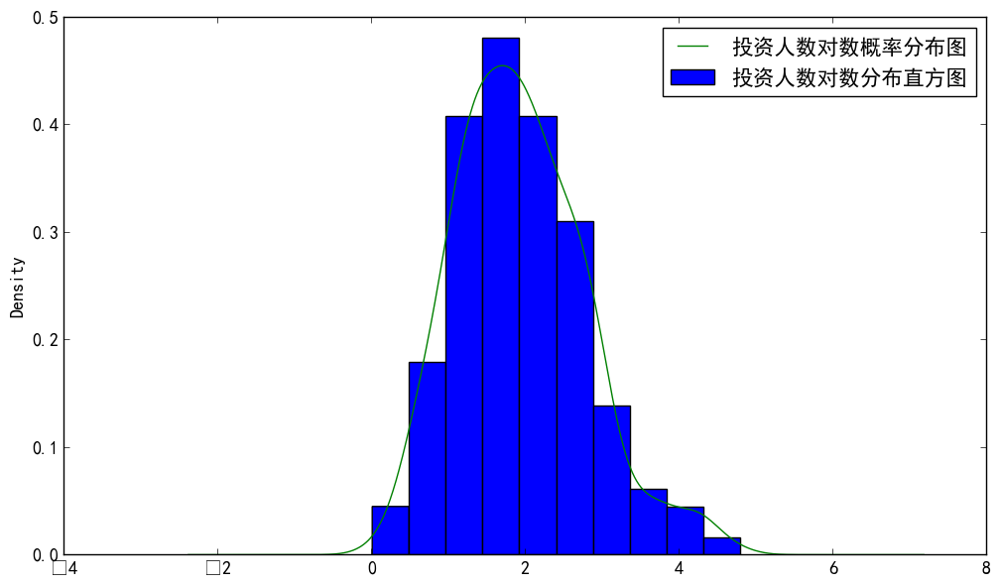

In [189]:
np.log10(platInvNumVSBorNum['invNum']).hist(label='投资人数对数分布直方图',figsize=(12,7),normed=True)
np.log10(platInvNumVSBorNum['invNum']).plot(kind='kde',label='投资人数对数概率分布图')
plt.legend(loc='best')#投资人数集中在白人规模

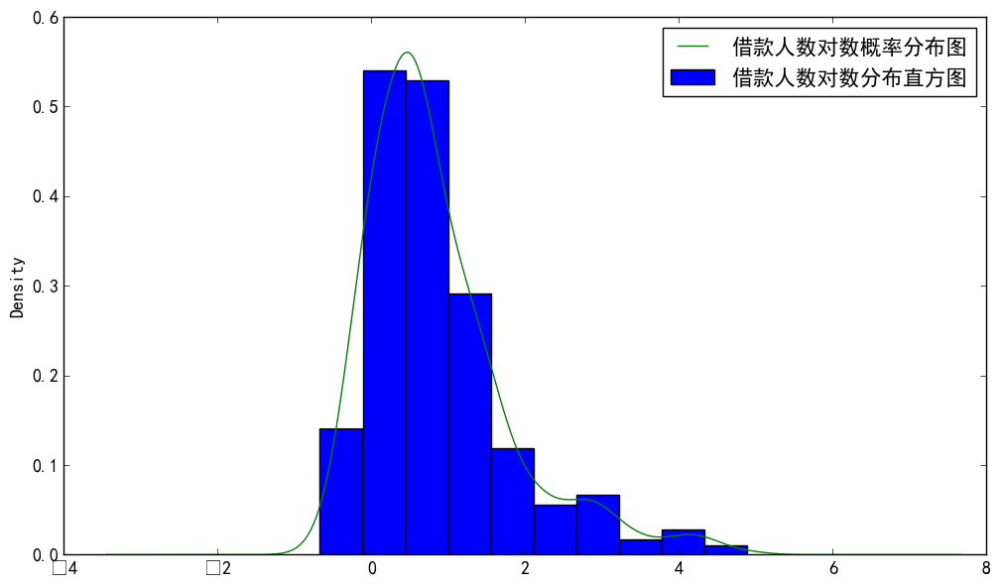

In [190]:
np.log10(platInvNumVSBorNum['borNum']).hist(label='借款人数对数分布直方图',figsize=(12,7),normed=True)
np.log10(platInvNumVSBorNum['borNum']).plot(kind='kde',label='借款人数对数概率分布图')
plt.legend(loc='best')#日均借款人数 集中在十位数这个量级

In [191]:
platDataDetail=pd.merge(platDataDetail,platInvNumVSBorNum[['invNum','borNum','wdzjPlatId']],left_on='platId',right_on='wdzjPlatId')

In [192]:
platDataDetail

,id_x,actualCapital,aliasName,association,associationDetail,autoBid,autoBidCode,bankCapital,bankFunds,bidSecurity,...,dayIncomeRate,oneMonthIncomeRate,twoMonthIncomeRate,threeMonthIncomeRate,sixMonthIncomeRate,incomeRateStd,wdzjPlatId_x,invNum,borNum,wdzjPlatId_y
0,2144,8000.0,陆金所,1,2014年03月01日加入广西互联网金融协会任职务<br/>2016年03月25日加入中国互...,不支持,0.0,平安银行,1.0,-,...,4.485000,5.115833,5.627500,6.650000,8.388333,1.759611,59,20451.608219,31520.586301,59
1,2145,5000.0,红岭创投,1,2014年03月01日加入互联网金融专业委员会任会员职务<br/>2016年03月25日加入...,支持,1.0,NaN,0.0,VIP100%本金保障，非VIP享受50%本金垫付,...,5.644167,8.773333,8.943333,9.344167,10.859167,1.752757,60,13491.284932,2282.613699,60
2,2146,3938.0,小赢理财,0,NaN,支持,1.0,上海华瑞银行,1.0,众安保险承保,...,5.171667,5.590833,6.256667,7.135000,7.948333,1.023643,1309,5474.339726,7224.030137,1309
3,2147,12195.0,微贷网,1,2015年09月13日加入杭州市互联网金融协会任执行会长职务,支持,1.0,厦门银行,1.0,当天偿付,...,7.296667,8.809167,8.625000,9.132500,11.352500,1.347329,38,10441.221918,2820.405479,38
4,2148,3730.0,鑫合汇,1,2015年05月17日加入杭州市互联网金融协会任执行会长职务<br/>2016年08月19日...,支持,1.0,浙商银行,1.0,由第三方机构为鑫合汇融资项目提供担保服务,...,8.232500,8.337500,8.161667,9.102500,10.198333,0.889101,505,5909.271233,99.030137,505
5,2149,20000.0,爱钱进,0,NaN,支持,1.0,华夏银行,1.0,风险准备金,...,0.000000,10.787500,12.017500,11.401250,12.273750,4.692234,689,62095.852055,77476.553425,689
6,2150,3793.0,团贷网,1,2014年03月07日加入东莞市互联网金融协会任会长单位职务<br/>2013年12月01日...,支持,1.0,厦门银行,1.0,VIP享有担保公司垫付本息，普通会员享有担保公司垫付本金,...,10.020000,9.892500,10.319167,10.770833,12.785000,1.109198,91,18556.032877,1101.994521,91
7,2151,5000.0,51人品,1,2016年09月13日加入杭州市互联网金融协会任副会长职务,支持,1.0,NaN,NaN,风险准备金,...,6.619167,6.616667,6.605000,6.676667,6.918333,0.136131,4891,33098.383562,15222.578082,4891
8,2152,6000.0,宜贷网,0,NaN,支持,1.0,恒丰银行,1.0,100％抵押标,...,10.138333,10.468333,10.431667,10.680000,14.370000,1.619496,942,3538.578082,972.706849,942
9,2153,3000.0,宜人贷,0,NaN,不支持,0.0,广发银行,1.0,-,...,0.000000,0.000000,0.000000,0.000000,11.714167,4.685667,85,37636.591781,1191.682192,85


In [193]:
invMeanVSBorMean=pd.read_csv('platInvMeanVsBorMean.csv',parse_dates=True)#人均投资金额与人均借款金额 单位万元

In [194]:
invMeanVSBorMean.index=invMeanVSBorMean['date']
invMeanVSBorMean.index=pd.to_datetime(invMeanVSBorMean.index)

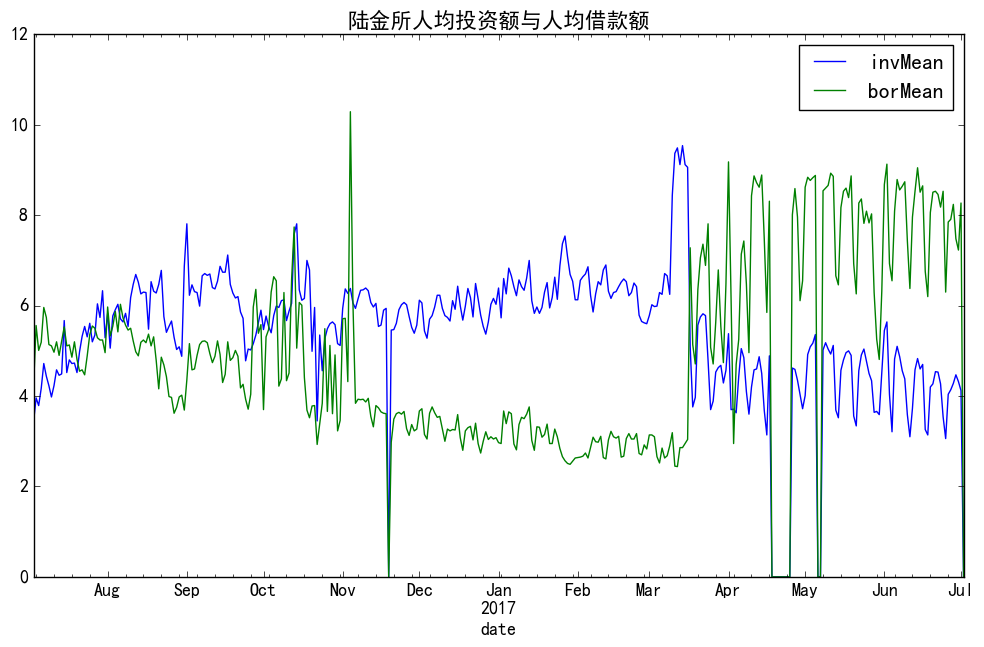

In [195]:
invMeanVSBorMean[invMeanVSBorMean['wdzjPlatId']==59][['invMean','borMean']].plot(title='陆金所人均投资额与人均借款额',figsize=(12,7))

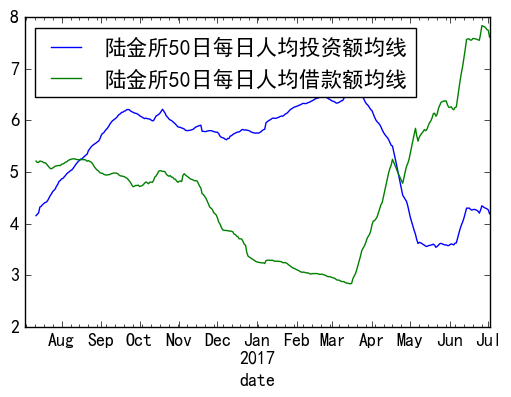

In [196]:
invMeanVSBorMean[invMeanVSBorMean['wdzjPlatId']==59]['invMean'].rolling(window=50,min_periods=10).mean().plot(label='陆金所50日每日人均投资额均线')
invMeanVSBorMean[invMeanVSBorMean['wdzjPlatId']==59]['borMean'].rolling(window=50,min_periods=10).mean().plot(label='陆金所50日每日人均借款额均线')
plt.legend(loc='best')

In [197]:
platInvMeanVSBorMean=invMeanVSBorMean.groupby('wdzjPlatId').mean()[['invMean','borMean']]

In [198]:
platInvMeanVSBorMean['wdzjPlatId']=platInvMeanVSBorMean.index.to_series()

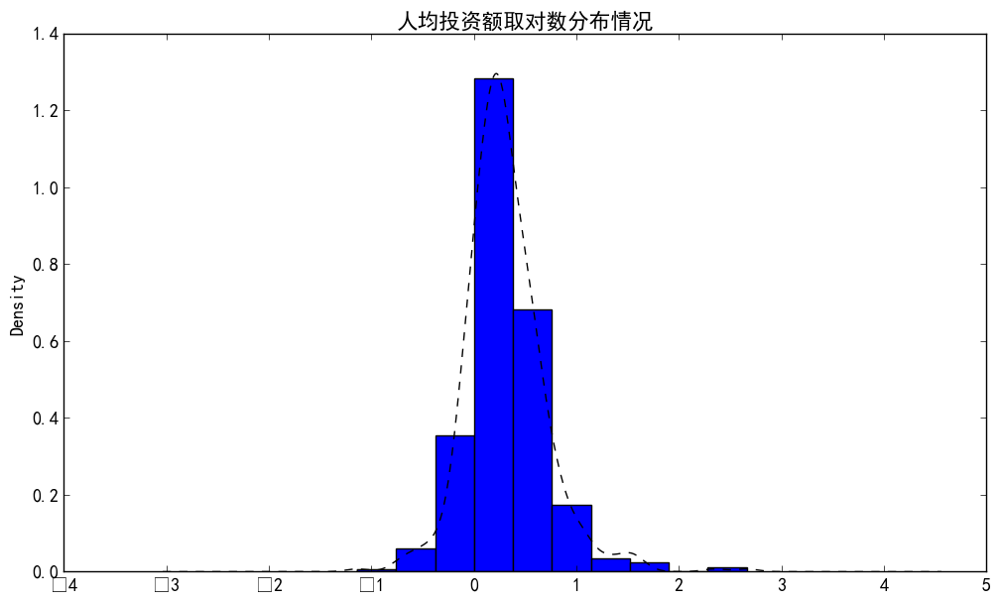

In [199]:
np.log10(platInvMeanVSBorMean['invMean']).hist(normed=True,figsize=(12,7))
np.log10(platInvMeanVSBorMean['invMean']).plot(kind='kde',style='k--',title='人均投资额取对数分布情况')

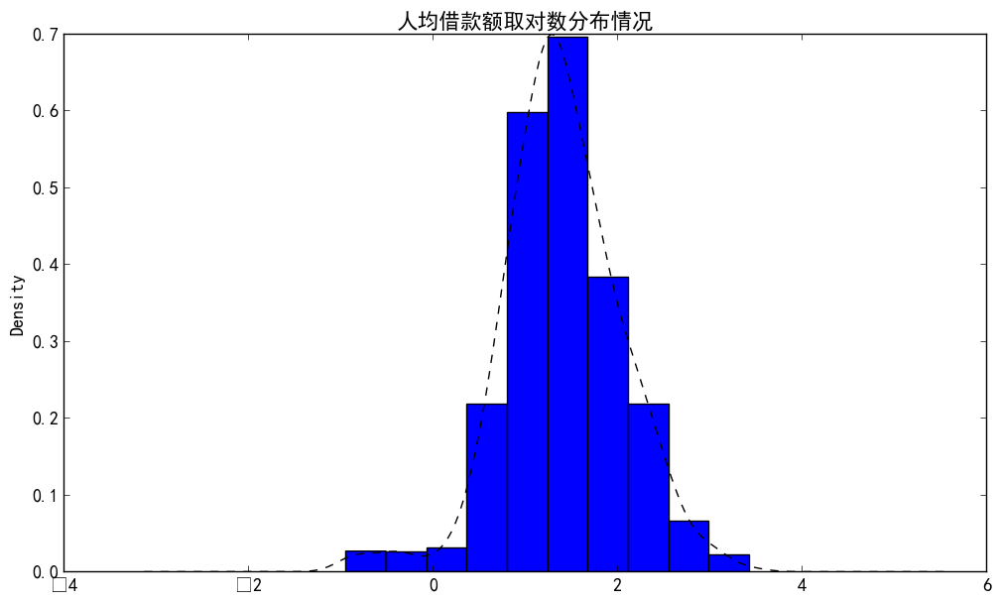

In [200]:
np.log10(platInvMeanVSBorMean['borMean']).hist(normed=True,figsize=(12,7))
np.log10(platInvMeanVSBorMean['borMean']).plot(kind='kde',style='k--',title='人均借款额取对数分布情况')

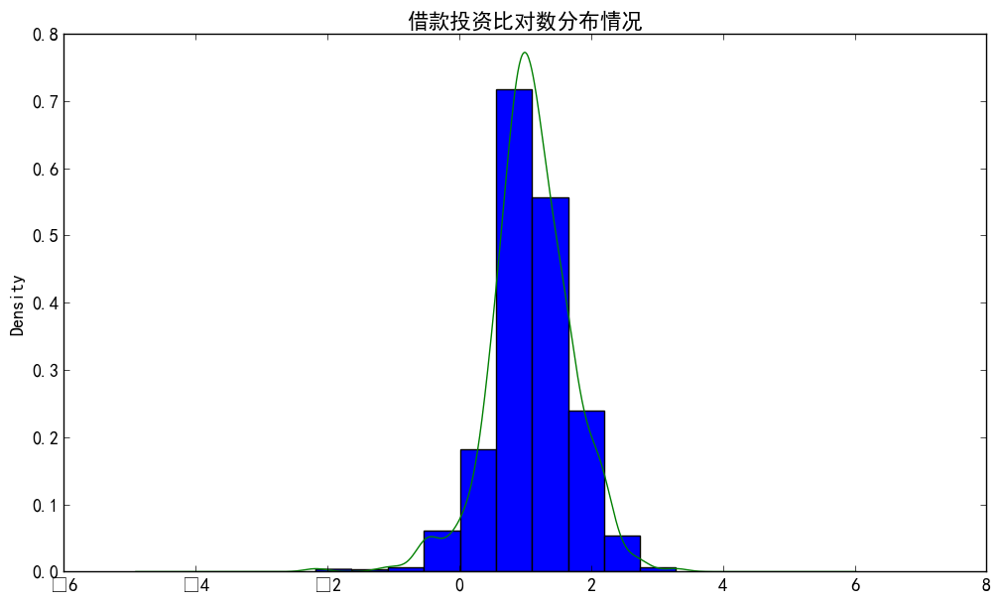

In [201]:
np.log10(platInvMeanVSBorMean['borMean']/platInvMeanVSBorMean['invMean']).hist(normed=True)
np.log10(platInvMeanVSBorMean['borMean']/platInvMeanVSBorMean['invMean']).plot(kind='kde',title='借款投资比对数分布情况',figsize=(12,7))

In [202]:
print('借款投资比最大为：',(platInvMeanVSBorMean['borMean']/platInvMeanVSBorMean['invMean']).max())
print('借款投资比最小为：',(platInvMeanVSBorMean['borMean']/platInvMeanVSBorMean['invMean']).min())

借款投资比最大为： 1945.64638243
借款投资比最小为： 0.00667295985096


In [203]:
invBorRatio=platInvMeanVSBorMean['borMean']/platInvMeanVSBorMean['invMean']

In [204]:
invBorRatio[invBorRatio==(platInvMeanVSBorMean['borMean']/platInvMeanVSBorMean['invMean']).max()]

wdzjPlatId
827    1945.646382
dtype: float64

In [205]:
platDataDetail[platDataDetail['platId']==827]['amount']

15    2269685.05
Name: amount, dtype: float64

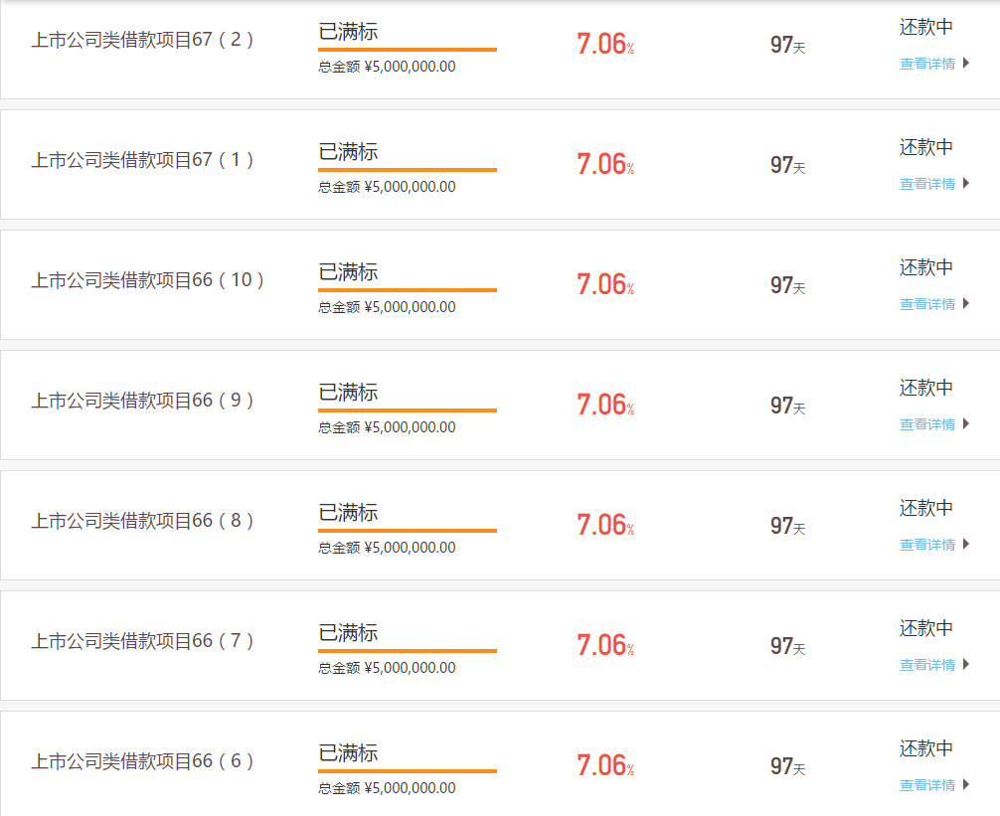

In [206]:
Image(filename='1.png', width=500)

In [207]:
invBorRatio[invBorRatio==(platInvMeanVSBorMean['borMean']/platInvMeanVSBorMean['invMean']).min()]

wdzjPlatId
129    0.006673
dtype: float64

In [208]:
platDataDetail[platDataDetail['platId']==129]['amount']

14    1977663.07
Name: amount, dtype: float64

In [209]:
platDataDetail[platDataDetail['platId']==129]

,id_x,actualCapital,aliasName,association,associationDetail,autoBid,autoBidCode,bankCapital,bankFunds,bidSecurity,...,dayIncomeRate,oneMonthIncomeRate,twoMonthIncomeRate,threeMonthIncomeRate,sixMonthIncomeRate,incomeRateStd,wdzjPlatId_x,invNum,borNum,wdzjPlatId_y
14,2158,10000.0,点融网,1,2016年03月25日加入中国互联网金融协会任常务理事单位职务,不支持,0.0,恒丰银行,1.0,风险互助准备金机制,...,0.566667,7.283333,7.385833,7.96,11.260833,3.566098,129,12.663014,6958.556164,129


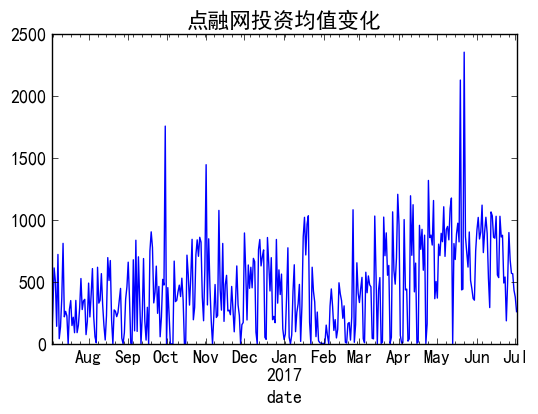

In [210]:
invMeanVSBorMean[invMeanVSBorMean['wdzjPlatId']==129]['invMean'].plot(title='点融网投资均值变化')

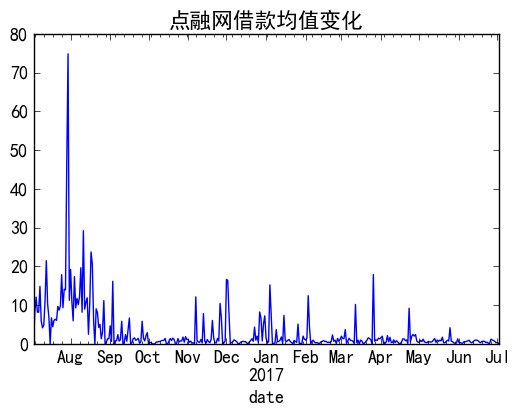

In [211]:
invMeanVSBorMean[invMeanVSBorMean['wdzjPlatId']==129]['borMean'].plot(title='点融网借款均值变化')

In [212]:
platInvMeanVSBorMean['borMean/invMean']=platInvMeanVSBorMean['borMean']/platInvMeanVSBorMean['invMean']

In [213]:
platDataDetail=pd.merge(platDataDetail,platInvMeanVSBorMean,left_on='platId',right_on='wdzjPlatId')

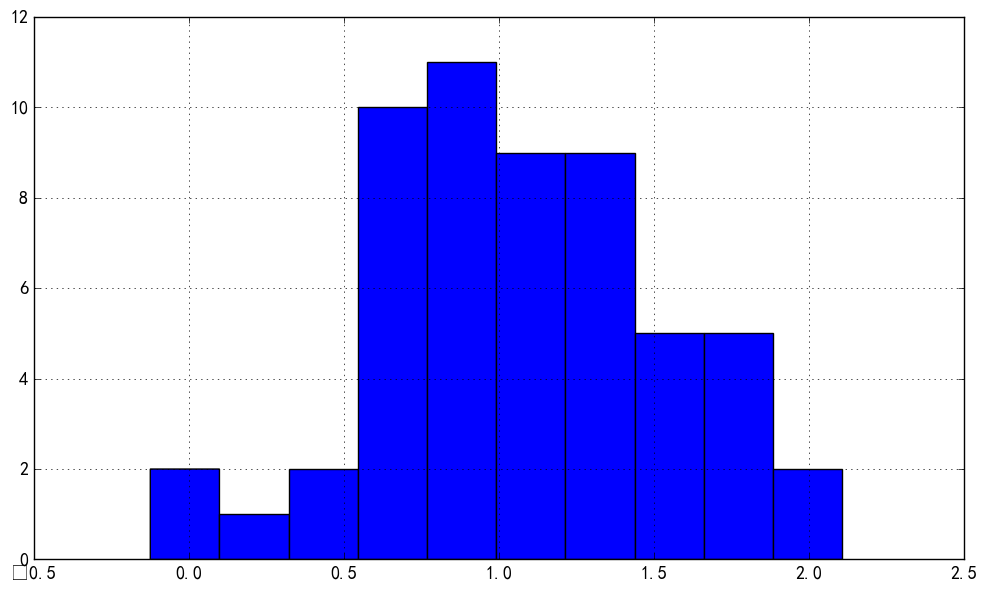

In [214]:
np.log10(platDataDetail[platDataDetail['businessType'].str.contains('企业')==True]['borMean/invMean']).hist(figsize=(12,7))#经营企业贷的 借款与投资均值比值 对数分布

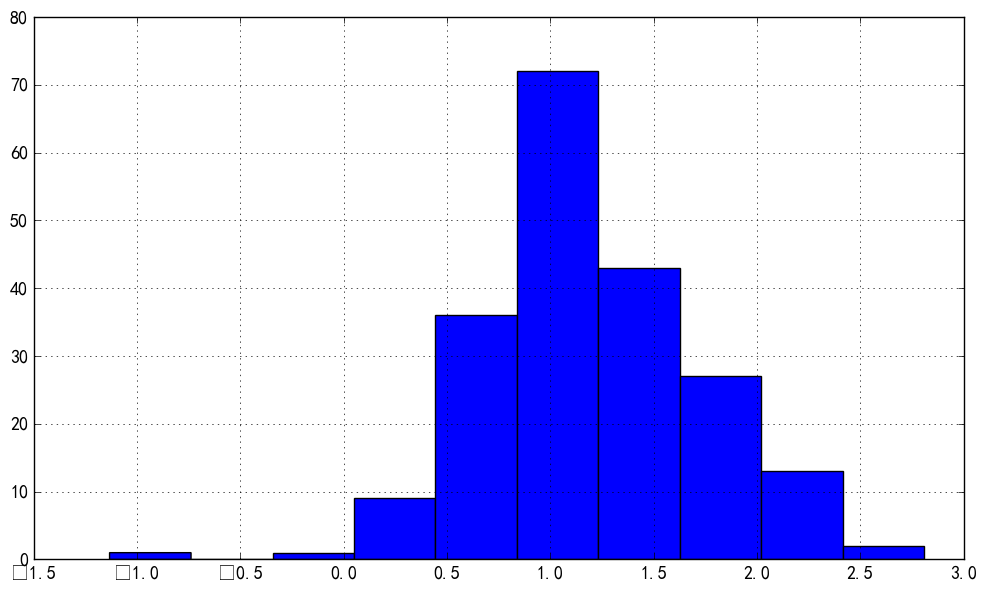

In [215]:
np.log10(platDataDetail[platDataDetail['businessType'].str.contains('房贷')==True]['borMean/invMean']).hist(figsize=(12,7))

In [216]:
newNumVsOldNum=pd.read_csv('platNewNumVSOldNum.csv',parse_dates=True)#新投资人数与老投资人数

In [217]:
newNumVsOldNum.index=newNumVsOldNum['date']
newNumVsOldNum.index=pd.to_datetime(newNumVsOldNum.index)

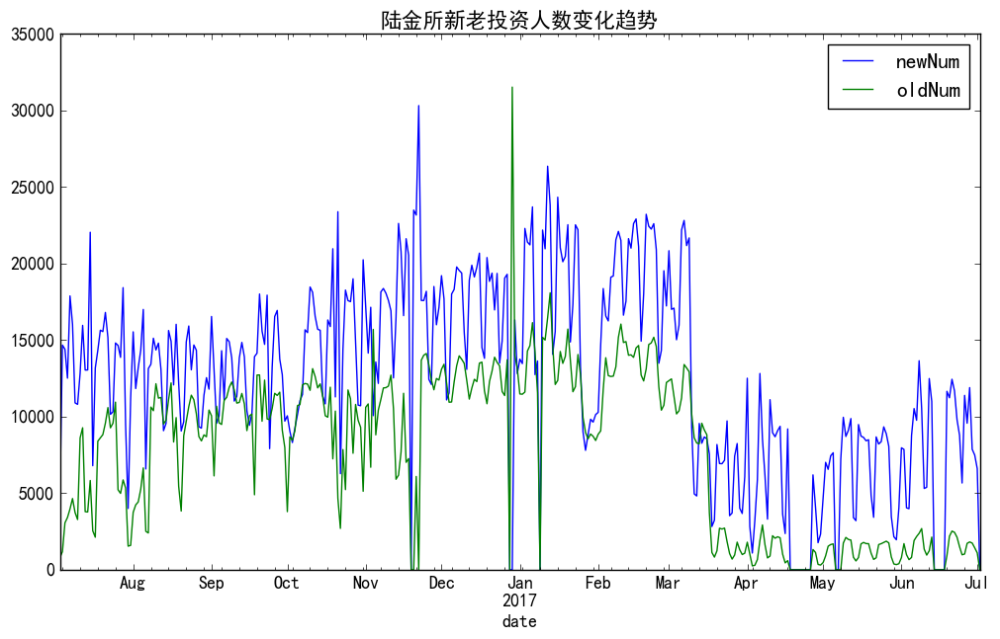

In [218]:
newNumVsOldNum[newNumVsOldNum['wdzjPlatId']==59][['newNum','oldNum']].plot(title='陆金所新老投资人数变化趋势',figsize=(12,7))

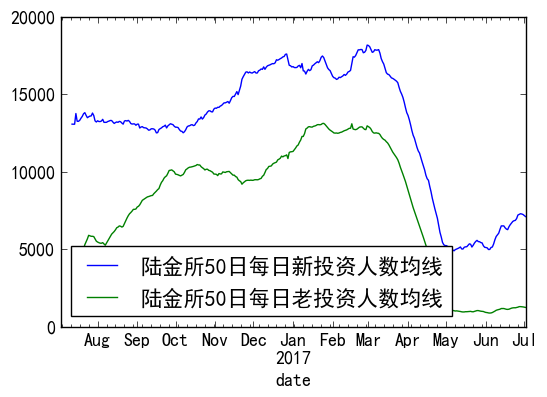

In [219]:
newNumVsOldNum[newNumVsOldNum['wdzjPlatId']==59]['newNum'].rolling(window=50,min_periods=10).mean().plot(label='陆金所50日每日新投资人数均线')
newNumVsOldNum[newNumVsOldNum['wdzjPlatId']==59]['oldNum'].rolling(window=50,min_periods=10).mean().plot(label='陆金所50日每日老投资人数均线')
plt.legend(loc='best')

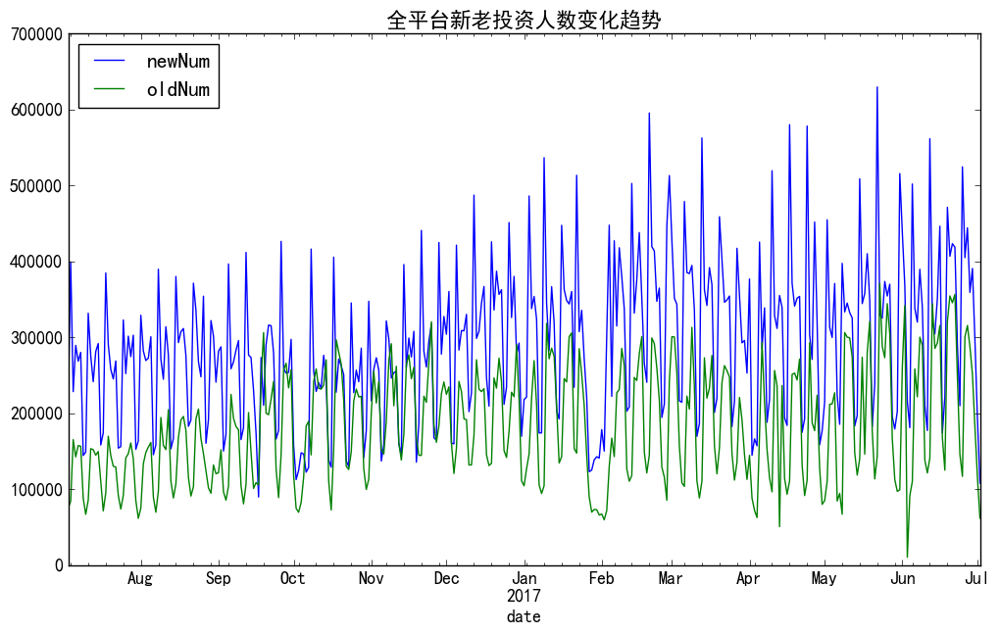

In [220]:
newNumVsOldNum.resample('D').sum()[['newNum','oldNum']].plot(title='全平台新老投资人数变化趋势',figsize=(12,7))

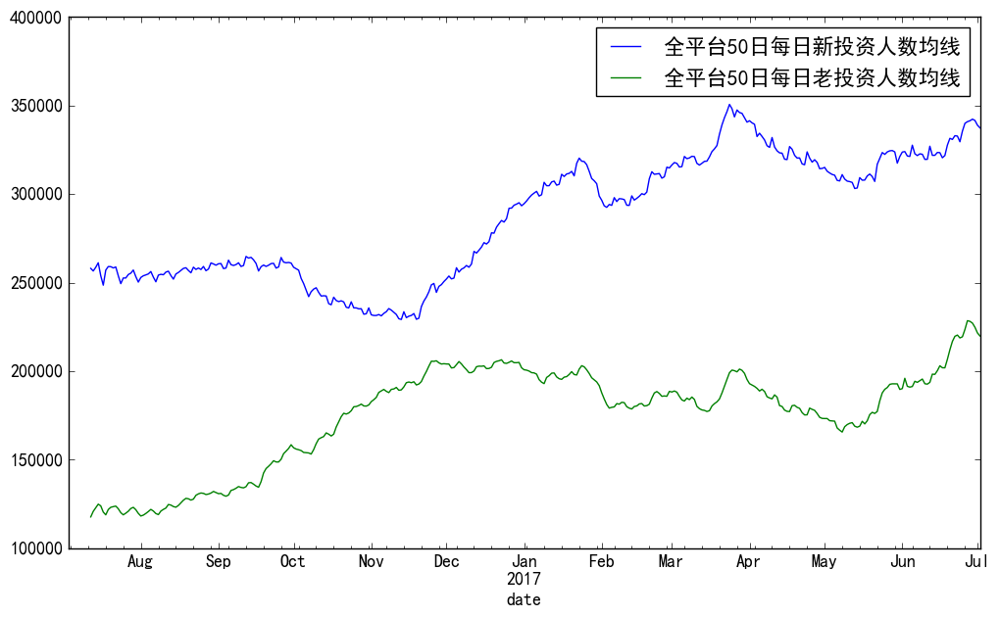

In [221]:
newNumVsOldNum.resample('D').sum()['newNum'].rolling(window=50,min_periods=10).mean().plot(label='全平台50日每日新投资人数均线',figsize=(12,7))
newNumVsOldNum.resample('D').sum()['oldNum'].rolling(window=50,min_periods=10).mean().plot(label='全平台50日每日老投资人数均线')
plt.legend(loc='best')

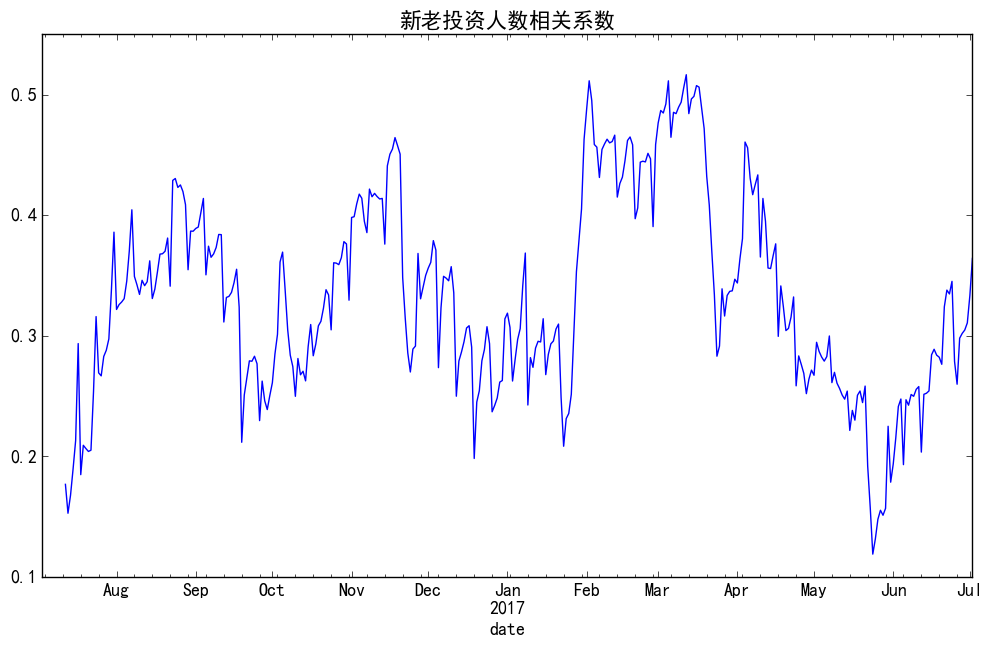

In [222]:
newNumVsOldNum.resample('D').sum()['newNum'].rolling(window=50,min_periods=10).corr(newNumVsOldNum.resample('D').sum()['oldNum']).plot(title='新老投资人数相关系数',figsize=(12,7))

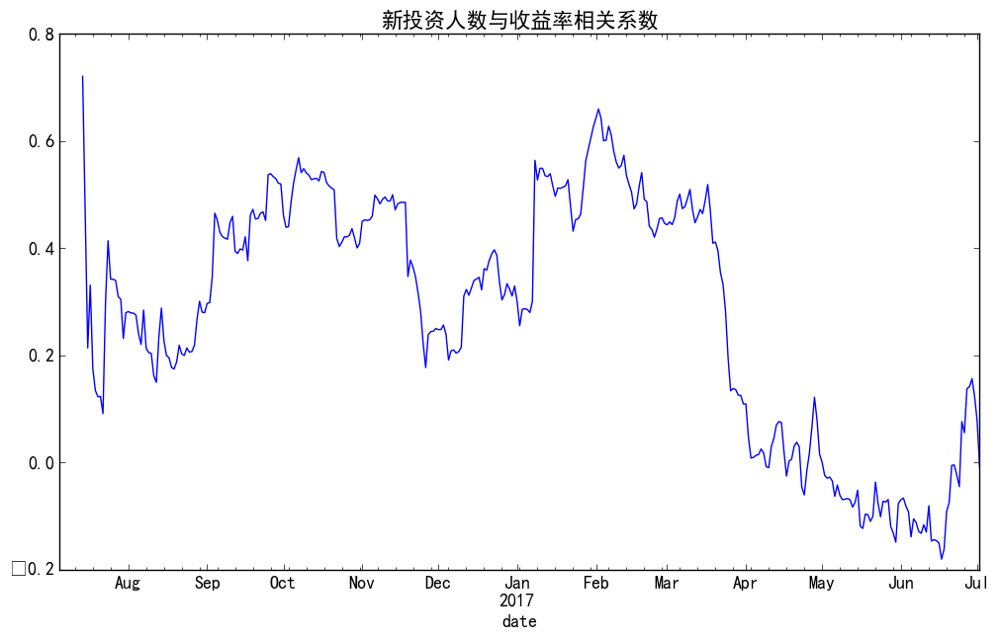

In [223]:
newNumVsOldNum.resample('D').sum()['newNum']['2016-07-05':'2017-07-02'].rolling(window=50,min_periods=10).corr(dayData['incomeRate']['2016-07-05':'2017-07-02']).plot(title='新投资人数与收益率相关系数',figsize=(12,7))

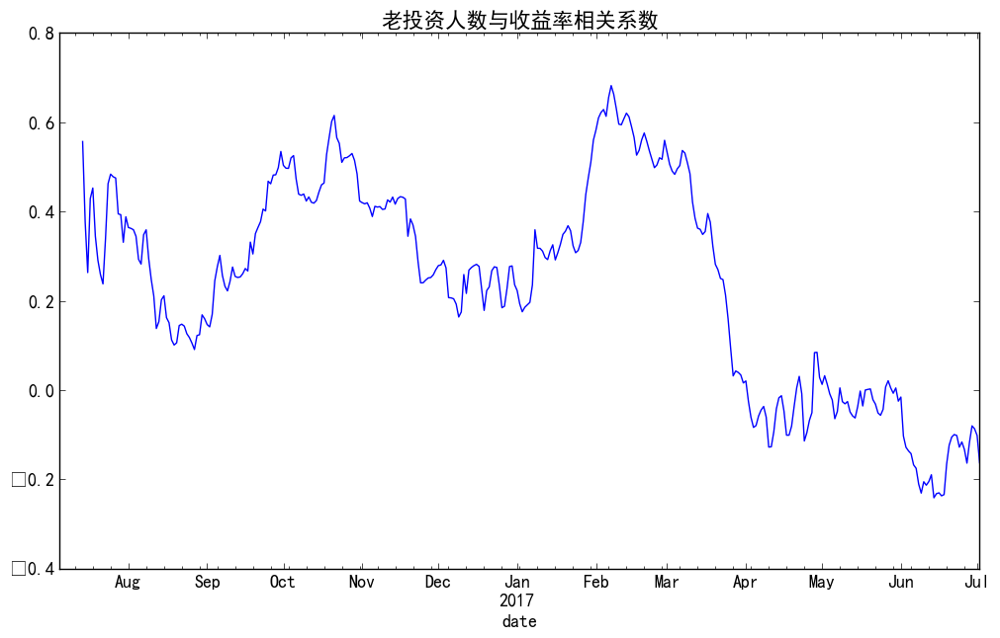

In [224]:
newNumVsOldNum.resample('D').sum()['oldNum']['2016-07-05':'2017-07-02'].rolling(window=50,min_periods=10).corr(dayData['incomeRate']['2016-07-05':'2017-07-02']).plot(title='老投资人数与收益率相关系数',figsize=(12,7))

In [225]:
platNewNumVSOldNum=newNumVsOldNum.groupby('wdzjPlatId').sum()/365

In [226]:
platNewNumVSOldNum['wdzjPlatId']=platNewNumVSOldNum.index.to_series()

In [227]:
platDataDetail=pd.merge(platDataDetail,platNewNumVSOldNum,left_on='platId',right_on='wdzjPlatId')

In [228]:
platDataDetail

,id_x,actualCapital,aliasName,association,associationDetail,autoBid,autoBidCode,bankCapital,bankFunds,bidSecurity,...,borNum,wdzjPlatId_y,invMean,borMean,wdzjPlatId_x,borMean/invMean,id,newNum,oldNum,wdzjPlatId_y
0,2144,8000.0,陆金所,1,2014年03月01日加入广西互联网金融协会任职务<br/>2016年03月25日加入中国互...,不支持,0.0,平安银行,1.0,-,...,31520.586301,59,5.398575,4.822000,59,0.893199,183.000000,12536.715068,7592.301370,59
1,2145,5000.0,红岭创投,1,2014年03月01日加入互联网金融专业委员会任会员职务<br/>2016年03月25日加入...,支持,1.0,NaN,0.0,VIP100%本金保障，非VIP享受50%本金垫付,...,2282.613699,60,2.098767,12.569918,60,5.989191,548.000000,8785.632877,4483.915068,60
2,2146,3938.0,小赢理财,0,NaN,支持,1.0,上海华瑞银行,1.0,众安保险承保,...,7224.030137,1309,2.410137,6.279918,1309,2.605627,913.000000,3053.687671,2235.386301,1309
3,2147,12195.0,微贷网,1,2015年09月13日加入杭州市互联网金融协会任执行会长职务,支持,1.0,厦门银行,1.0,当天偿付,...,2820.405479,38,1.961507,7.145644,38,3.642936,1278.000000,8155.306849,2179.876712,38
4,2148,3730.0,鑫合汇,1,2015年05月17日加入杭州市互联网金融协会任执行会长职务<br/>2016年08月19日...,支持,1.0,浙商银行,1.0,由第三方机构为鑫合汇融资项目提供担保服务,...,99.030137,505,3.009699,501.374658,505,166.586333,1643.000000,4213.304110,1423.810959,505
5,2149,20000.0,爱钱进,0,NaN,支持,1.0,华夏银行,1.0,风险准备金,...,77476.553425,689,0.185178,0.145534,689,0.785915,2002.000000,26679.547945,33312.764384,689
6,2150,3793.0,团贷网,1,2014年03月07日加入东莞市互联网金融协会任会长单位职务<br/>2013年12月01日...,支持,1.0,厦门银行,1.0,VIP享有担保公司垫付本息，普通会员享有担保公司垫付本金,...,1101.994521,91,0.707014,11.996219,91,16.967449,2365.002740,8172.235616,9660.021918,91
7,2151,5000.0,51人品,1,2016年09月13日加入杭州市互联网金融协会任副会长职务,支持,1.0,NaN,NaN,风险准备金,...,15222.578082,4891,0.181836,0.426740,4891,2.346843,2736.000000,18996.712329,13930.947945,4891
8,2152,6000.0,宜贷网,0,NaN,支持,1.0,恒丰银行,1.0,100％抵押标,...,972.706849,942,20.891260,8.692658,942,0.416091,3092.005479,1227.736986,2275.498630,942
9,2153,3000.0,宜人贷,0,NaN,不支持,0.0,广发银行,1.0,-,...,1191.682192,85,0.232575,6.279397,85,26.999411,3455.008219,21983.939726,14696.449315,85


In [229]:
del platDataDetail['id_y']

In [230]:
newSumVsOldSum=pd.read_csv('platNewSumVSOldSum.csv',parse_dates=True)#新投资金额与老投资金额

In [231]:
newSumVsOldSum.index=newSumVsOldSum['date']
newSumVsOldSum.index=pd.to_datetime(newSumVsOldSum.index)

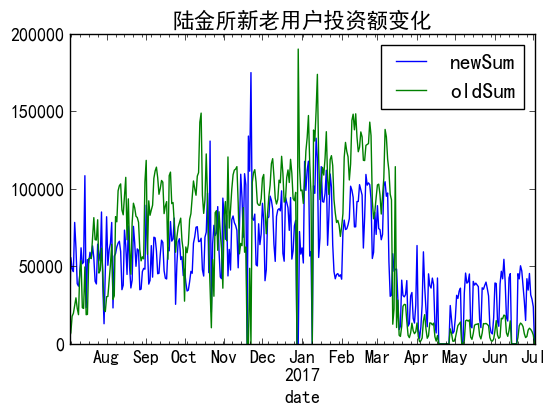

In [232]:
newSumVsOldSum[newSumVsOldSum['wdzjPlatId']==59][['newSum','oldSum']].plot(title='陆金所新老用户投资额变化')

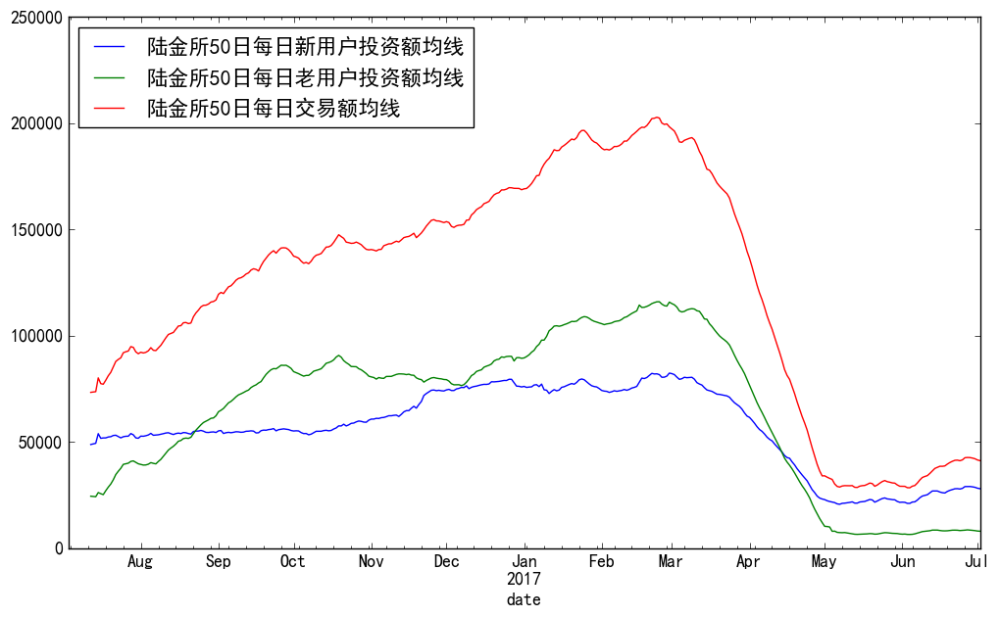

In [233]:
newSumVsOldSum[newSumVsOldSum['wdzjPlatId']==59]['newSum'].rolling(window=50,min_periods=10).mean().plot(label='陆金所50日每日新用户投资额均线')
newSumVsOldSum[newSumVsOldSum['wdzjPlatId']==59]['oldSum'].rolling(window=50,min_periods=10).mean().plot(label='陆金所50日每日老用户投资额均线')
platVolume[platVolume['wdzjPlatId']==59]['amount'].rolling(window=50,min_periods=10).mean().plot(label='陆金所50日每日交易额均线',figsize=(12,7))
plt.legend(loc='best')

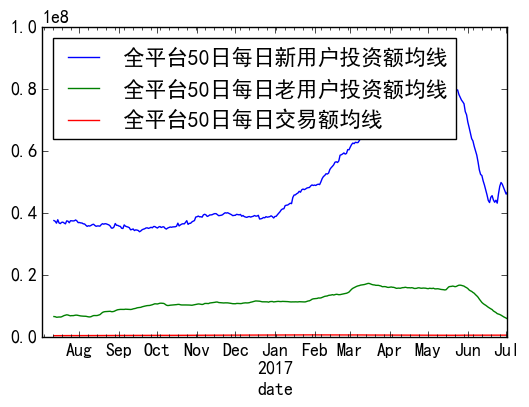

In [234]:
newSumVsOldSum.resample('D').sum()['newSum'].rolling(window=50,min_periods=10).mean().plot(label='全平台50日每日新用户投资额均线')
newSumVsOldSum.resample('D').sum()['oldSum'].rolling(window=50,min_periods=10).mean().plot(label='全平台50日每日老用户投资额均线')
platVolume.resample('D').sum()['amount'].rolling(window=50,min_periods=10).mean().plot(label='全平台50日每日交易额均线')
plt.legend(loc='best')

In [235]:
newSumVsOldSum.sort_values(by='newSum')

,id,date,newSum,oldSum,wdzjPlatId
date,,,,,
2017-07-02,186098,2017-07-02,0.000000e+00,0.00,985
2017-06-15,143330,2017-06-15,0.000000e+00,0.00,1757
2017-06-14,143329,2017-06-14,0.000000e+00,0.00,1757
2017-06-13,143328,2017-06-13,0.000000e+00,0.00,1757
2017-06-12,143327,2017-06-12,0.000000e+00,0.00,1757
2017-06-10,143325,2017-06-10,0.000000e+00,0.00,1757
2017-06-09,143324,2017-06-09,0.000000e+00,0.00,1757
2017-06-05,143320,2017-06-05,0.000000e+00,0.00,1757
2017-06-03,143318,2017-06-03,0.000000e+00,0.00,1757


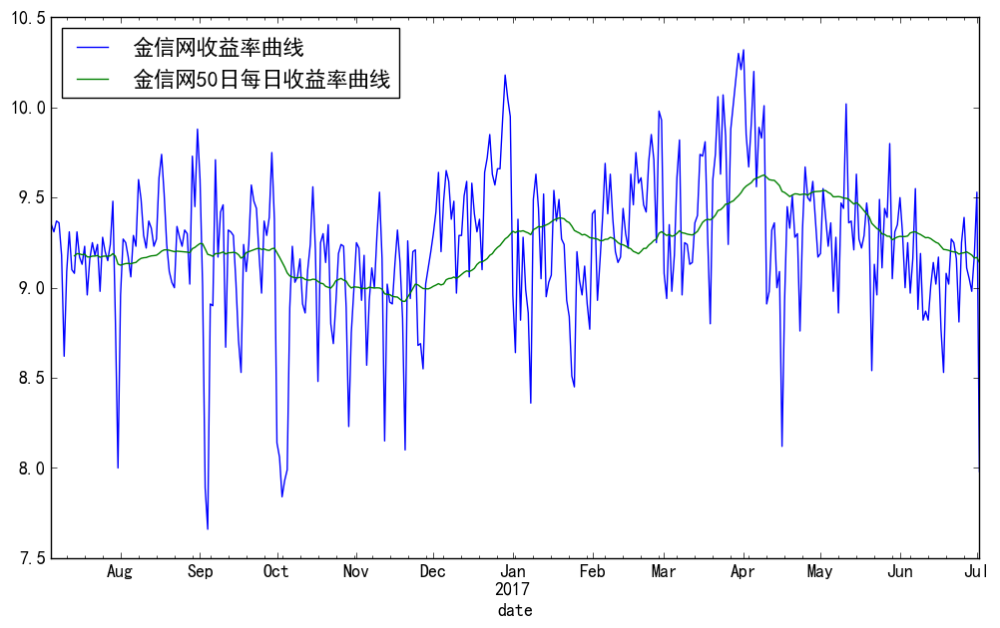

In [236]:
incomeRateData[incomeRateData['wdzjPlatId']==508]['incomeRate'].plot(label='金信网收益率曲线')
incomeRateData[incomeRateData['wdzjPlatId']==508]['incomeRate'].rolling(window=50,min_periods=10).mean().plot(label='金信网50日每日收益率曲线',figsize=(12,7))
plt.legend(loc='best')

In [237]:
meanPeriod=pd.read_csv('platPlatMeanPeriodVSAllMeanPeriod.csv',parse_dates=True)#平台平均投资期限

In [238]:
meanPeriod.index=meanPeriod['date']
meanPeriod.index=pd.to_datetime(meanPeriod.index)

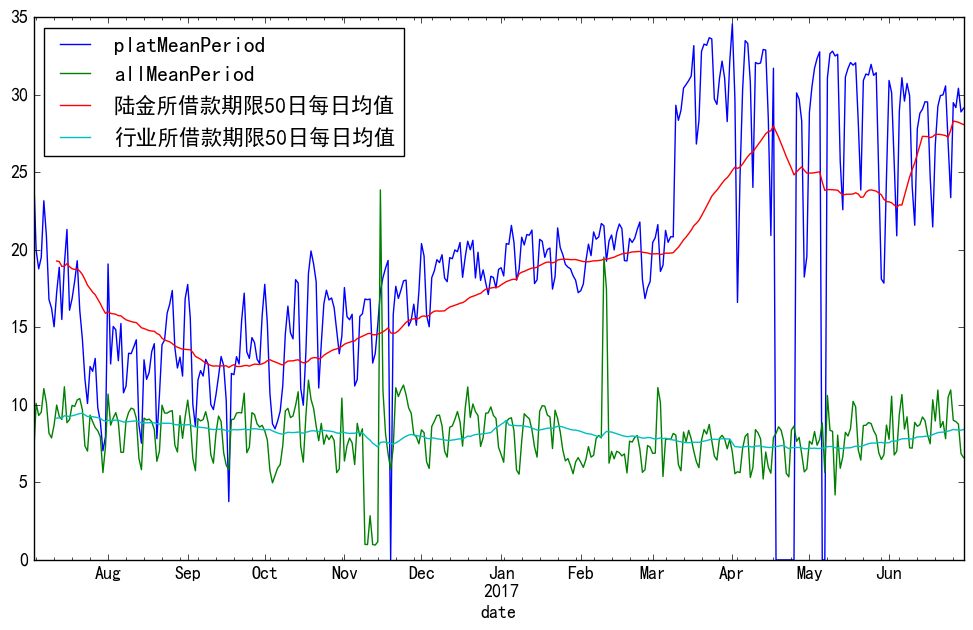

In [239]:
meanPeriod[meanPeriod['wdzjPlatId']==59][['platMeanPeriod','allMeanPeriod']].plot(figsize=(12,7))
meanPeriod[meanPeriod['wdzjPlatId']==59]['platMeanPeriod'].rolling(window=50,min_periods=10).mean().plot(label='陆金所借款期限50日每日均值')
meanPeriod[meanPeriod['wdzjPlatId']==59]['allMeanPeriod'].rolling(window=50,min_periods=10).mean().plot(label='行业所借款期限50日每日均值')
plt.legend(loc='best')

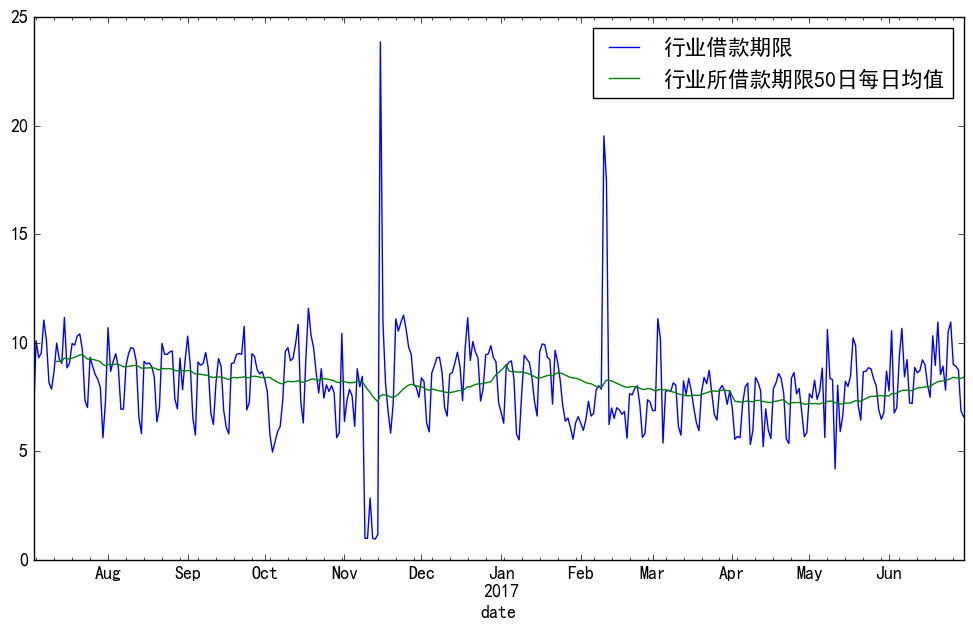

In [240]:
meanPeriod[meanPeriod['wdzjPlatId']==59]['allMeanPeriod'].plot(figsize=(12,7),label='行业借款期限')
meanPeriod[meanPeriod['wdzjPlatId']==59]['allMeanPeriod'].rolling(window=50,min_periods=10).mean().plot(label='行业所借款期限50日每日均值')
plt.legend(loc='best')

In [241]:
meanPeriod=meanPeriod[meanPeriod['platMeanPeriod']!=0.00]  #删除period等于0的日期 默认这些日期这些平台没有发标记录

In [242]:
platMeanPeriod=meanPeriod.groupby('wdzjPlatId').mean()

In [243]:
platMeanPeriod['wdzjPlatId']=platMeanPeriod.index.to_series()

In [244]:
platDataDetail=pd.merge(platDataDetail,platMeanPeriod[['platMeanPeriod','wdzjPlatId']],left_on='platId',right_on='wdzjPlatId')

In [245]:
del platDataDetail['wdzjPlatId']
del platDataDetail['wdzjPlatId_y']

In [246]:
del platDataDetail['wdzjPlatId_x']

In [247]:
platDataDetail

,id_x,actualCapital,aliasName,association,associationDetail,autoBid,autoBidCode,bankCapital,bankFunds,bidSecurity,...,incomeRateStd,invNum,borNum,invMean,borMean,borMean/invMean,id,newNum,oldNum,platMeanPeriod
0,2144,8000.0,陆金所,1,2014年03月01日加入广西互联网金融协会任职务<br/>2016年03月25日加入中国互...,不支持,0.0,平安银行,1.0,-,...,1.759611,20451.608219,31520.586301,5.398575,4.822000,0.893199,183.000000,12536.715068,7592.301370,20.138267
1,2145,5000.0,红岭创投,1,2014年03月01日加入互联网金融专业委员会任会员职务<br/>2016年03月25日加入...,支持,1.0,NaN,0.0,VIP100%本金保障，非VIP享受50%本金垫付,...,1.752757,13491.284932,2282.613699,2.098767,12.569918,5.989191,548.000000,8785.632877,4483.915068,1.733278
2,2146,3938.0,小赢理财,0,NaN,支持,1.0,上海华瑞银行,1.0,众安保险承保,...,1.023643,5474.339726,7224.030137,2.410137,6.279918,2.605627,913.000000,3053.687671,2235.386301,6.344711
3,2147,12195.0,微贷网,1,2015年09月13日加入杭州市互联网金融协会任执行会长职务,支持,1.0,厦门银行,1.0,当天偿付,...,1.347329,10441.221918,2820.405479,1.961507,7.145644,3.642936,1278.000000,8155.306849,2179.876712,2.838430
4,2148,3730.0,鑫合汇,1,2015年05月17日加入杭州市互联网金融协会任执行会长职务<br/>2016年08月19日...,支持,1.0,浙商银行,1.0,由第三方机构为鑫合汇融资项目提供担保服务,...,0.889101,5909.271233,99.030137,3.009699,501.374658,166.586333,1643.000000,4213.304110,1423.810959,1.009669
5,2149,20000.0,爱钱进,0,NaN,支持,1.0,华夏银行,1.0,风险准备金,...,4.692234,62095.852055,77476.553425,0.185178,0.145534,0.785915,2002.000000,26679.547945,33312.764384,31.134831
6,2150,3793.0,团贷网,1,2014年03月07日加入东莞市互联网金融协会任会长单位职务<br/>2013年12月01日...,支持,1.0,厦门银行,1.0,VIP享有担保公司垫付本息，普通会员享有担保公司垫付本金,...,1.109198,18556.032877,1101.994521,0.707014,11.996219,16.967449,2365.002740,8172.235616,9660.021918,4.808421
7,2151,5000.0,51人品,1,2016年09月13日加入杭州市互联网金融协会任副会长职务,支持,1.0,NaN,NaN,风险准备金,...,0.136131,33098.383562,15222.578082,0.181836,0.426740,2.346843,2736.000000,18996.712329,13930.947945,10.111413
8,2152,6000.0,宜贷网,0,NaN,支持,1.0,恒丰银行,1.0,100％抵押标,...,1.619496,3538.578082,972.706849,20.891260,8.692658,0.416091,3092.005479,1227.736986,2275.498630,4.096022
9,2153,3000.0,宜人贷,0,NaN,不支持,0.0,广发银行,1.0,-,...,4.685667,37636.591781,1191.682192,0.232575,6.279397,26.999411,3455.008219,21983.939726,14696.449315,32.860452


In [248]:
InflowVSToPay=pd.read_csv('platInflowVSToPay.csv',parse_dates=True)#平台资金流入与待还余额以及待还余额三十日平均

In [249]:
InflowVSToPay.index=InflowVSToPay['date']
InflowVSToPay.index=pd.to_datetime(InflowVSToPay.index)

In [250]:
print('陆金所单日资金净流入最大为 ',InflowVSToPay[InflowVSToPay['wdzjPlatId']==59]['inflow'].max())
print('陆金所单日资金净流入最小为 ',InflowVSToPay[InflowVSToPay['wdzjPlatId']==59]['inflow'].min())
InflowVSToPay[InflowVSToPay['wdzjPlatId']==59]['inflow'].sort_values()

陆金所单日资金净流入最大为  1271745.62
陆金所单日资金净流入最小为  -3611094.39


date
2016-12-01   -3611094.39
2016-07-13    -693774.81
2016-08-01    -674555.89
2016-07-21    -602882.16
2017-06-19    -269897.09
2016-07-26     -99275.45
2016-12-29     -63347.53
2016-07-22     -60940.19
2016-09-17     -49155.15
2016-11-19     -39112.81
2016-12-28     -38140.98
2016-07-24     -36887.28
2016-07-23     -35856.48
2016-12-30     -33178.17
2016-07-25     -32759.86
2017-01-02     -32467.81
2017-01-01     -29106.20
2016-07-27     -28132.00
2017-04-20     -25466.29
2017-04-18     -23178.42
2017-05-06     -22509.57
2017-04-19     -22160.40
2017-04-24     -22033.94
2017-05-07     -21823.66
2017-04-23     -21708.74
2017-04-22     -21271.63
2017-04-21     -20647.75
2017-04-03     -20612.28
2017-06-03     -19692.90
2017-01-27     -18555.75
                 ...    
2016-11-29      73065.06
2016-09-21      76627.81
2016-10-11      77828.06
2017-01-10      78995.72
2016-11-02      80108.19
2016-11-26      80912.11
2016-11-28      81972.31
2016-10-21      84219.52
2016-09-01      8510

In [251]:
print('陆金所资金流入天数',InflowVSToPay[(InflowVSToPay['wdzjPlatId']==59)&(InflowVSToPay['inflow']>0)].count()['id'])
print('陆金所资金流出天数',InflowVSToPay[(InflowVSToPay['wdzjPlatId']==59)&(InflowVSToPay['inflow']<0)].count()['id'])

陆金所资金流入天数 279
陆金所资金流出天数 86


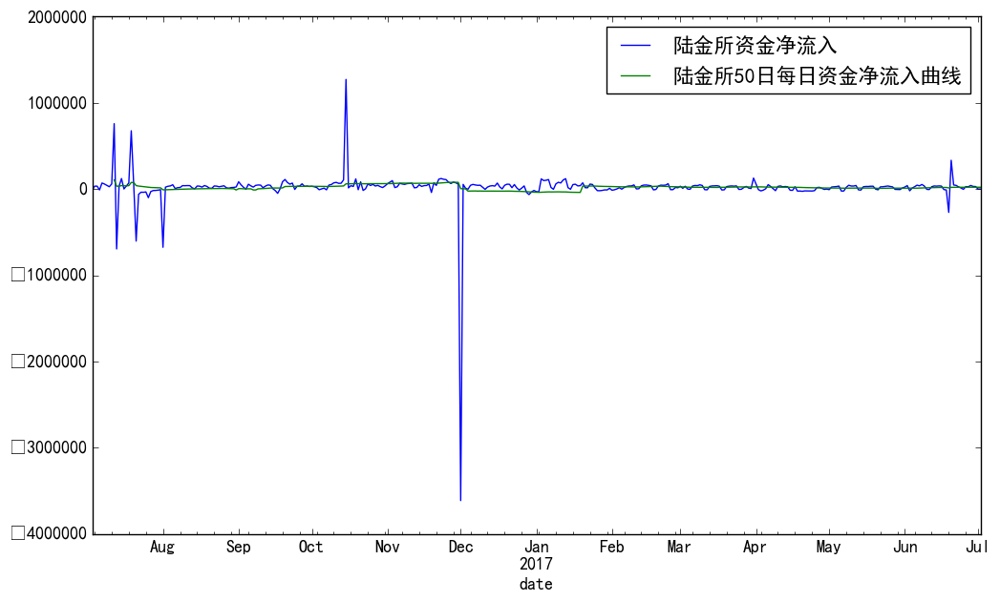

In [252]:
InflowVSToPay[InflowVSToPay['wdzjPlatId']==59]['inflow'].plot(figsize=(12,7),label='陆金所资金净流入')
InflowVSToPay[InflowVSToPay['wdzjPlatId']==59]['inflow'].rolling(window=50,min_periods=10).mean().plot(label='陆金所50日每日资金净流入曲线')
plt.legend(loc='best')

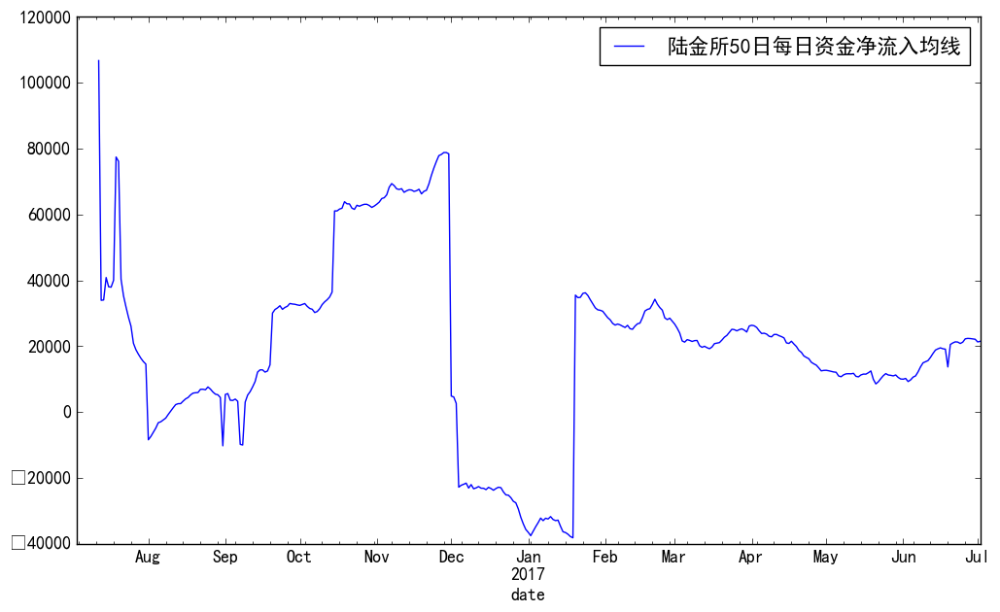

In [253]:
InflowVSToPay[InflowVSToPay['wdzjPlatId']==59]['inflow'].rolling(window=50,min_periods=10).mean().plot(label='陆金所50日每日资金净流入均线',figsize=(12,7))
plt.legend(loc='best')

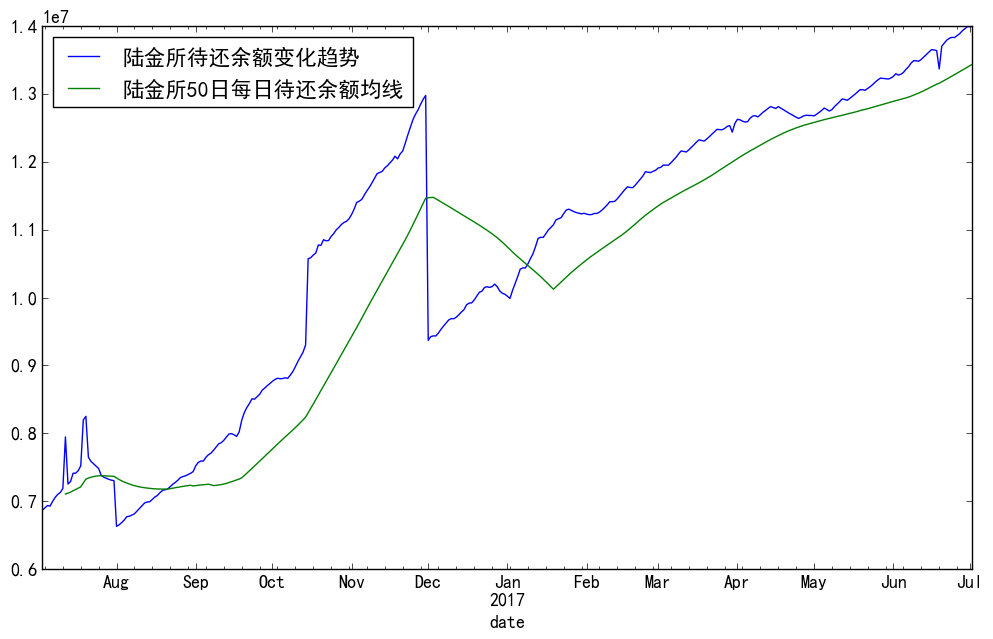

In [254]:
InflowVSToPay[InflowVSToPay['wdzjPlatId']==59]['toPay'].plot(label='陆金所待还余额变化趋势',figsize=(12,7))
InflowVSToPay[InflowVSToPay['wdzjPlatId']==59]['toPay'].rolling(window=50,min_periods=10).mean().plot(label='陆金所50日每日待还余额均线')
plt.legend(loc='best')

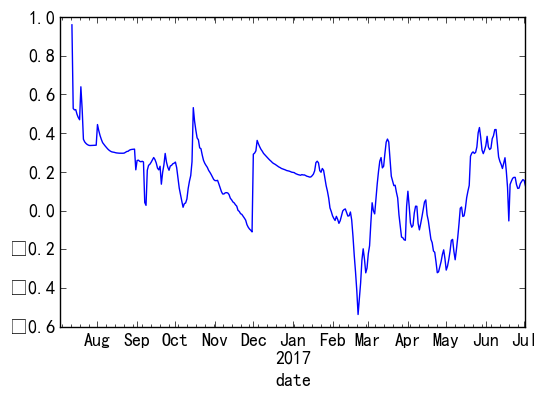

In [255]:
InflowVSToPay[InflowVSToPay['wdzjPlatId']==59]['toPay'].rolling(window=50,min_periods=10).corr(InflowVSToPay[InflowVSToPay['wdzjPlatId']==59]['inflow']).plot()

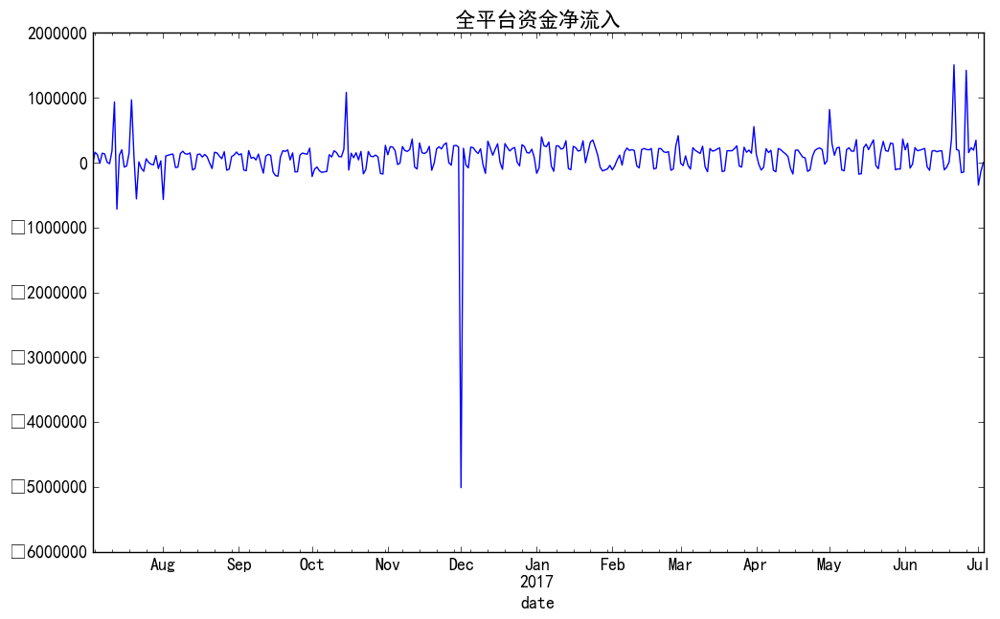

In [256]:
InflowVSToPay.resample('D').sum()['inflow'].plot(figsize=(12,7),title='全平台资金净流入')

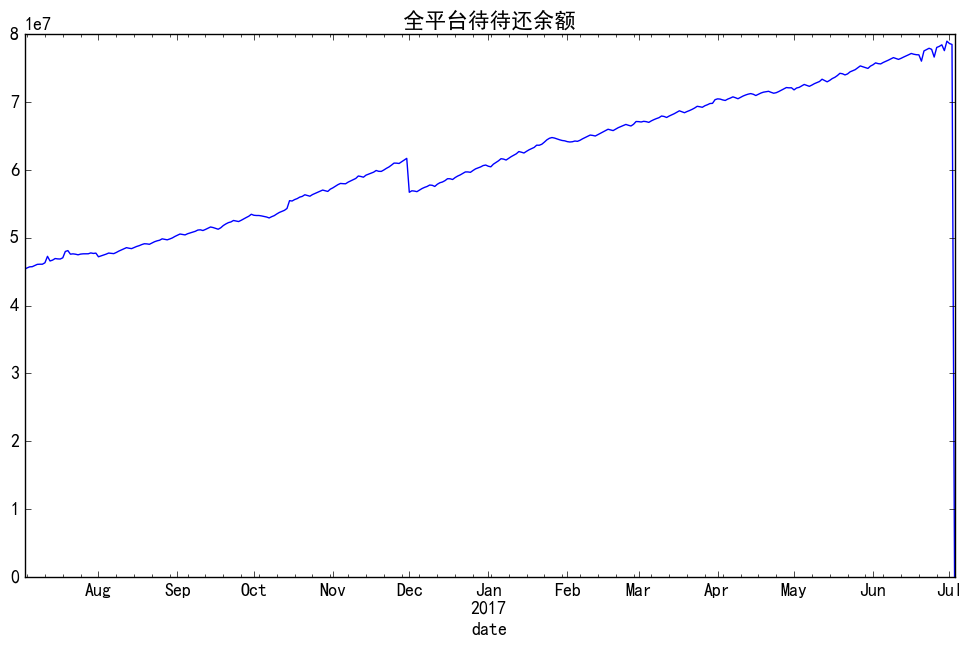

In [257]:
InflowVSToPay.resample('D').sum()['toPay'].plot(figsize=(12,7),title='全平台待待还余额')

In [258]:
platInflowVSToPay=InflowVSToPay.groupby('wdzjPlatId').mean()[['inflow','toPay']]

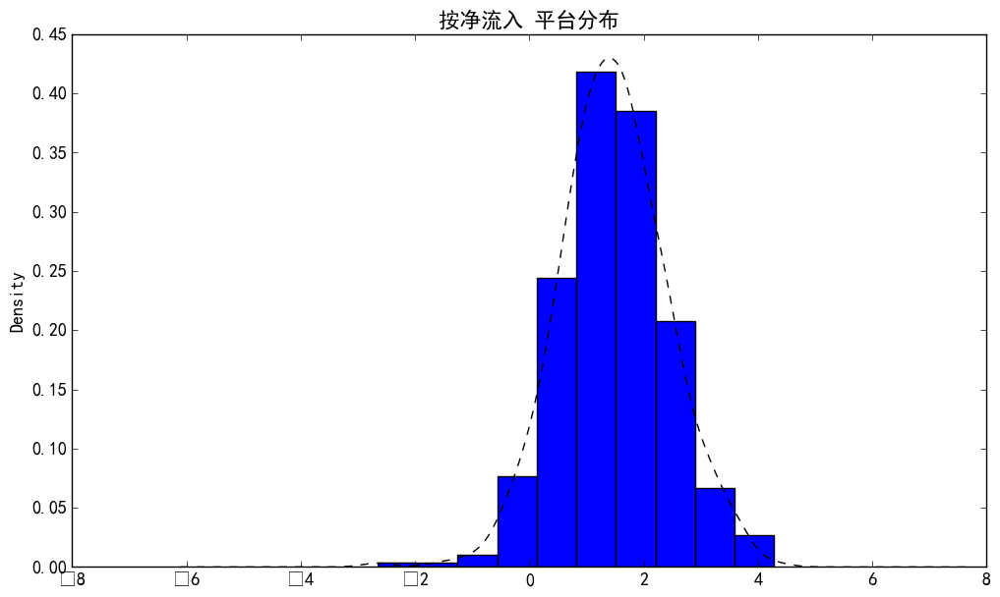

In [259]:
np.log10(platInflowVSToPay['inflow']).hist(figsize=(12,7),normed=True)
np.log10(platInflowVSToPay['inflow']).plot(kind='kde',style='k--',title='按净流入 平台分布')

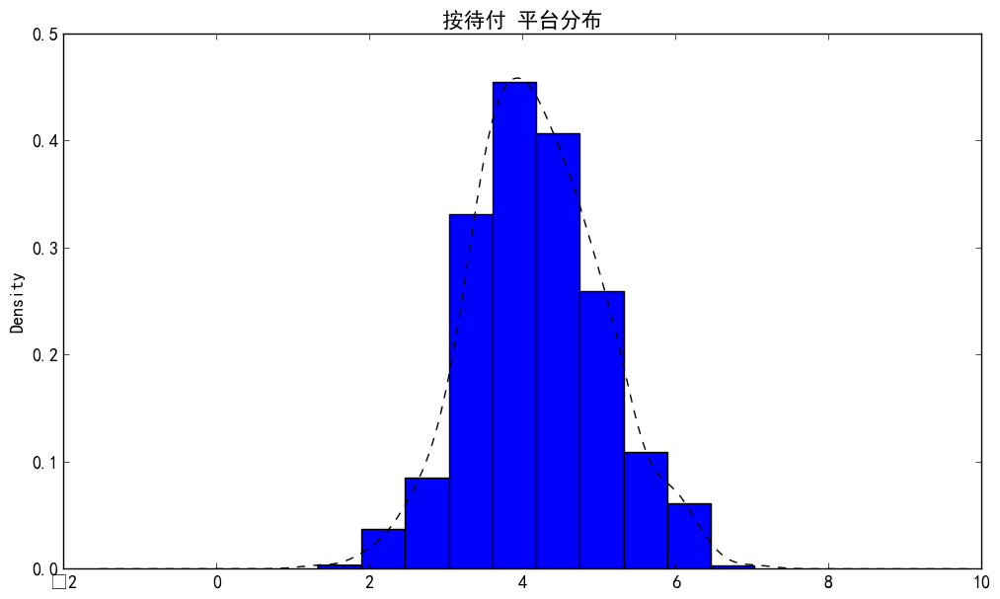

In [260]:
np.log10(platInflowVSToPay['toPay']).hist(figsize=(12,7),normed=True)
np.log10(platInflowVSToPay['toPay']).plot(kind='kde',style='k--',title='按待付 平台分布')

In [261]:
platInflowVSToPay['wdzjPlatId']=platInflowVSToPay.index.to_series()

In [262]:
platDataDetail=pd.merge(platDataDetail,platInflowVSToPay,left_on='platId',right_on='wdzjPlatId')

In [263]:
platDataDetail

,id_x,actualCapital,aliasName,association,associationDetail,autoBid,autoBidCode,bankCapital,bankFunds,bidSecurity,...,invMean,borMean,borMean/invMean,id,newNum,oldNum,platMeanPeriod,inflow,toPay,wdzjPlatId
0,2144,8000.0,陆金所,1,2014年03月01日加入广西互联网金融协会任职务<br/>2016年03月25日加入中国互...,不支持,0.0,平安银行,1.0,-,...,5.398575,4.822000,0.893199,183.000000,12536.715068,7592.301370,20.138267,19312.729507,1.070899e+07,59
1,2145,5000.0,红岭创投,1,2014年03月01日加入互联网金融专业委员会任会员职务<br/>2016年03月25日加入...,支持,1.0,NaN,0.0,VIP100%本金保障，非VIP享受50%本金垫付,...,2.098767,12.569918,5.989191,548.000000,8785.632877,4483.915068,1.733278,1068.127644,1.557506e+06,60
2,2146,3938.0,小赢理财,0,NaN,支持,1.0,上海华瑞银行,1.0,众安保险承保,...,2.410137,6.279918,2.605627,913.000000,3053.687671,2235.386301,6.344711,956.302082,1.785089e+06,1309
3,2147,12195.0,微贷网,1,2015年09月13日加入杭州市互联网金融协会任执行会长职务,支持,1.0,厦门银行,1.0,当天偿付,...,1.961507,7.145644,3.642936,1278.000000,8155.306849,2179.876712,2.838430,3359.709068,1.160481e+06,38
4,2148,3730.0,鑫合汇,1,2015年05月17日加入杭州市互联网金融协会任执行会长职务<br/>2016年08月19日...,支持,1.0,浙商银行,1.0,由第三方机构为鑫合汇融资项目提供担保服务,...,3.009699,501.374658,166.586333,1643.000000,4213.304110,1423.810959,1.009669,360.590000,3.574442e+05,505
5,2149,20000.0,爱钱进,0,NaN,支持,1.0,华夏银行,1.0,风险准备金,...,0.185178,0.145534,0.785915,2002.000000,26679.547945,33312.764384,31.134831,3994.384712,1.323513e+06,689
6,2150,3793.0,团贷网,1,2014年03月07日加入东莞市互联网金融协会任会长单位职务<br/>2013年12月01日...,支持,1.0,厦门银行,1.0,VIP享有担保公司垫付本息，普通会员享有担保公司垫付本金,...,0.707014,11.996219,16.967449,2365.002740,8172.235616,9660.021918,4.808421,1599.291918,1.161059e+06,91
7,2151,5000.0,51人品,1,2016年09月13日加入杭州市互联网金融协会任副会长职务,支持,1.0,NaN,NaN,风险准备金,...,0.181836,0.426740,2.346843,2736.000000,18996.712329,13930.947945,10.111413,2407.043836,7.134784e+05,4891
8,2152,6000.0,宜贷网,0,NaN,支持,1.0,恒丰银行,1.0,100％抵押标,...,20.891260,8.692658,0.416091,3092.005479,1227.736986,2275.498630,4.096022,791.929808,2.711832e+05,942
9,2153,3000.0,宜人贷,0,NaN,不支持,0.0,广发银行,1.0,-,...,0.232575,6.279397,26.999411,3455.008219,21983.939726,14696.449315,32.860452,5131.478740,2.584090e+06,85


In [264]:
del platDataDetail['wdzjPlatId']

In [265]:
loanNumVSLoanPeriod=pd.read_csv('platLoanNumVSLoanPeriod.csv',parse_dates=True)#平台借款标数和平均借款期限

In [266]:
loanNumVSLoanPeriod.index=loanNumVSLoanPeriod['date']
loanNumVSLoanPeriod.index=pd.to_datetime(loanNumVSLoanPeriod.index)

In [267]:
platLoanNumVSLoanPeriod=loanNumVSLoanPeriod.groupby('wdzjPlatId').mean()[['loanNum','loanPeriod']]

In [268]:
platLoanNumVSLoanPeriod['wdzjPlatId']=platLoanNumVSLoanPeriod.index.to_series()

In [269]:
platDataDetail=pd.merge(platDataDetail,platLoanNumVSLoanPeriod,left_on='platId',right_on='wdzjPlatId')

In [270]:
del platDataDetail['wdzjPlatId']

In [271]:
toPayNumVSToReceiveNum=pd.read_csv('platToPayNumVSToReceiveNum.csv',parse_dates=True)#平台待还借款人数和代收投资人数

In [272]:
toPayNumVSToReceiveNum.index=toPayNumVSToReceiveNum['date']
toPayNumVSToReceiveNum.index=pd.to_datetime(toPayNumVSToReceiveNum.index)

In [273]:
print('陆金所最大单日待还借款人数:',toPayNumVSToReceiveNum[toPayNumVSToReceiveNum['wdzjPlatId']==59]['toPayNum'].max())
print('陆金所最小单日待还借款人数：',toPayNumVSToReceiveNum[toPayNumVSToReceiveNum['wdzjPlatId']==59]['toPayNum'].min())
print('陆金所最大单日代收借款人数:',toPayNumVSToReceiveNum[toPayNumVSToReceiveNum['wdzjPlatId']==59]['toReceiveNum'].max())
print('陆金所最小单日代收借款人数:',toPayNumVSToReceiveNum[toPayNumVSToReceiveNum['wdzjPlatId']==59]['toReceiveNum'].min())

陆金所最大单日待还借款人数: 3051448.0
陆金所最小单日待还借款人数： 1083411.0
陆金所最大单日代收借款人数: 657391.0
陆金所最小单日代收借款人数: 149230.0


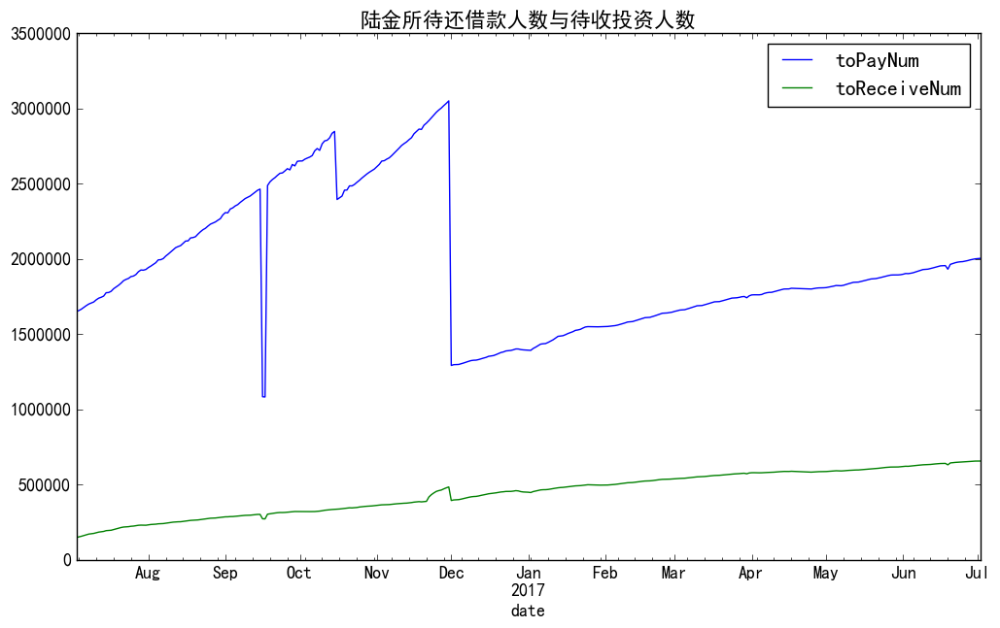

In [274]:
toPayNumVSToReceiveNum[toPayNumVSToReceiveNum['wdzjPlatId']==59][['toPayNum','toReceiveNum']].plot(figsize=(12,7),title='陆金所待还借款人数与待收投资人数')

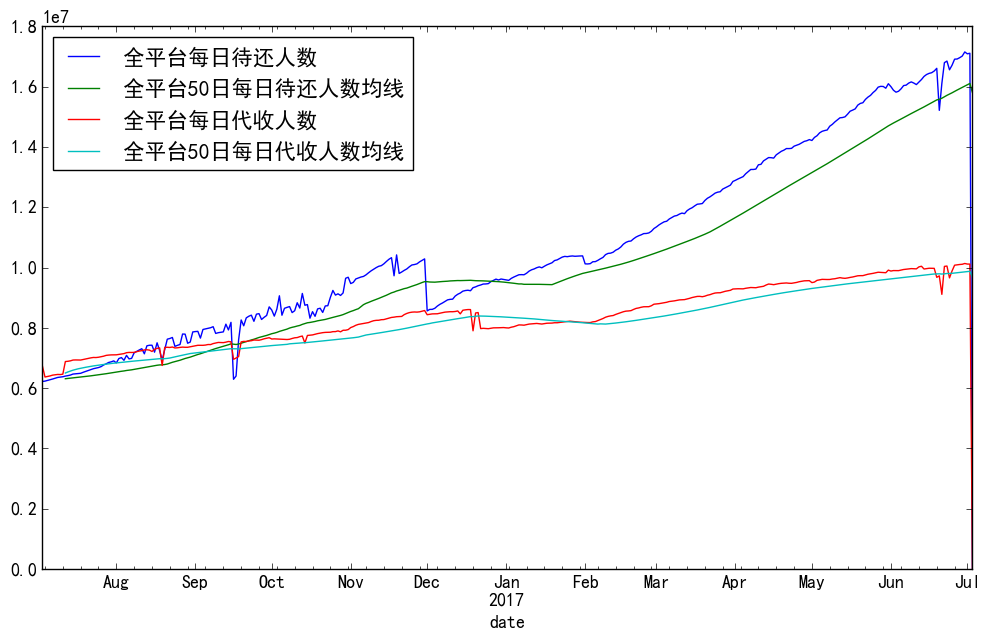

In [275]:
toPayNumVSToReceiveNum.resample('D').sum()['toPayNum'].plot(label='全平台每日待还人数',figsize=(12,7))
toPayNumVSToReceiveNum.resample('D').sum()['toPayNum'].rolling(window=50,min_periods=10).mean().plot(label='全平台50日每日待还人数均线')
toPayNumVSToReceiveNum.resample('D').sum()['toReceiveNum'].plot(label='全平台每日代收人数')
toPayNumVSToReceiveNum.resample('D').sum()['toReceiveNum'].rolling(window=50,min_periods=10).mean().plot(label='全平台50日每日代收人数均线')
plt.legend(loc='best')

In [276]:
platToPayNumVsToReceiveNum=toPayNumVSToReceiveNum.groupby('wdzjPlatId').mean()[['toPayNum','toReceiveNum']]

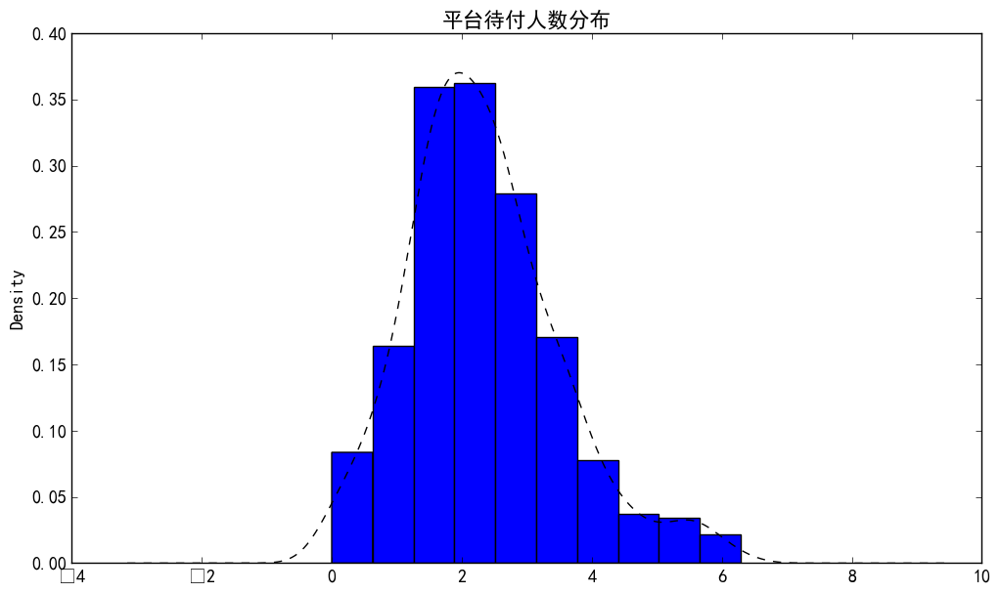

In [277]:
np.log10(platToPayNumVsToReceiveNum['toPayNum']).hist(figsize=(12,7),normed=True)
np.log10(platToPayNumVsToReceiveNum['toPayNum']).plot(kind='kde',style='k--',title='平台待付人数分布')

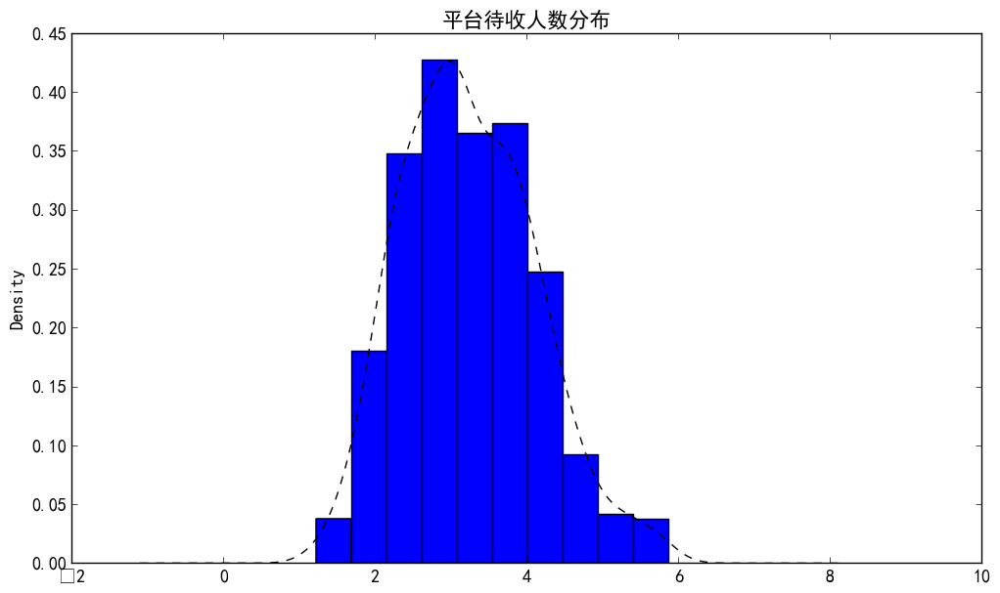

In [278]:
np.log10(platToPayNumVsToReceiveNum['toReceiveNum']).hist(figsize=(12,7),normed=True)
np.log10(platToPayNumVsToReceiveNum['toReceiveNum']).plot(kind='kde',style='k--',title='平台待收人数分布')

In [279]:
platToPayNumVsToReceiveNum['wdzjPlatId']=platToPayNumVsToReceiveNum.index.to_series()

In [280]:
platDataDetail=pd.merge(platDataDetail,platToPayNumVsToReceiveNum,left_on='platId',right_on='wdzjPlatId')

In [281]:
del platDataDetail['wdzjPlatId']

In [282]:
toPay10VSToReceive10=pd.read_csv('platToPay10VSToReceive10.csv',parse_dates=True)#平台前十借款人待还金额占比与平台前十投资人待收金额占比

In [283]:
toPay10VSToReceive10.index=toPay10VSToReceive10['date']
toPay10VSToReceive10.index=pd.to_datetime(toPay10VSToReceive10.index)

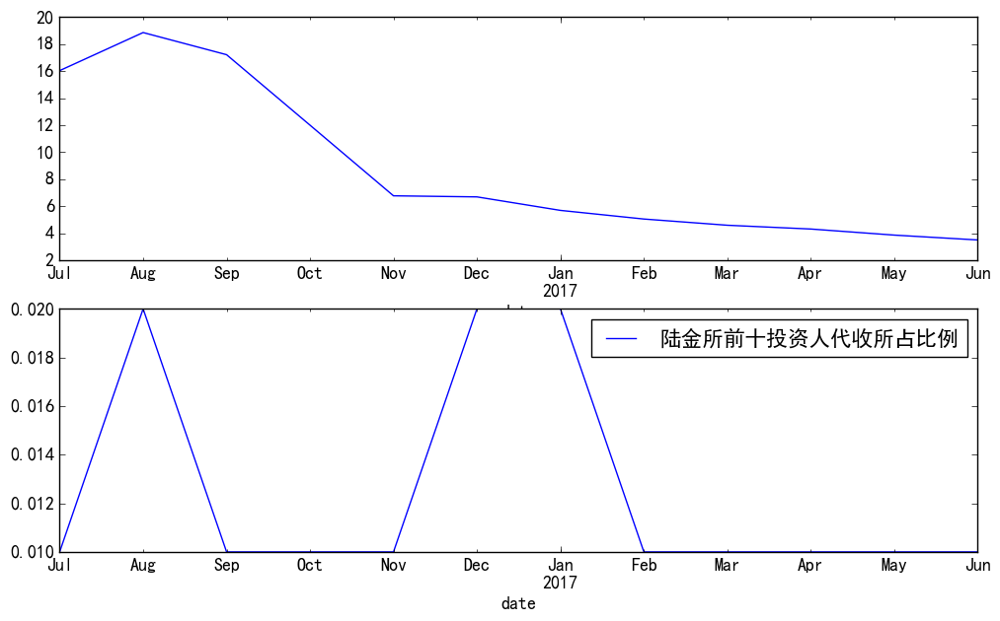

In [284]:
fig,axes=plt.subplots(nrows=2,ncols=1,figsize=(12,7))
toPay10VSToReceive10[toPay10VSToReceive10['wdzjPlatId']==59]['toPay10'].plot(ax=axes[0],label='陆金所前十借款人待还所占比例')
toPay10VSToReceive10[toPay10VSToReceive10['wdzjPlatId']==59]['toReceive10'].plot(ax=axes[1],label='陆金所前十投资人代收所占比例')
plt.legend(loc='best')

In [285]:
toPay10VSToReceive10[toPay10VSToReceive10['toPay10']<0]

,id,date,toPay10,toReceive10,wdzjPlatId
date,,,,,
2016-07-31,865,2016-07-31,-100.0,-100.0,3797
2016-08-31,866,2016-08-31,-100.0,-100.0,3797
2016-09-30,867,2016-09-30,-100.0,-100.0,3797
2016-10-31,868,2016-10-31,-100.0,-100.0,3797
2016-11-30,869,2016-11-30,-100.0,-100.0,3797
2016-12-31,870,2016-12-31,-100.0,-100.0,3797
2017-01-31,871,2017-01-31,-100.0,-100.0,3797
2017-02-28,872,2017-02-28,-100.0,-100.0,3797
2017-03-31,873,2017-03-31,-100.0,-100.0,3797


In [286]:
toPay10VSToReceive10[toPay10VSToReceive10['toReceive10']<0]

,id,date,toPay10,toReceive10,wdzjPlatId
date,,,,,
2016-07-31,865,2016-07-31,-100.0,-100.0,3797
2016-08-31,866,2016-08-31,-100.0,-100.0,3797
2016-09-30,867,2016-09-30,-100.0,-100.0,3797
2016-10-31,868,2016-10-31,-100.0,-100.0,3797
2016-11-30,869,2016-11-30,-100.0,-100.0,3797
2016-12-31,870,2016-12-31,-100.0,-100.0,3797
2017-01-31,871,2017-01-31,-100.0,-100.0,3797
2017-02-28,872,2017-02-28,-100.0,-100.0,3797
2017-03-31,873,2017-03-31,-100.0,-100.0,3797


In [287]:
platToPay10VSToReceive10=toPay10VSToReceive10[toPay10VSToReceive10['date']=='2017-05-31']#取五月的数据作为平台数据参考

In [288]:
platToPay10VSToReceive10=platToPay10VSToReceive10[['toPay10','toReceive10','wdzjPlatId']]

In [289]:
platDataDetail=pd.merge(platDataDetail,platToPay10VSToReceive10,left_on='platId',right_on='wdzjPlatId')

In [290]:
platDataDetail

,id_x,actualCapital,aliasName,association,associationDetail,autoBid,autoBidCode,bankCapital,bankFunds,bidSecurity,...,platMeanPeriod,inflow,toPay,loanNum,loanPeriod,toPayNum,toReceiveNum,toPay10,toReceive10,wdzjPlatId
0,2144,8000.0,陆金所,1,2014年03月01日加入广西互联网金融协会任职务<br/>2016年03月25日加入中国互...,不支持,0.0,平安银行,1.0,-,...,20.138267,19312.729507,1.070899e+07,32246.117808,19.566877,1.956933e+06,444608.161644,3.86,0.01,59
1,2145,5000.0,红岭创投,1,2014年03月01日加入互联网金融专业委员会任会员职务<br/>2016年03月25日加入...,支持,1.0,NaN,0.0,VIP100%本金保障，非VIP享受50%本金垫付,...,1.733278,1068.127644,1.557506e+06,9188.835616,1.728466,2.643148e+04,141577.778082,1.47,13.59,60
2,2146,3938.0,小赢理财,0,NaN,支持,1.0,上海华瑞银行,1.0,众安保险承保,...,6.344711,956.302082,1.785089e+06,10707.600000,6.359589,3.123562e+05,55096.950685,41.77,8.65,1309
3,2147,12195.0,微贷网,1,2015年09月13日加入杭州市互联网金融协会任执行会长职务,支持,1.0,厦门银行,1.0,当天偿付,...,2.838430,3359.709068,1.160481e+06,2830.764384,2.834384,1.606080e+05,156491.641096,3.24,0.63,38
4,2148,3730.0,鑫合汇,1,2015年05月17日加入杭州市互联网金融协会任执行会长职务<br/>2016年08月19日...,支持,1.0,浙商银行,1.0,由第三方机构为鑫合汇融资项目提供担保服务,...,1.009669,360.590000,3.574442e+05,1865.293151,1.006767,2.478762e+03,46466.208219,4.69,58.58,505
5,2149,20000.0,爱钱进,0,NaN,支持,1.0,华夏银行,1.0,风险准备金,...,31.134831,3994.384712,1.323513e+06,152888.035616,30.356521,2.712699e+05,552702.208219,4.60,0.02,689
6,2150,3793.0,团贷网,1,2014年03月07日加入东莞市互联网金融协会任会长单位职务<br/>2013年12月01日...,支持,1.0,厦门银行,1.0,VIP享有担保公司垫付本息，普通会员享有担保公司垫付本金,...,4.808421,1599.291918,1.161059e+06,2847.731507,4.770712,8.389007e+04,137739.764384,1.46,3.13,91
7,2151,5000.0,51人品,1,2016年09月13日加入杭州市互联网金融协会任副会长职务,支持,1.0,NaN,NaN,风险准备金,...,10.111413,2407.043836,7.134784e+05,15514.421918,10.036795,6.602358e+05,500990.879452,0.45,0.03,4891
8,2152,6000.0,宜贷网,0,NaN,支持,1.0,恒丰银行,1.0,100％抵押标,...,4.096022,791.929808,2.711832e+05,8558.153425,4.069342,1.220307e+04,17445.347945,5.89,1.85,942
9,2153,3000.0,宜人贷,0,NaN,不支持,0.0,广发银行,1.0,-,...,32.860452,5131.478740,2.584090e+06,1195.498630,27.908877,4.492867e+05,734765.830137,0.75,0.02,85


In [291]:
del platDataDetail['wdzjPlatId']

In [292]:
toPay50VSToReceive50=pd.read_csv('platToPay50VSToReceive50.csv',parse_dates=True)#平台前五十借款人待还金额占比与平台前五十投资人待收金额占比

In [293]:
toPay50VSToReceive50

,id,date,toPay50,toReceive50,wdzjPlatId
0,1,2016-07-31,33.18,0.05,59
1,2,2016-08-31,38.93,0.08,59
2,3,2016-09-30,35.57,0.07,59
3,4,2016-10-31,24.86,0.05,59
4,5,2016-11-30,14.45,0.04,59
5,6,2016-12-31,14.35,0.06,59
6,7,2017-01-31,12.27,0.05,59
7,8,2017-02-28,10.78,0.05,59
8,9,2017-03-31,9.95,0.04,59
9,10,2017-04-30,9.36,0.03,59


In [294]:
platToPay50VSToReceive50=toPay50VSToReceive50[toPay50VSToReceive50['date']=='2017-05-31']#取五月数据作为平台数据

In [295]:
platToPay10VSToReceive50=platToPay50VSToReceive50[['toPay50','toReceive50','wdzjPlatId']]

In [296]:
platDataDetail=pd.merge(platDataDetail,platToPay50VSToReceive50,left_on='platId',right_on='wdzjPlatId')

In [297]:
del platDataDetail['wdzjPlatId']

In [298]:
platDataDetail

,id_x,actualCapital,aliasName,association,associationDetail,autoBid,autoBidCode,bankCapital,bankFunds,bidSecurity,...,loanNum,loanPeriod,toPayNum,toReceiveNum,toPay10,toReceive10,id_y,date,toPay50,toReceive50
0,2144,8000.0,陆金所,1,2014年03月01日加入广西互联网金融协会任职务<br/>2016年03月25日加入中国互...,不支持,0.0,平安银行,1.0,-,...,32246.117808,19.566877,1.956933e+06,444608.161644,3.86,0.01,11,2017-05-31,8.42,0.03
1,2145,5000.0,红岭创投,1,2014年03月01日加入互联网金融专业委员会任会员职务<br/>2016年03月25日加入...,支持,1.0,NaN,0.0,VIP100%本金保障，非VIP享受50%本金垫付,...,9188.835616,1.728466,2.643148e+04,141577.778082,1.47,13.59,23,2017-05-31,5.44,38.12
2,2146,3938.0,小赢理财,0,NaN,支持,1.0,上海华瑞银行,1.0,众安保险承保,...,10707.600000,6.359589,3.123562e+05,55096.950685,41.77,8.65,35,2017-05-31,54.29,12.51
3,2147,12195.0,微贷网,1,2015年09月13日加入杭州市互联网金融协会任执行会长职务,支持,1.0,厦门银行,1.0,当天偿付,...,2830.764384,2.834384,1.606080e+05,156491.641096,3.24,0.63,47,2017-05-31,6.04,2.14
4,2148,3730.0,鑫合汇,1,2015年05月17日加入杭州市互联网金融协会任执行会长职务<br/>2016年08月19日...,支持,1.0,浙商银行,1.0,由第三方机构为鑫合汇融资项目提供担保服务,...,1865.293151,1.006767,2.478762e+03,46466.208219,4.69,58.58,59,2017-05-31,9.96,85.21
5,2149,20000.0,爱钱进,0,NaN,支持,1.0,华夏银行,1.0,风险准备金,...,152888.035616,30.356521,2.712699e+05,552702.208219,4.60,0.02,71,2017-05-31,6.37,0.07
6,2150,3793.0,团贷网,1,2014年03月07日加入东莞市互联网金融协会任会长单位职务<br/>2013年12月01日...,支持,1.0,厦门银行,1.0,VIP享有担保公司垫付本息，普通会员享有担保公司垫付本金,...,2847.731507,4.770712,8.389007e+04,137739.764384,1.46,3.13,83,2017-05-31,5.46,9.59
7,2151,5000.0,51人品,1,2016年09月13日加入杭州市互联网金融协会任副会长职务,支持,1.0,NaN,NaN,风险准备金,...,15514.421918,10.036795,6.602358e+05,500990.879452,0.45,0.03,95,2017-05-31,1.12,0.11
8,2152,6000.0,宜贷网,0,NaN,支持,1.0,恒丰银行,1.0,100％抵押标,...,8558.153425,4.069342,1.220307e+04,17445.347945,5.89,1.85,107,2017-05-31,11.84,7.30
9,2153,3000.0,宜人贷,0,NaN,不支持,0.0,广发银行,1.0,-,...,1195.498630,27.908877,4.492867e+05,734765.830137,0.75,0.02,119,2017-05-31,1.92,0.10


In [299]:
lujinIncome=incomeRateData[incomeRateData['wdzjPlatId']==59]

D:\Anaconda\lib\site-packages\ipykernel\__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
D:\Anaconda\lib\site-packages\ipykernel\__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


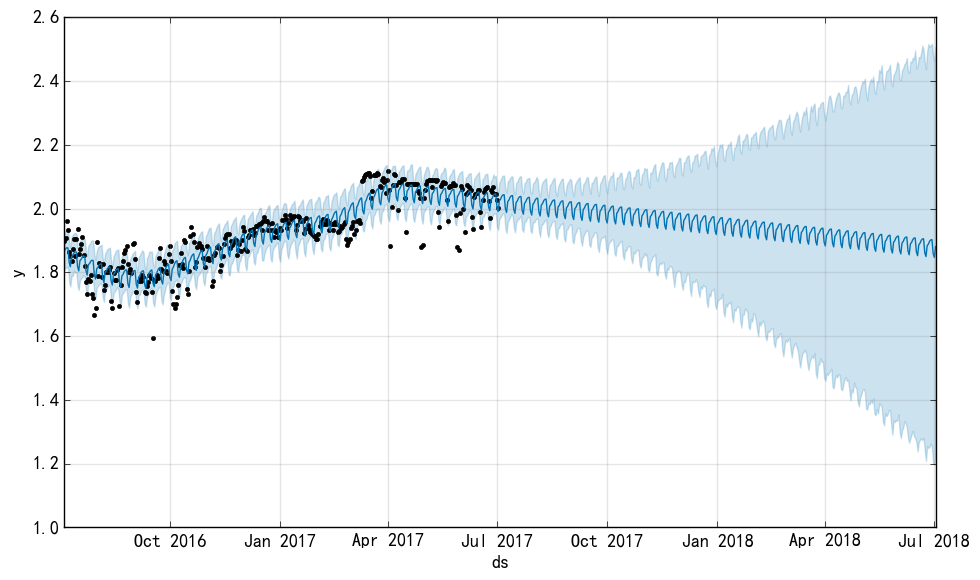

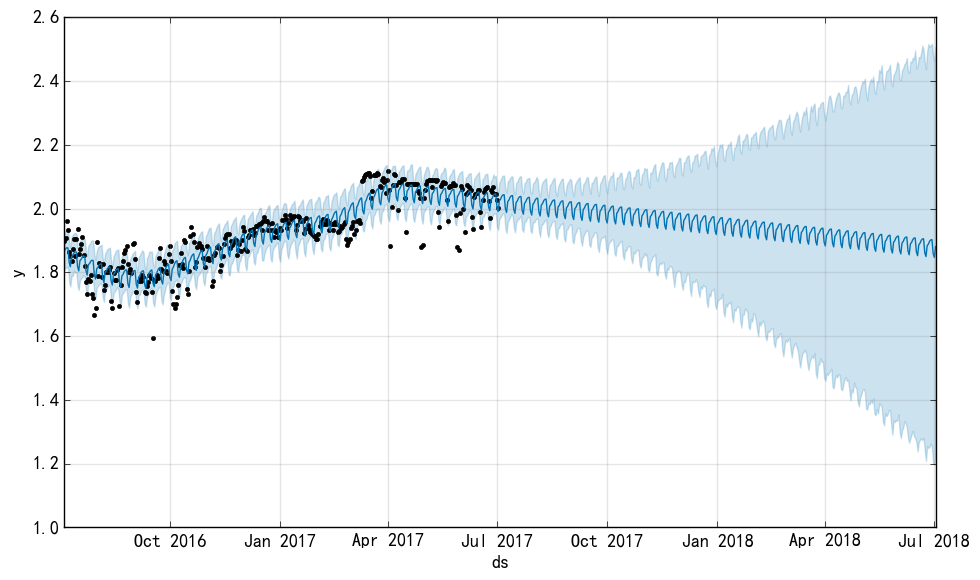

In [300]:
lujinIncome['y']=np.log(lujinIncome['incomeRate'])
lujinIncome['ds']=lujinIncome['date']
m=Prophet(weekly_seasonality=True)
m.fit(lujinIncome)
future=m.make_future_dataframe(periods=365)
forecast=m.predict(future)
m.plot(forecast)

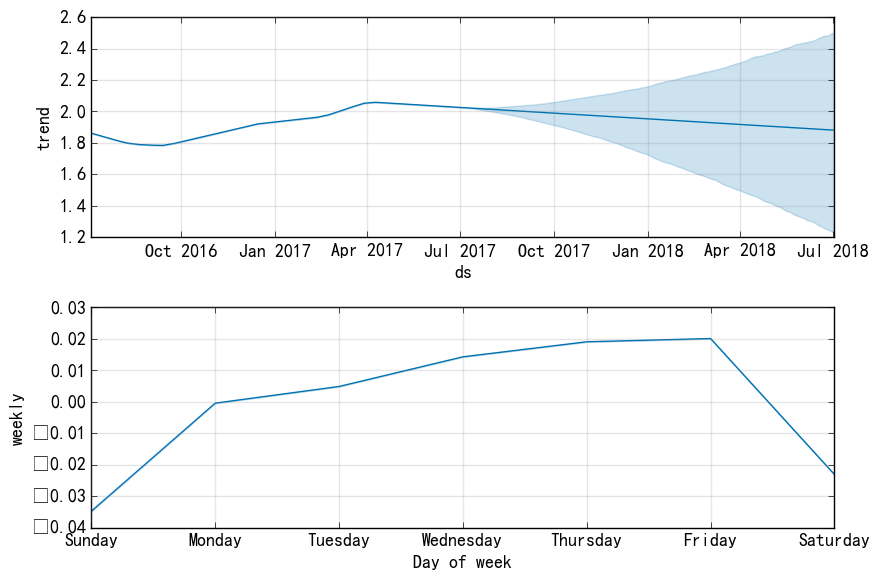

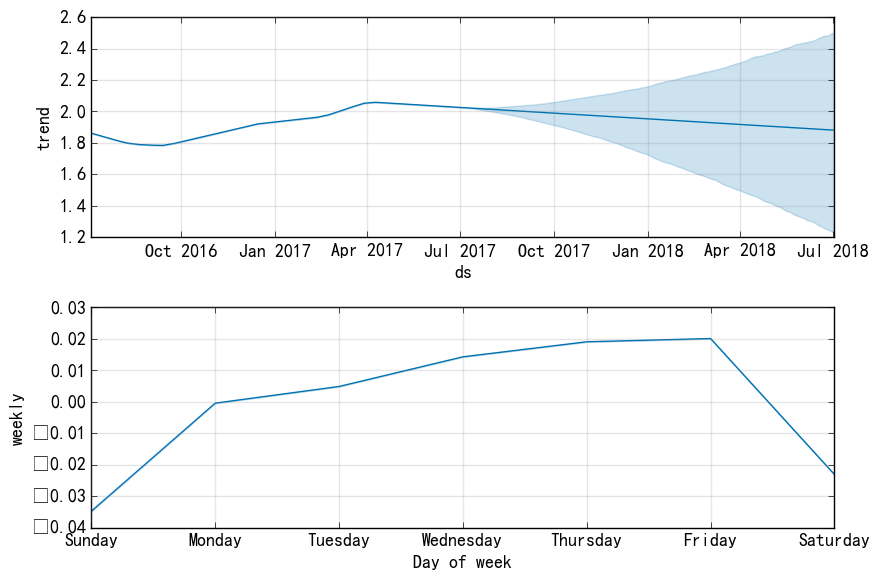

In [301]:
m.plot_components(forecast)

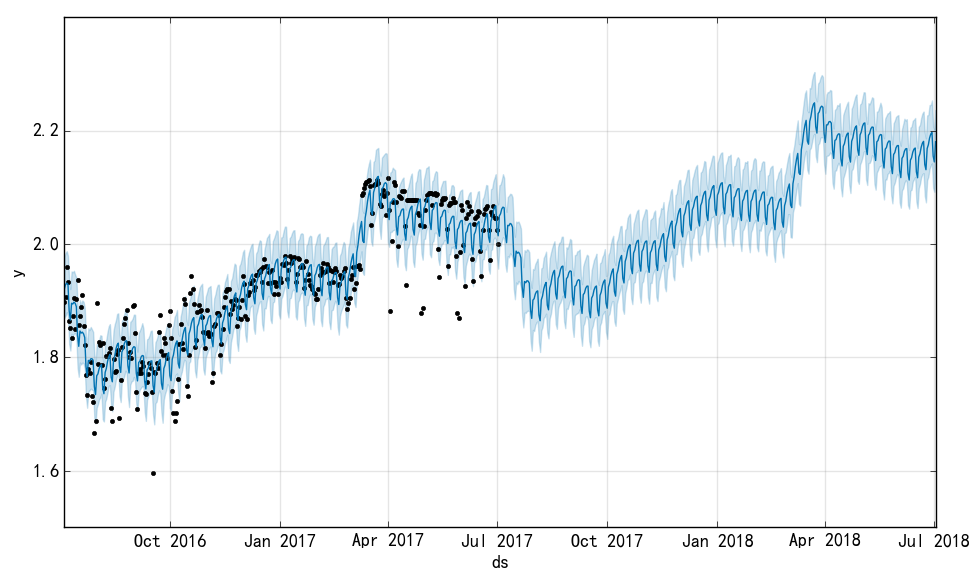

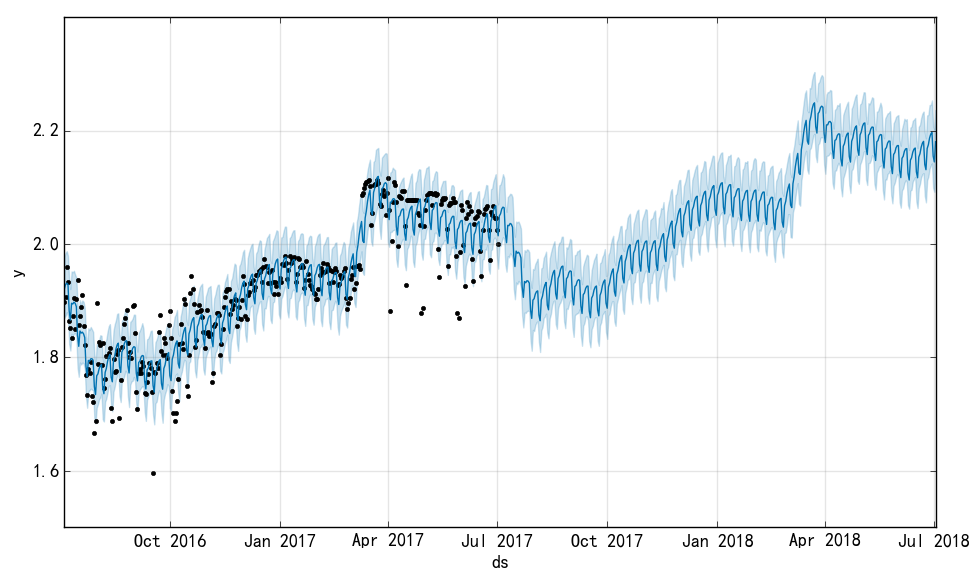

In [302]:
m=Prophet(yearly_seasonality=True)
m.fit(lujinIncome)
future=m.make_future_dataframe(periods=365)
forecast=m.predict(future)
m.plot(forecast)

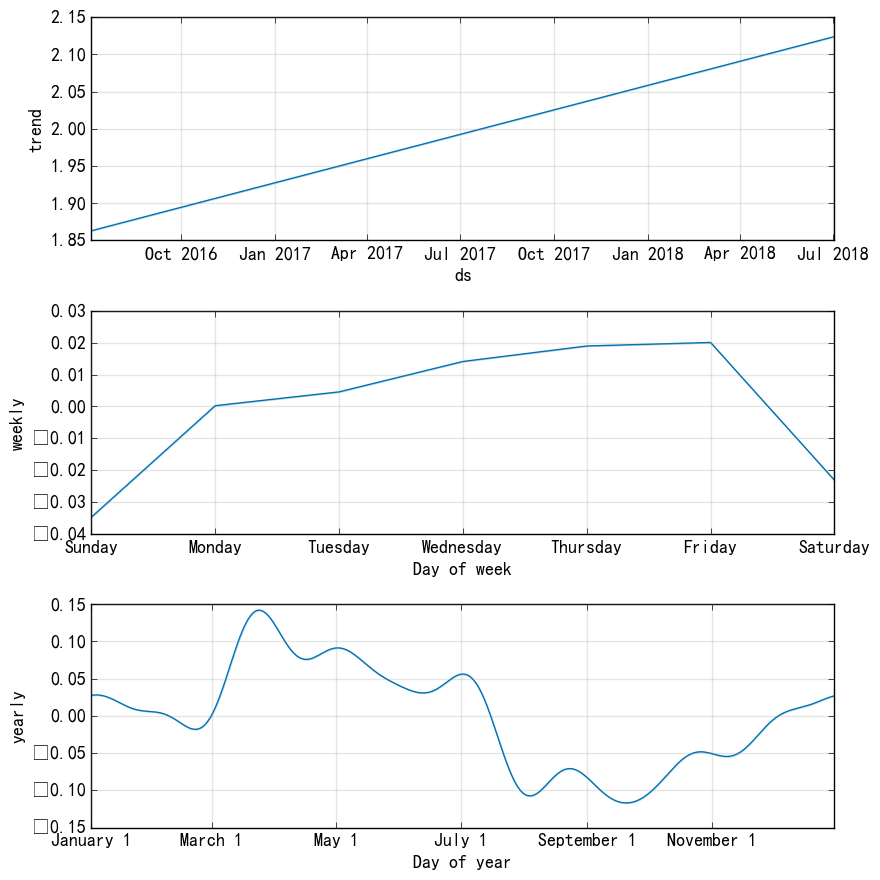

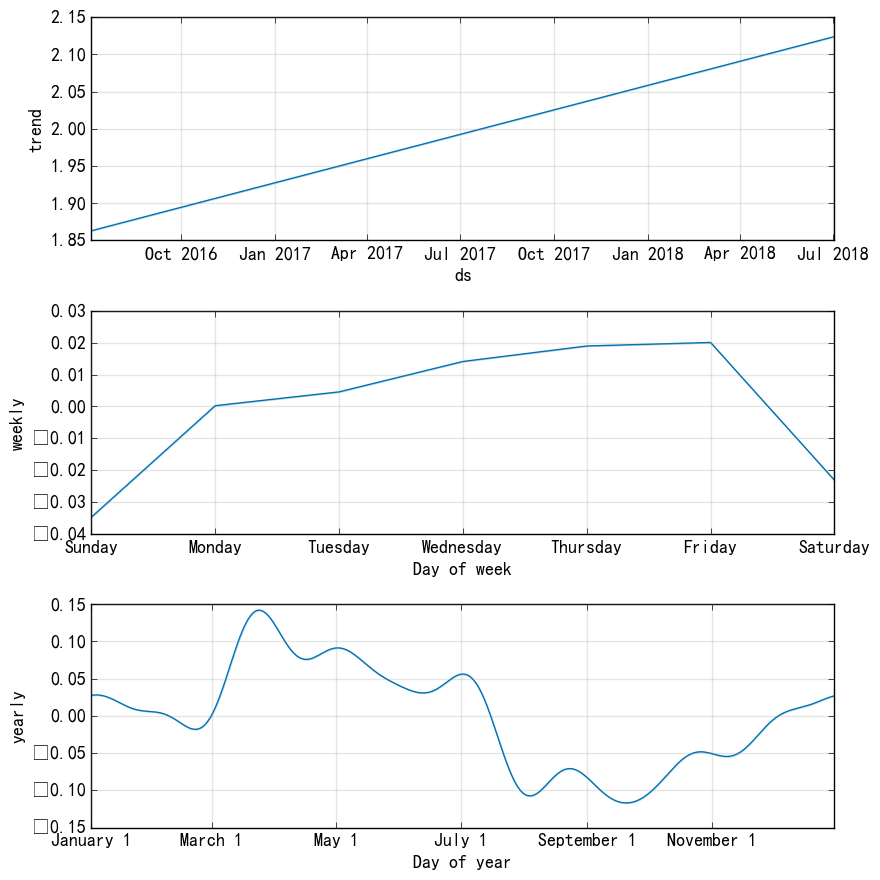

In [303]:
m.plot_components(forecast)

D:\Anaconda\lib\site-packages\ipykernel\__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app
D:\Anaconda\lib\site-packages\ipykernel\__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


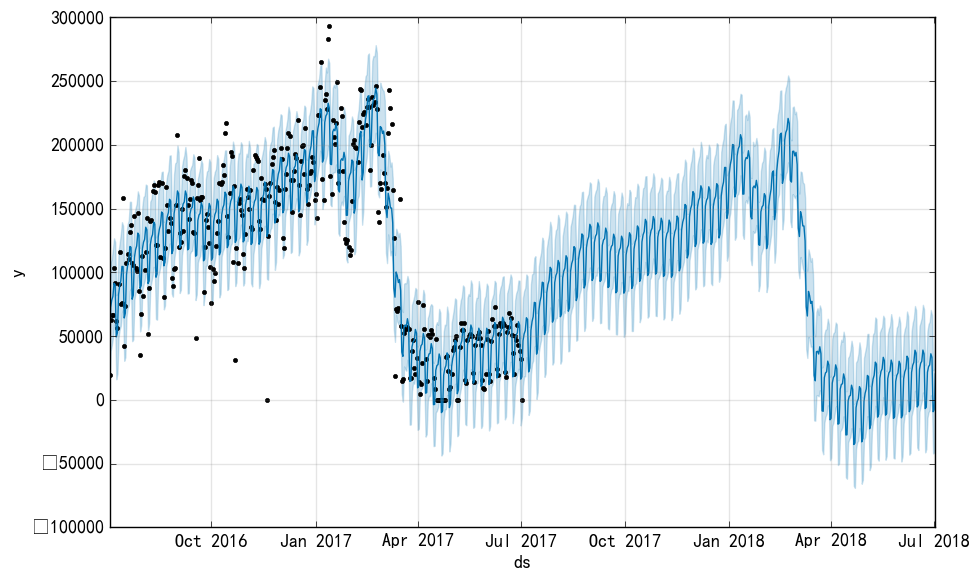

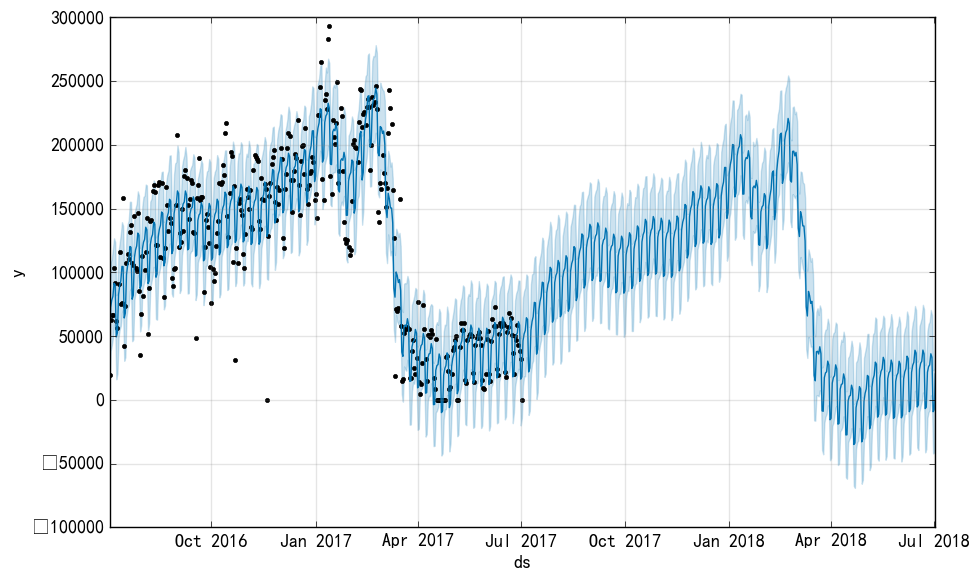

In [304]:
lujinAmount=platVolume[platVolume['wdzjPlatId']==59]
lujinAmount['y']=lujinAmount['amount']
lujinAmount['ds']=lujinAmount['date']
m=Prophet(yearly_seasonality=True)
m.fit(lujinAmount)
future=m.make_future_dataframe(periods=365)
forecast=m.predict(future)
m.plot(forecast)

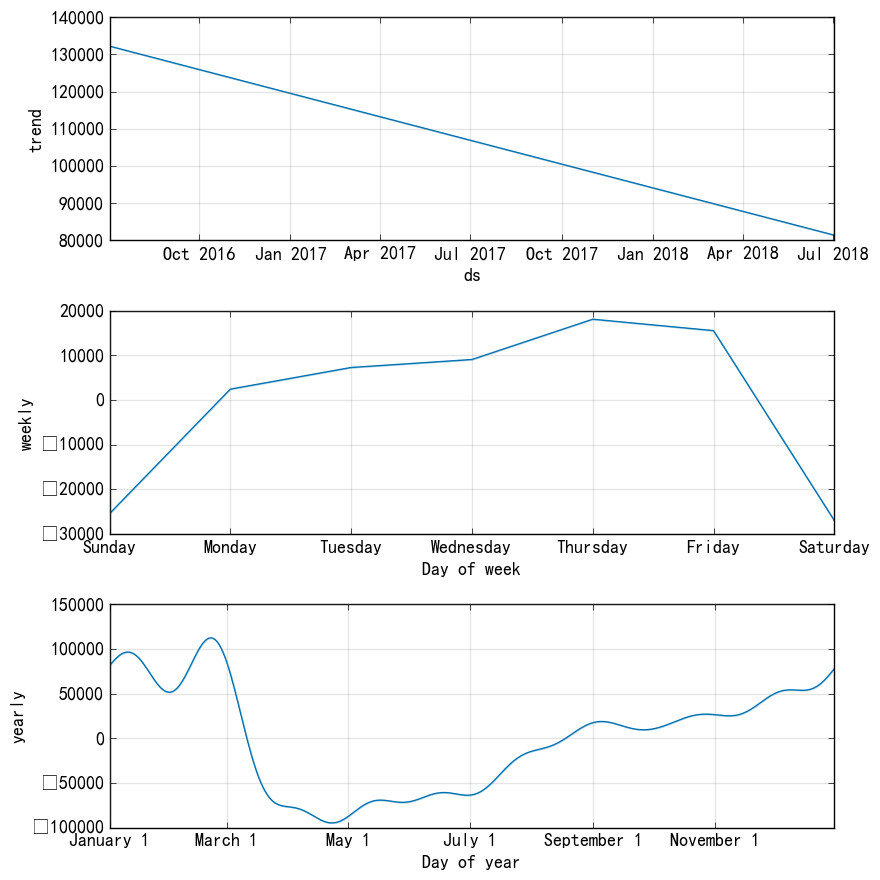

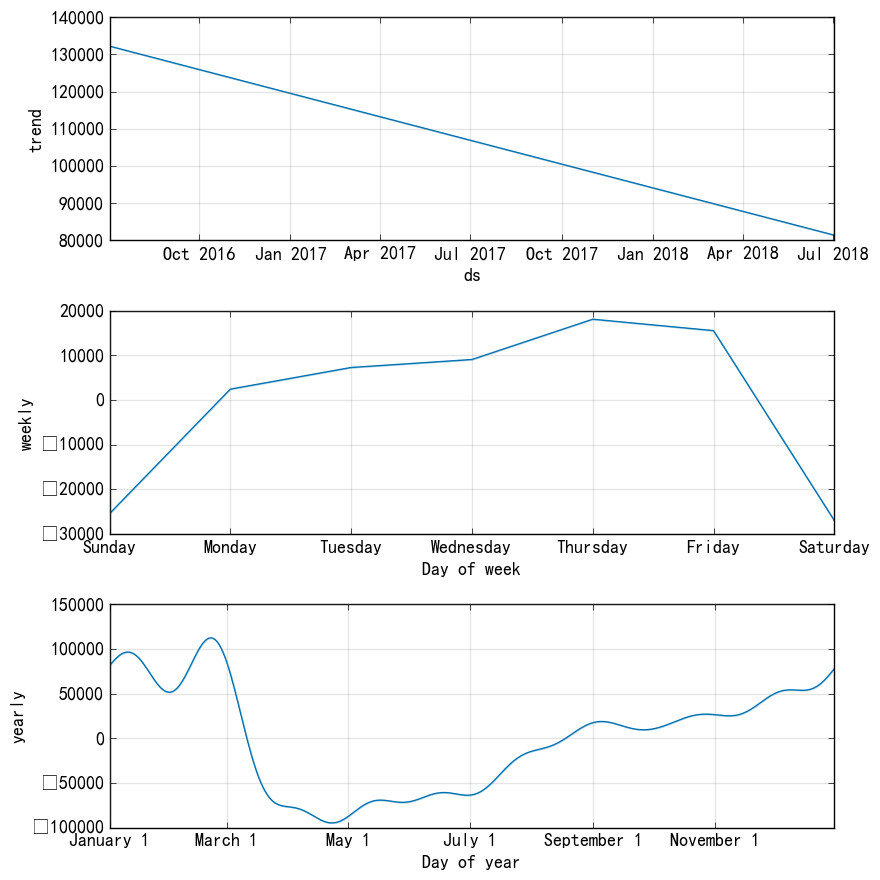

In [305]:
m.plot_components(forecast)

In [306]:
lujinToPayNum=toPayNumVSToReceiveNum[toPayNumVSToReceiveNum['wdzjPlatId']==59]
lujinToPayNum['ds']=lujinToPayNum['date']

D:\Anaconda\lib\site-packages\ipykernel\__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


In [307]:
lujinToPayNum['y']=lujinToPayNum['toPayNum']

D:\Anaconda\lib\site-packages\ipykernel\__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


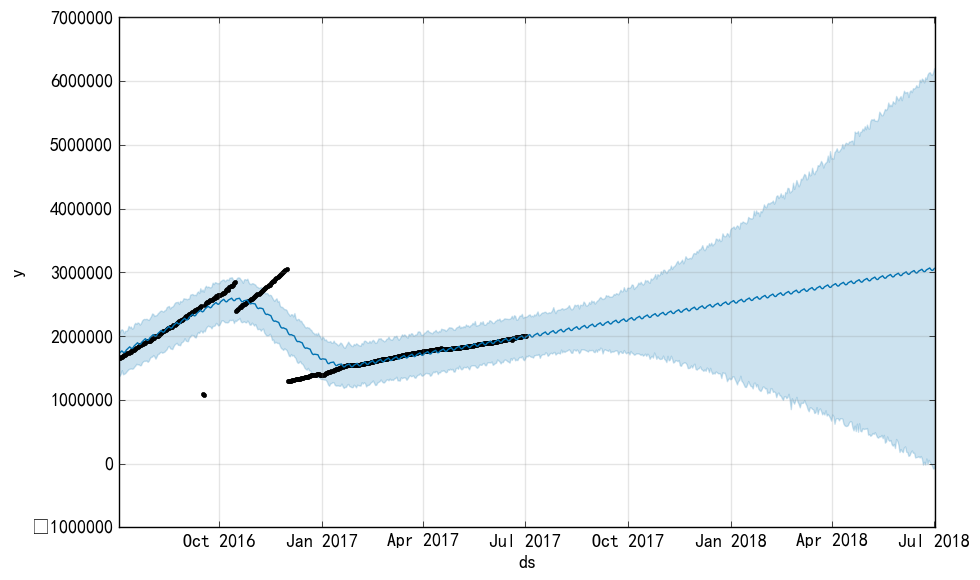

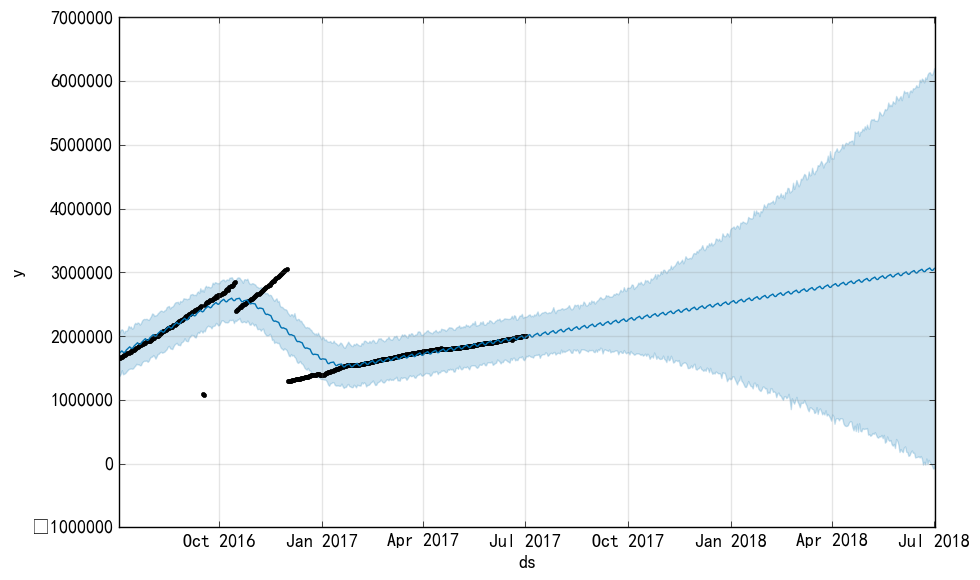

In [308]:
m=Prophet()
m.fit(lujinToPayNum)
future=m.make_future_dataframe(periods=365)
forecast=m.predict(future)
m.plot(forecast)

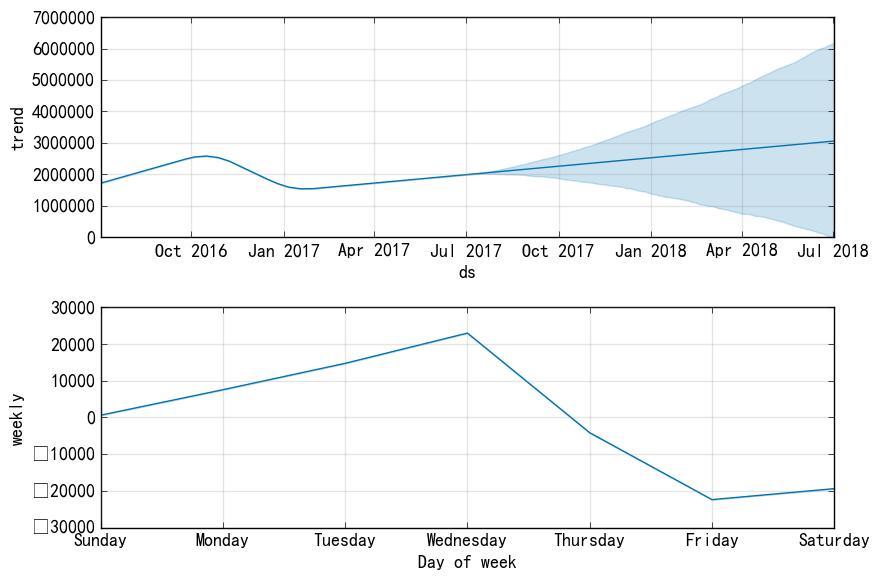

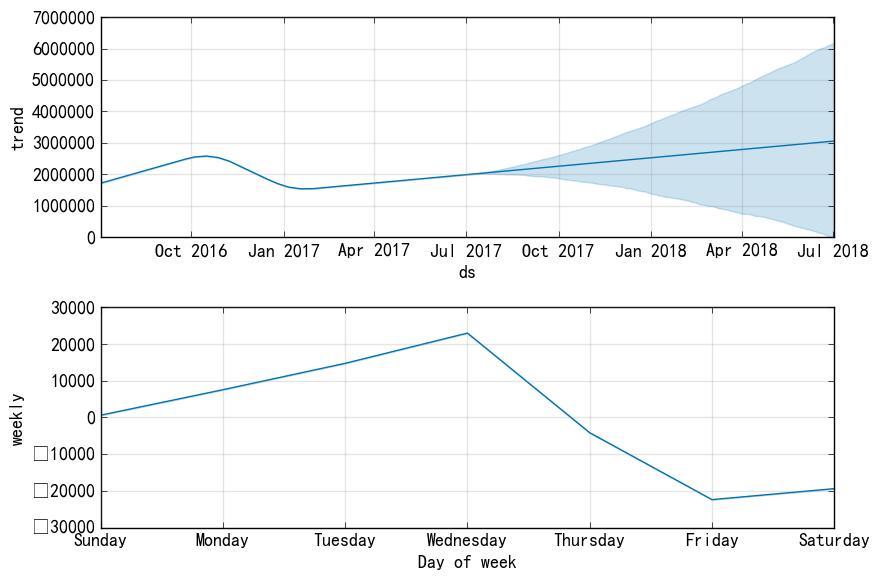

In [309]:
m.plot_components(forecast)

D:\Anaconda\lib\site-packages\ipykernel\__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


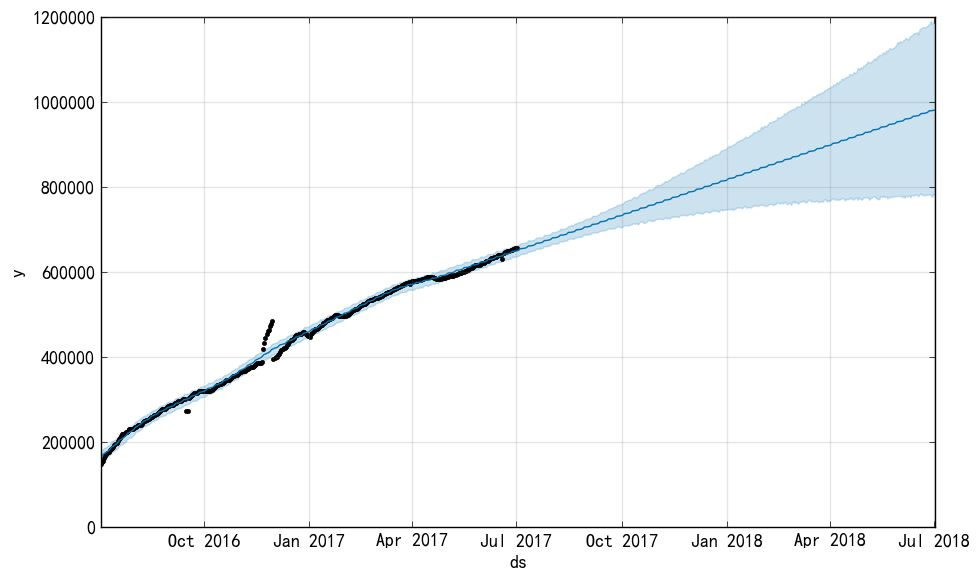

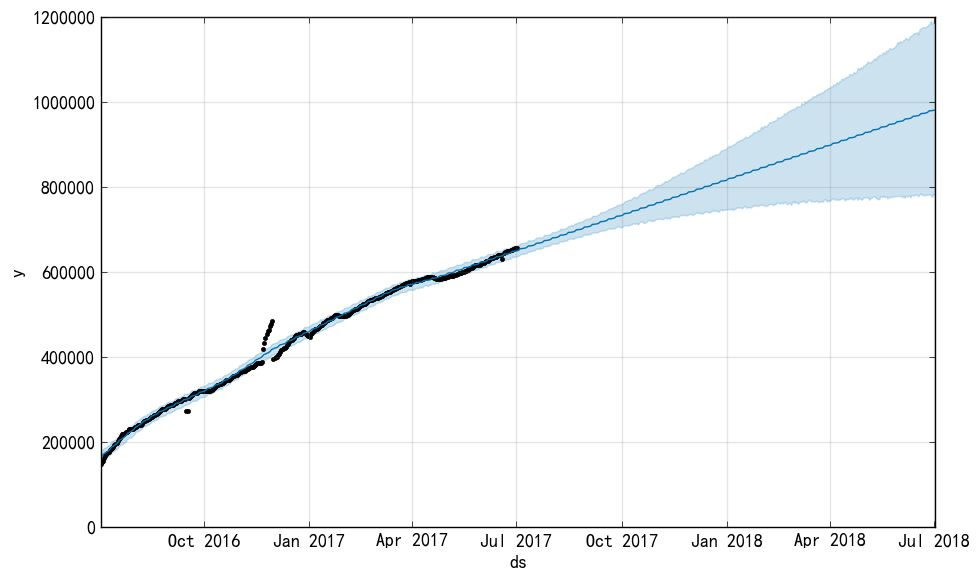

In [310]:
lujinToReceiveNum=lujinToPayNum
lujinToReceiveNum['y']=lujinToReceiveNum['toReceiveNum']
m=Prophet()
m.fit(lujinToReceiveNum)
future=m.make_future_dataframe(periods=365)
forecast=m.predict(future)
m.plot(forecast)

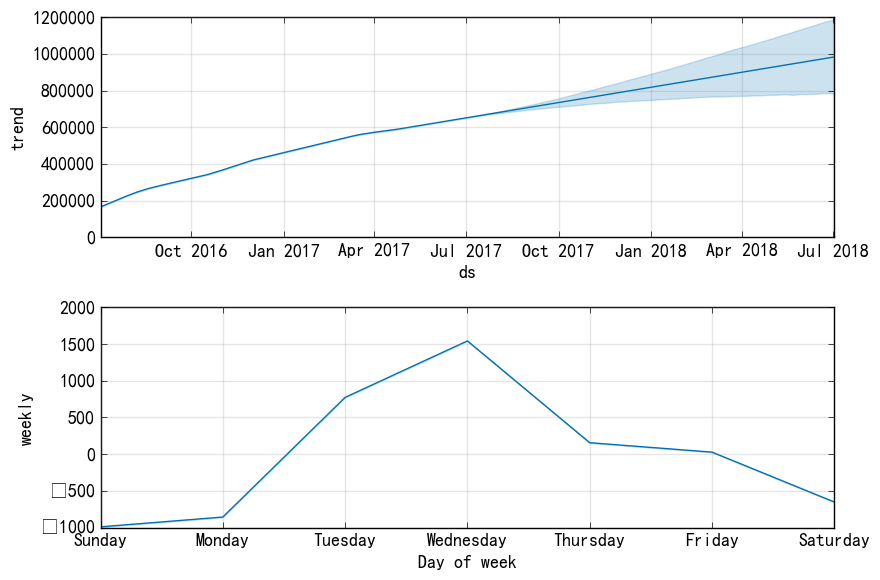

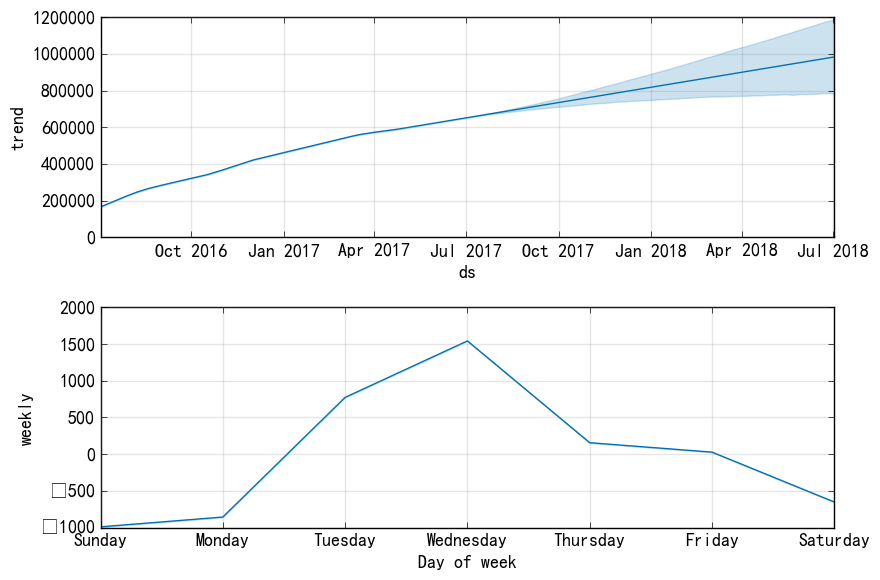

In [311]:
m.plot_components(forecast)

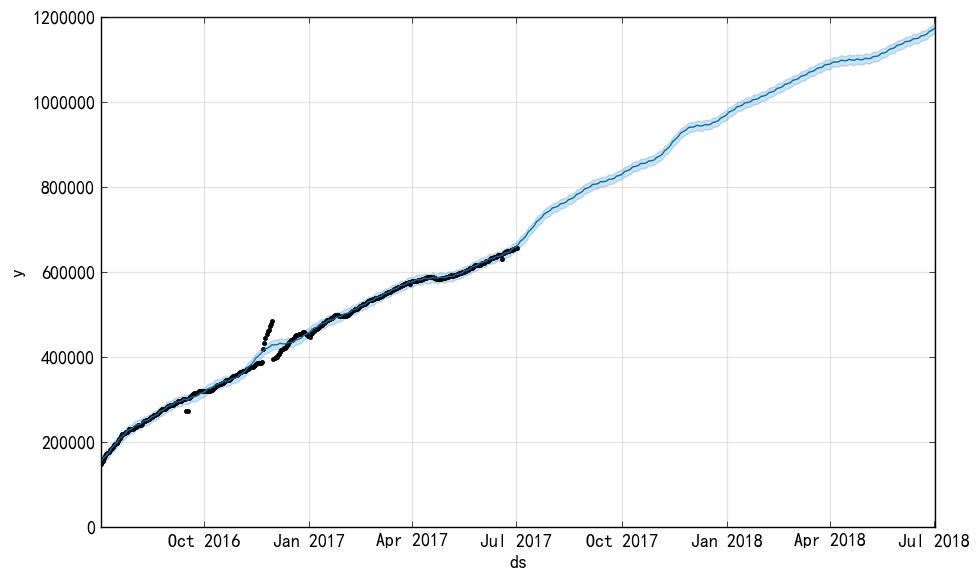

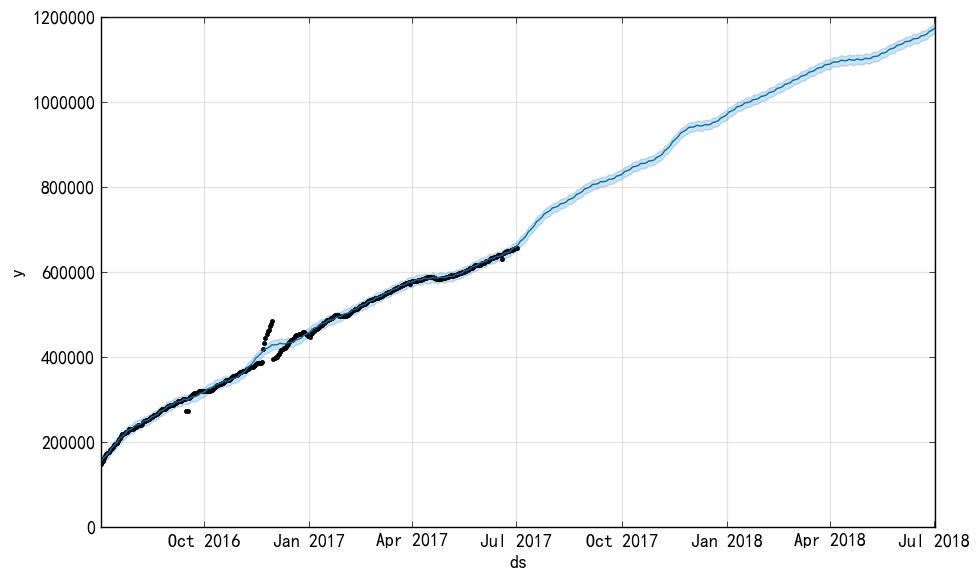

In [312]:
m=Prophet(yearly_seasonality=True)
m.fit(lujinToReceiveNum)
future=m.make_future_dataframe(periods=365)
forecast=m.predict(future)
m.plot(forecast)

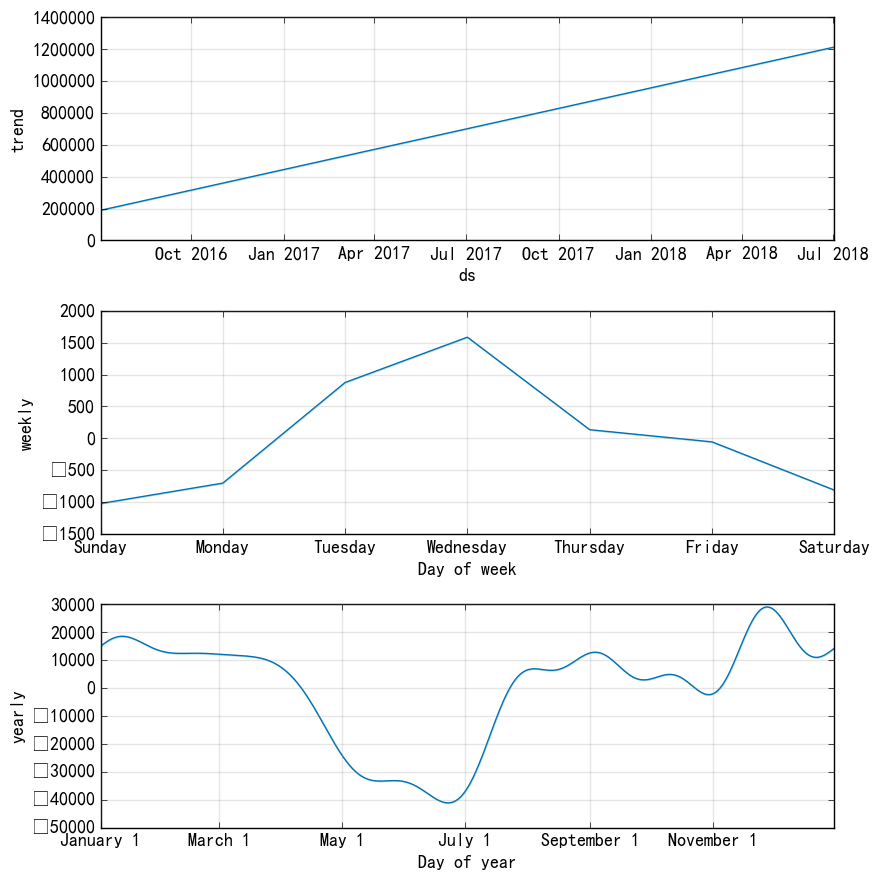

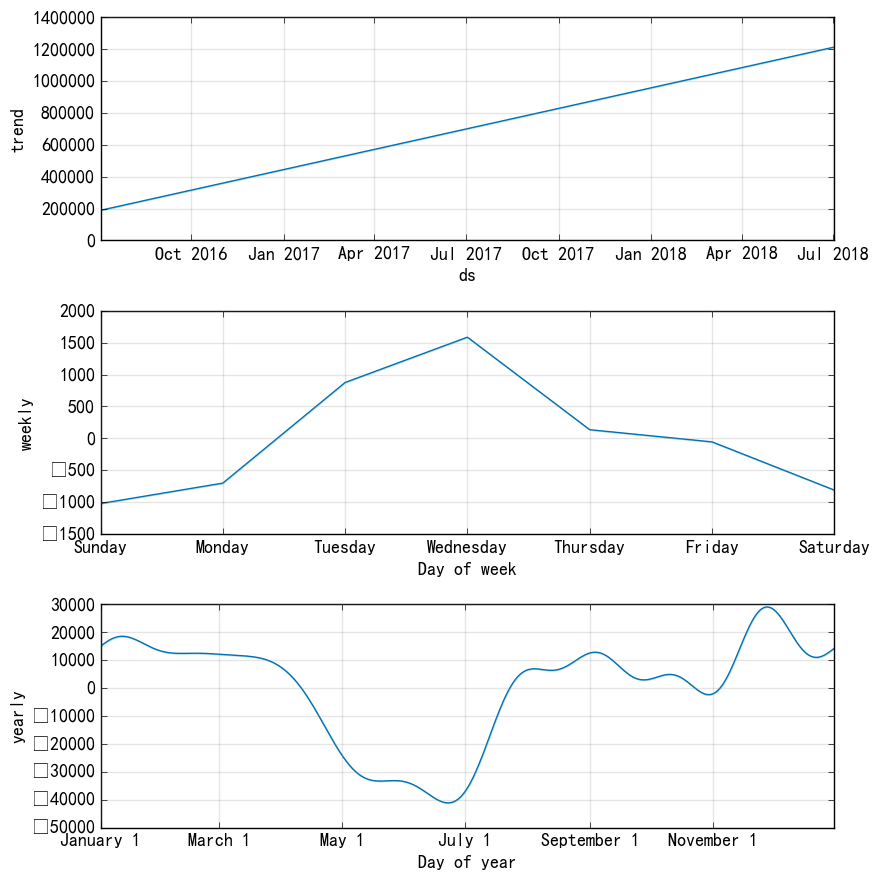

In [313]:
m.plot_components(forecast)

In [314]:
platDataDetail

,id_x,actualCapital,aliasName,association,associationDetail,autoBid,autoBidCode,bankCapital,bankFunds,bidSecurity,...,loanNum,loanPeriod,toPayNum,toReceiveNum,toPay10,toReceive10,id_y,date,toPay50,toReceive50
0,2144,8000.0,陆金所,1,2014年03月01日加入广西互联网金融协会任职务<br/>2016年03月25日加入中国互...,不支持,0.0,平安银行,1.0,-,...,32246.117808,19.566877,1.956933e+06,444608.161644,3.86,0.01,11,2017-05-31,8.42,0.03
1,2145,5000.0,红岭创投,1,2014年03月01日加入互联网金融专业委员会任会员职务<br/>2016年03月25日加入...,支持,1.0,NaN,0.0,VIP100%本金保障，非VIP享受50%本金垫付,...,9188.835616,1.728466,2.643148e+04,141577.778082,1.47,13.59,23,2017-05-31,5.44,38.12
2,2146,3938.0,小赢理财,0,NaN,支持,1.0,上海华瑞银行,1.0,众安保险承保,...,10707.600000,6.359589,3.123562e+05,55096.950685,41.77,8.65,35,2017-05-31,54.29,12.51
3,2147,12195.0,微贷网,1,2015年09月13日加入杭州市互联网金融协会任执行会长职务,支持,1.0,厦门银行,1.0,当天偿付,...,2830.764384,2.834384,1.606080e+05,156491.641096,3.24,0.63,47,2017-05-31,6.04,2.14
4,2148,3730.0,鑫合汇,1,2015年05月17日加入杭州市互联网金融协会任执行会长职务<br/>2016年08月19日...,支持,1.0,浙商银行,1.0,由第三方机构为鑫合汇融资项目提供担保服务,...,1865.293151,1.006767,2.478762e+03,46466.208219,4.69,58.58,59,2017-05-31,9.96,85.21
5,2149,20000.0,爱钱进,0,NaN,支持,1.0,华夏银行,1.0,风险准备金,...,152888.035616,30.356521,2.712699e+05,552702.208219,4.60,0.02,71,2017-05-31,6.37,0.07
6,2150,3793.0,团贷网,1,2014年03月07日加入东莞市互联网金融协会任会长单位职务<br/>2013年12月01日...,支持,1.0,厦门银行,1.0,VIP享有担保公司垫付本息，普通会员享有担保公司垫付本金,...,2847.731507,4.770712,8.389007e+04,137739.764384,1.46,3.13,83,2017-05-31,5.46,9.59
7,2151,5000.0,51人品,1,2016年09月13日加入杭州市互联网金融协会任副会长职务,支持,1.0,NaN,NaN,风险准备金,...,15514.421918,10.036795,6.602358e+05,500990.879452,0.45,0.03,95,2017-05-31,1.12,0.11
8,2152,6000.0,宜贷网,0,NaN,支持,1.0,恒丰银行,1.0,100％抵押标,...,8558.153425,4.069342,1.220307e+04,17445.347945,5.89,1.85,107,2017-05-31,11.84,7.30
9,2153,3000.0,宜人贷,0,NaN,不支持,0.0,广发银行,1.0,-,...,1195.498630,27.908877,4.492867e+05,734765.830137,0.75,0.02,119,2017-05-31,1.92,0.10
